In [ ]:
import pandas as pd
df = pd.read_csv("data.csv", index_col='date')

-1~1 정규화

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# 데이터 정규화
features_to_scale = ['past_day_close', 'Open', 'High', 'Low', 'Volume', 'Adj Close'] # nasdaq 지수만 정규화

scaler = MinMaxScaler(feature_range=(-1,1))
df[features_to_scale] = scaler.fit_transform(df[features_to_scale])

print(df.head(10))

            vader_sentiment  roberta_sentiment  past_day_close      Open  \
date                                                                       
2009-05-05           0.7712                  0       -0.989263 -0.990806   
2009-05-08           0.6468                  1       -0.994376 -0.993383   
2009-05-12           0.0000                 -1       -0.992755 -0.992368   
2009-05-12           0.3235                  0       -0.992755 -0.992368   
2009-05-13           0.7506                  0       -0.994410 -0.997363   
2009-05-14           0.0000                  1       -1.000000 -1.000000   
2009-05-15           0.3612                  0       -0.997297 -0.998372   
2009-05-19           0.0000                  0       -0.992634 -0.994088   
2009-05-20           0.0000                  1       -0.992399 -0.992287   
2009-05-21           0.6249                  1       -0.993123 -0.995950   

                High       Low    Volume  Adj Close  
date                             

sentiment 범위 확인

In [ ]:
# 최대값과 최소값 계산
vader_max = df['vader_sentiment'].max()
vader_min = df['vader_sentiment'].min()
roberta_max = df['roberta_sentiment'].max()
roberta_min = df['roberta_sentiment'].min()

# 결과 출력
print(f"VADER Sentiment - 최대값: {vader_max}, 최소값: {vader_min}")
print(f"Roberta Sentiment - 최대값: {roberta_max}, 최소값: {roberta_min}")

VADER Sentiment - 최대값: 0.9961, 최소값: -0.9963
Roberta Sentiment - 최대값: 1, 최소값: -1


In [ ]:
# VADER Sentiment 정규화
min_vader = vader_min
max_vader = vader_max

# 정규화: -1에서 1 사이로 변환
df['vader_sentiment'] = 2 * ((df['vader_sentiment'] - min_vader) / (max_vader - min_vader)) - 1

# LSTM

In [ ]:
import numpy as np

# 데이터셋 생성 함수 정의
def create_dataset(X, y, time_step=30):
    Xs, ys = [], []
    for i in range(len(X) - time_step):
        Xs.append(X[i:(i + time_step)])
        ys.append(y[i + time_step])
    return np.array(Xs), np.array(ys)

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

# 예측 및 성능 평가 함수 정의
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r_squared = r2_score(y_test, y_pred)
    return mse, rmse, r_squared

In [ ]:
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, Input
from keras.callbacks import EarlyStopping
from keras.optimizers import Adam

# LSTM 모델 정의
def create_model():
    model = Sequential()
    model.add(Input(shape=(X_train.shape[1], X_train.shape[2])))  # Input 레이어 추가
    model.add(LSTM(100, return_sequences=True))
    model.add(Dropout(0.2))
    model.add(LSTM(100))
    model.add(Dropout(0.2))
    model.add(Dense(1, activation='tanh'))  # -1~1 정규화해서 출력층 tanh 함수
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    return model

# EarlyStopping 콜백 정의
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

input : VADER

In [ ]:
from sklearn.model_selection import train_test_split

vader = ['vader_sentiment']

X, y = create_dataset(df[vader].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [ ]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])

    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)

    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 32, MSE: 0.981, RMSE: 0.990, R-squared: -15.267
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Batch Size: 64, MSE: 0.959, RMSE: 0.980, R-squared: -14.910
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 128, MSE: 0.732, RMSE: 0.856, R-squared: -11.144
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 256, MSE: 1.173, RMSE: 1.083, R-squared: -18.451
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 512, MSE: 1.178, RMSE: 1.086, R-squared: -18.539
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 1024, MSE: 1.196, RMSE: 1.094, R-squared: -18.831


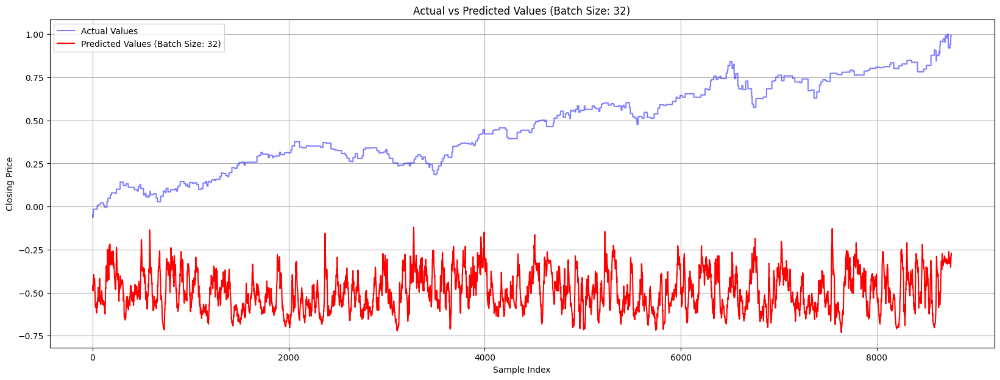

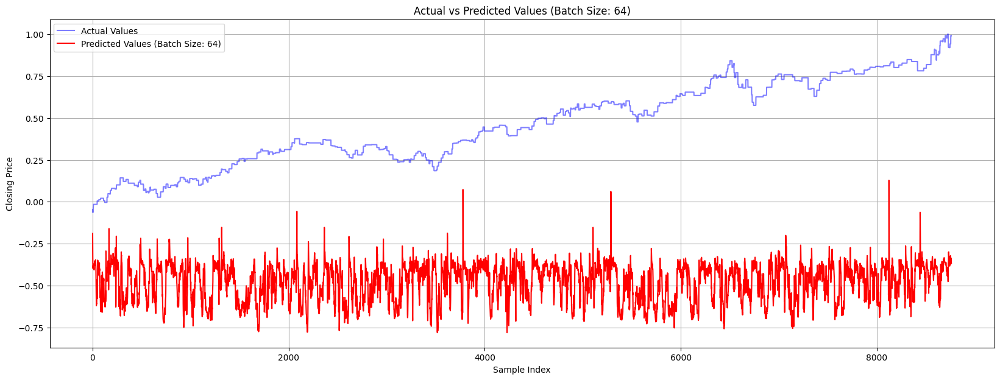

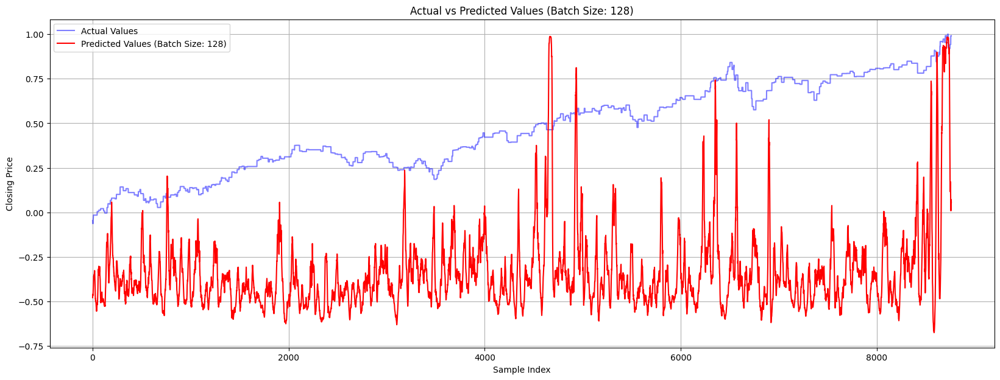

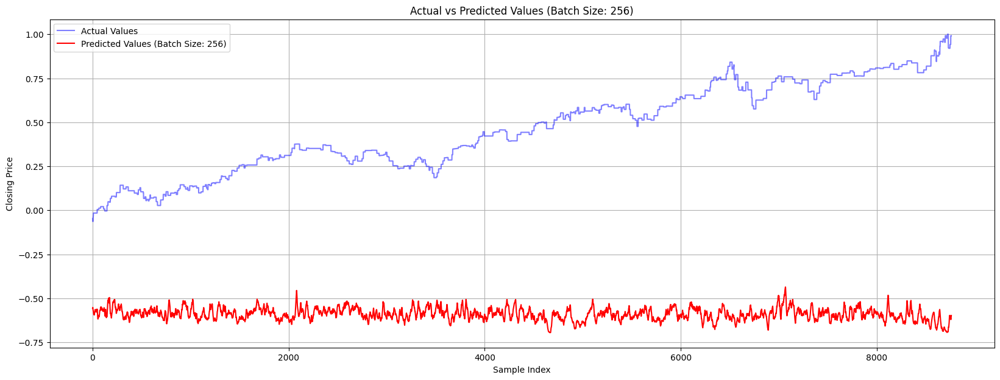

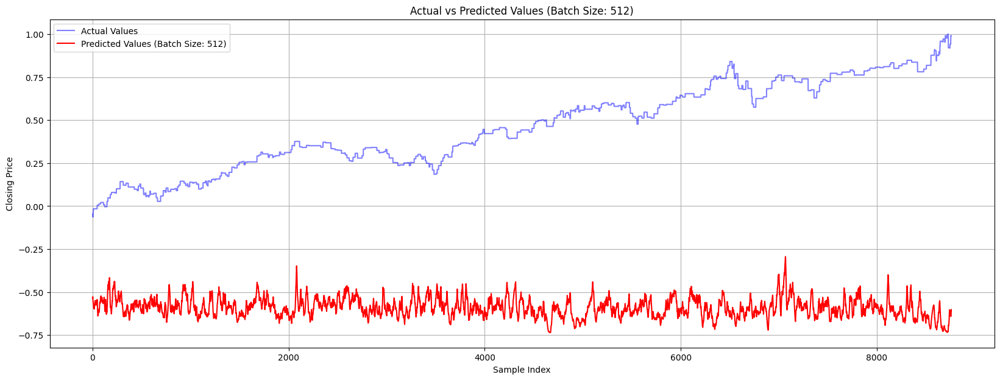

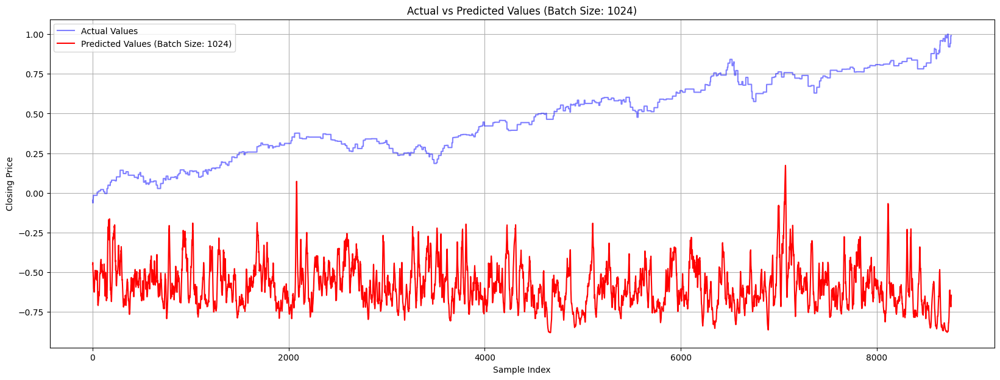

In [ ]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))

    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)

    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')

    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

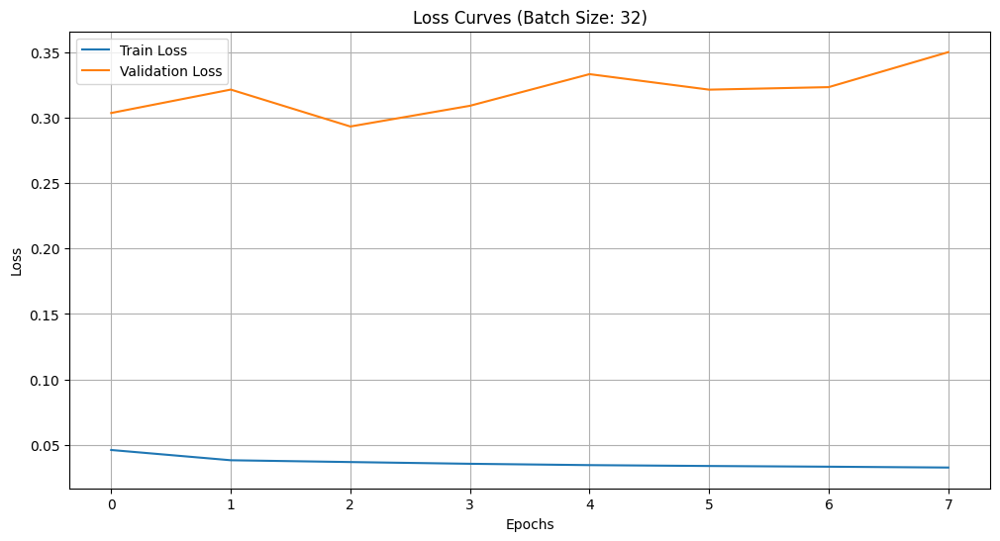

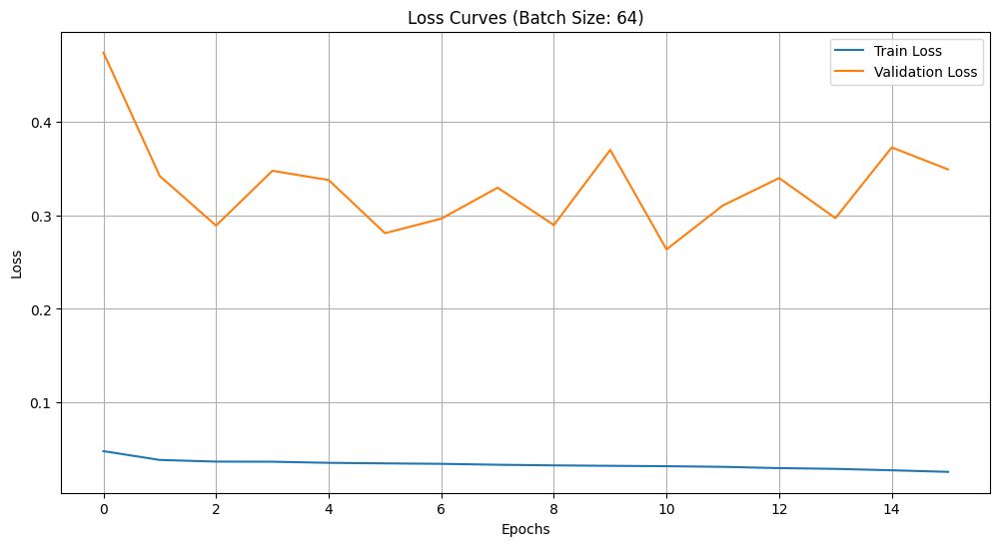

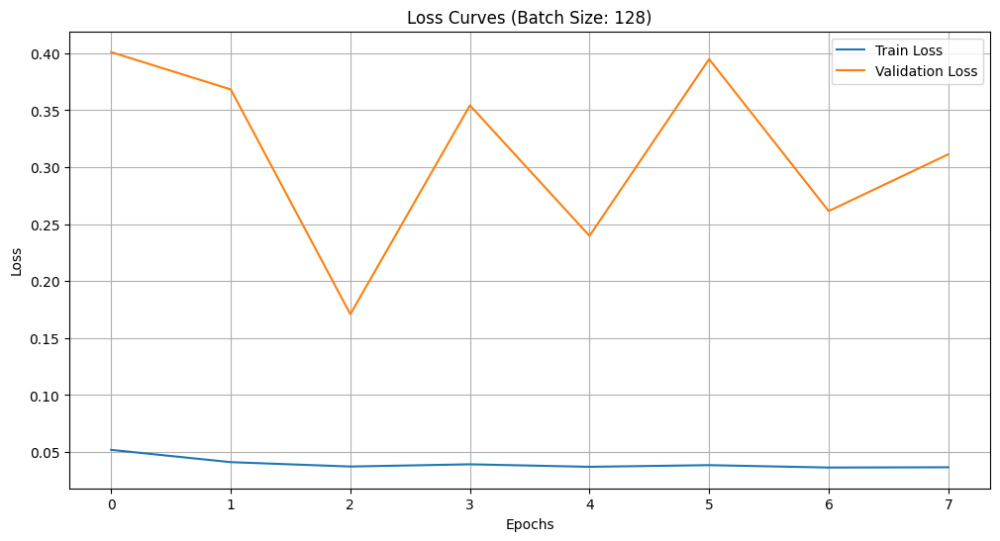

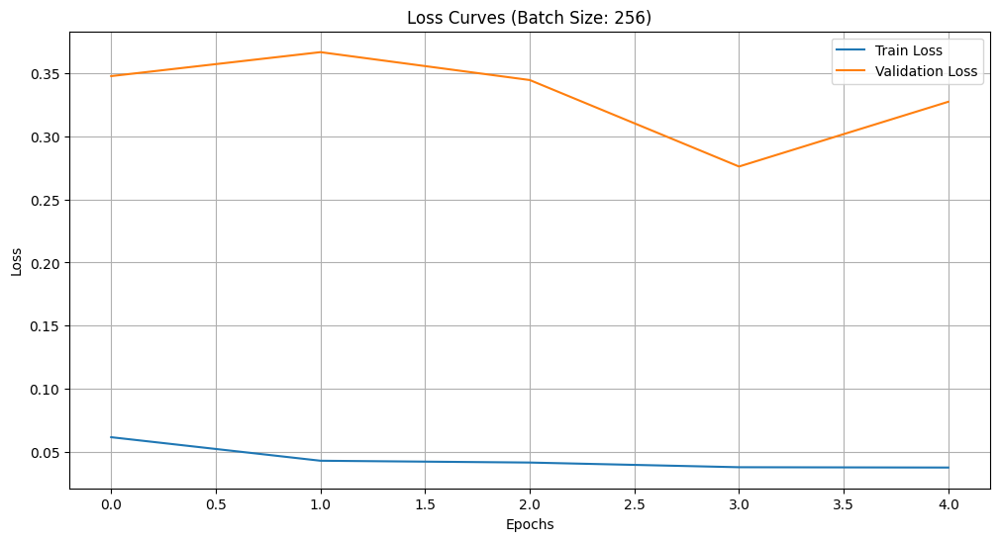

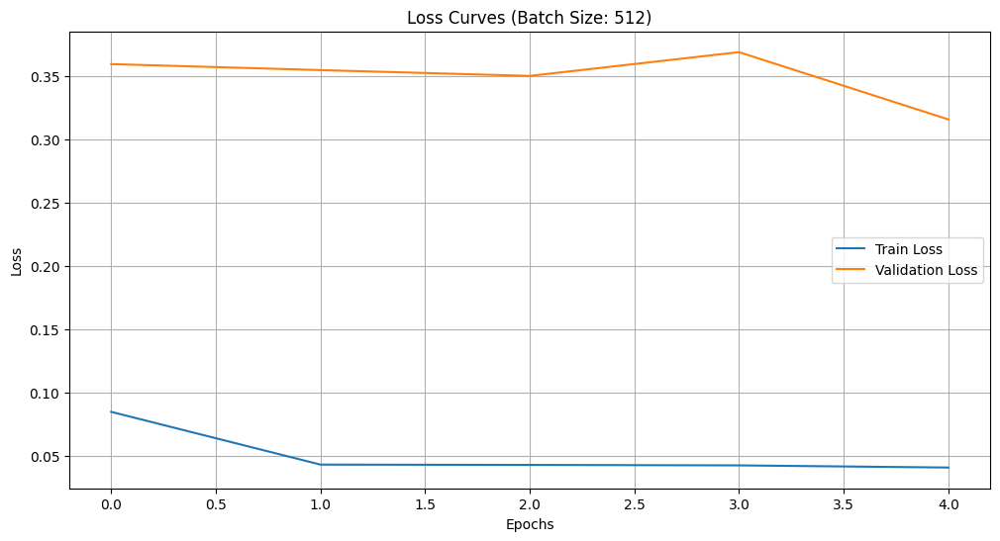

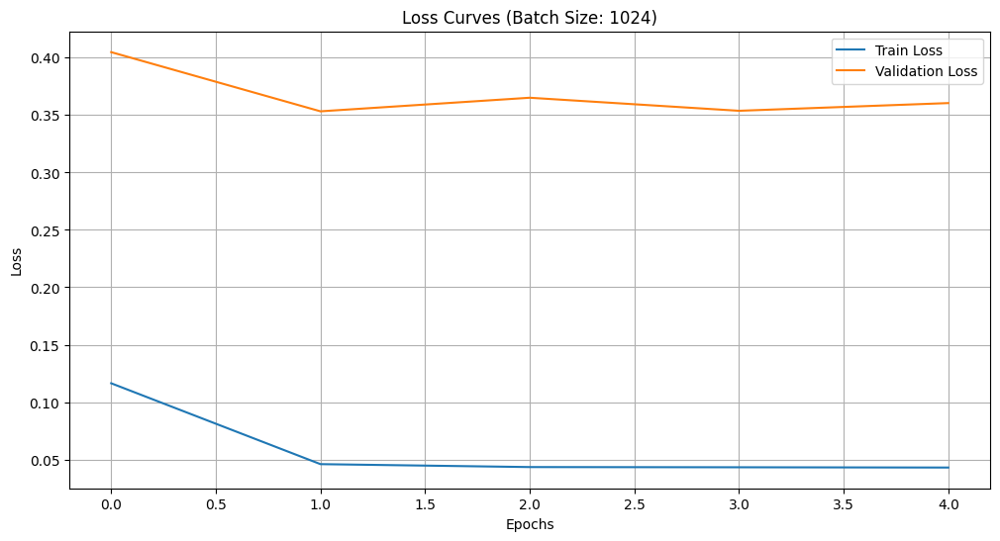

In [ ]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

input : RoBERTa

In [ ]:
from sklearn.model_selection import train_test_split

roberta = ['roberta_sentiment']

X, y = create_dataset(df[roberta].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [ ]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])

    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)

    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 32, MSE: 1.133, RMSE: 1.064, R-squared: -17.783
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 64, MSE: 1.002, RMSE: 1.001, R-squared: -15.616
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 128, MSE: 1.081, RMSE: 1.040, R-squared: -16.930
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 256, MSE: 1.129, RMSE: 1.062, R-squared: -17.713
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 512, MSE: 1.190, RMSE: 1.091, R-squared: -18.729
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 1024, MSE: 1.145, RMSE: 1.070, R-squared: -17.994


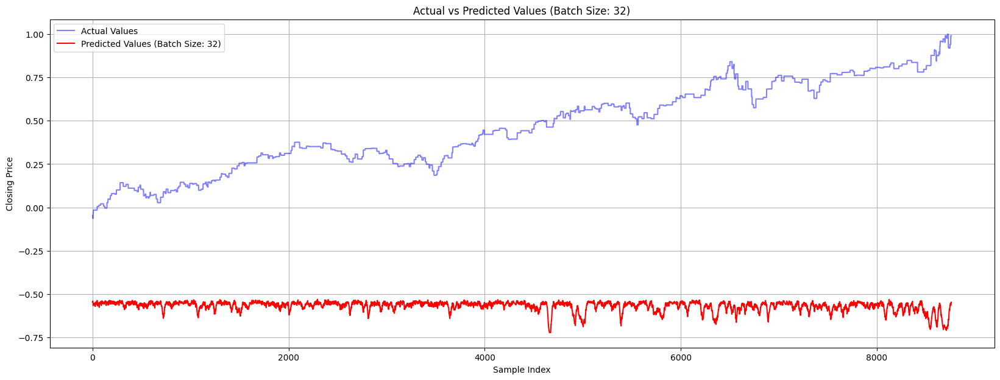

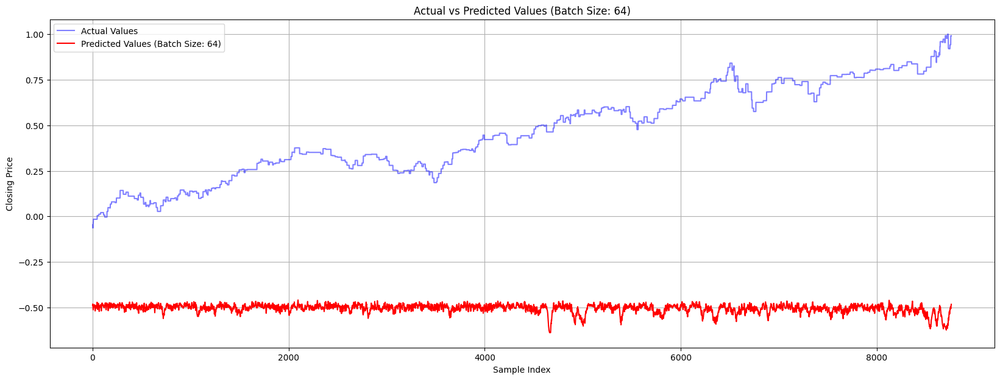

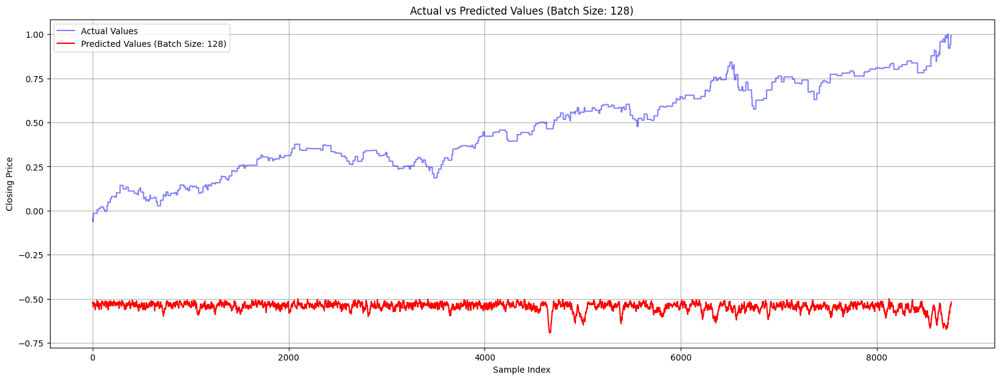

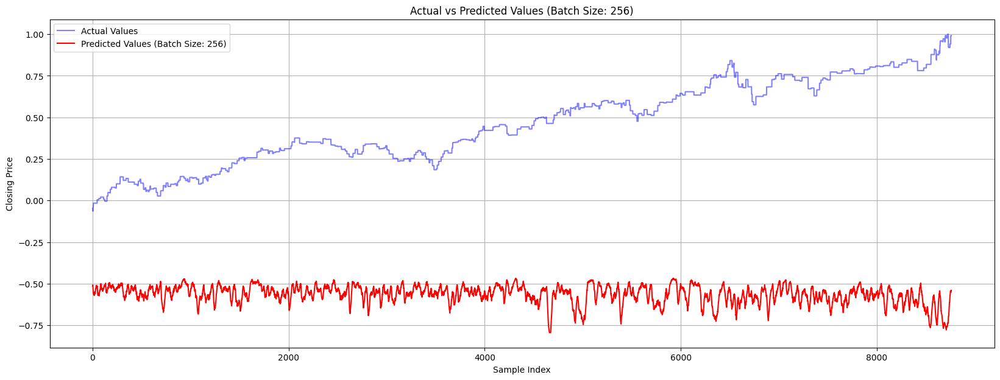

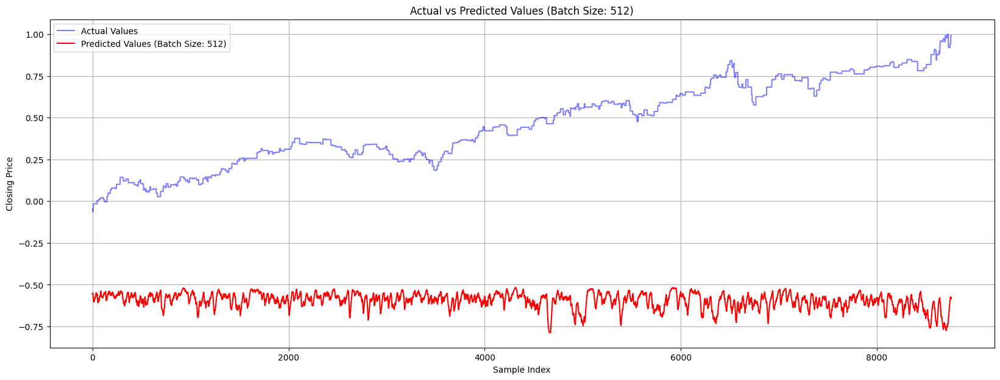

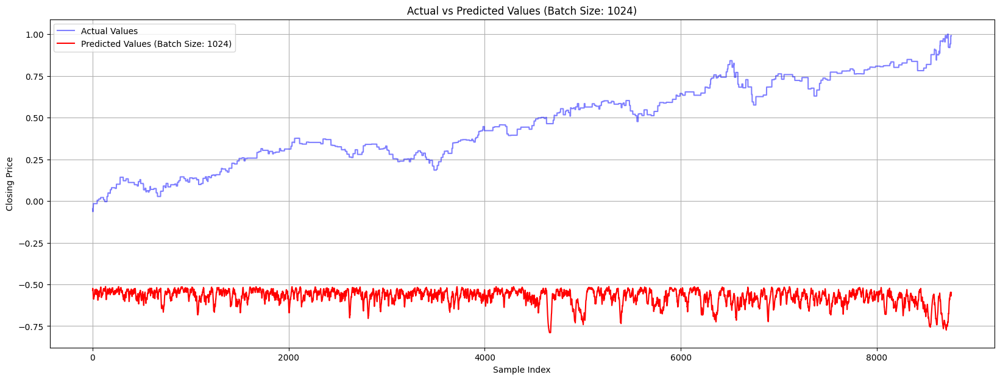

In [ ]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))

    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)

    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')

    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

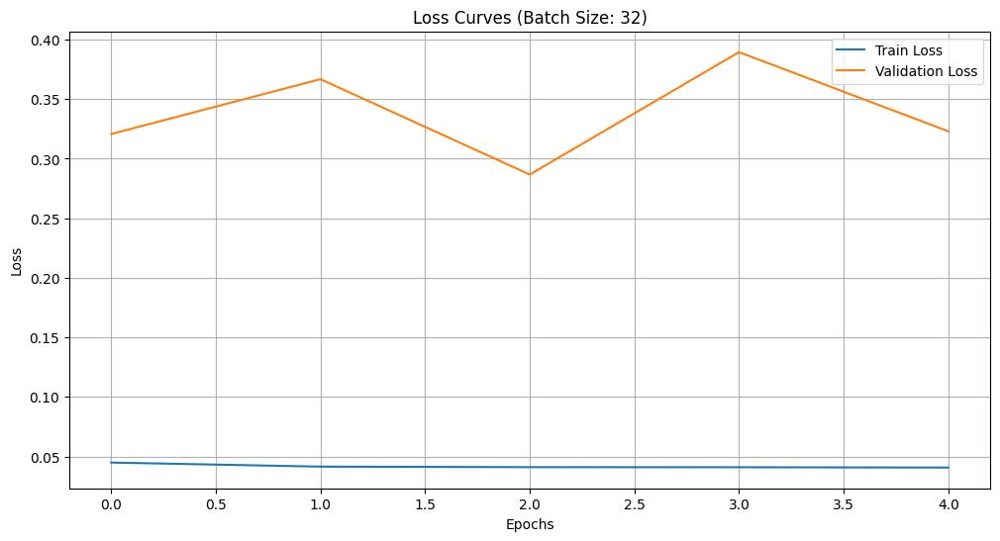

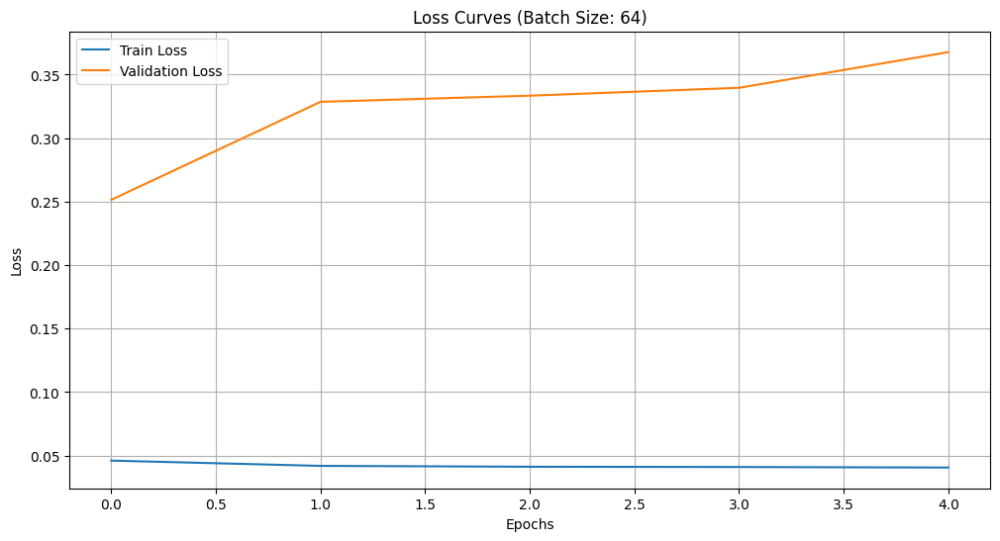

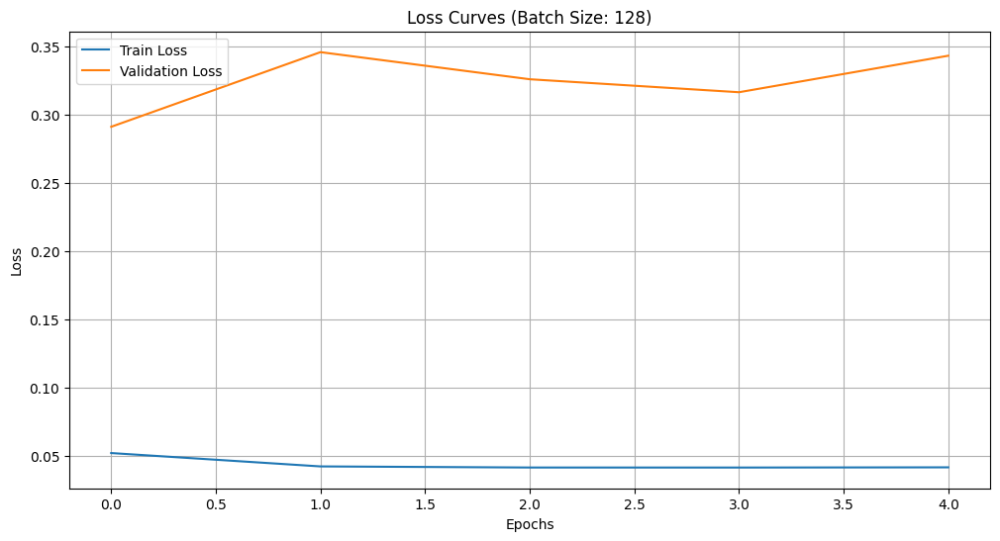

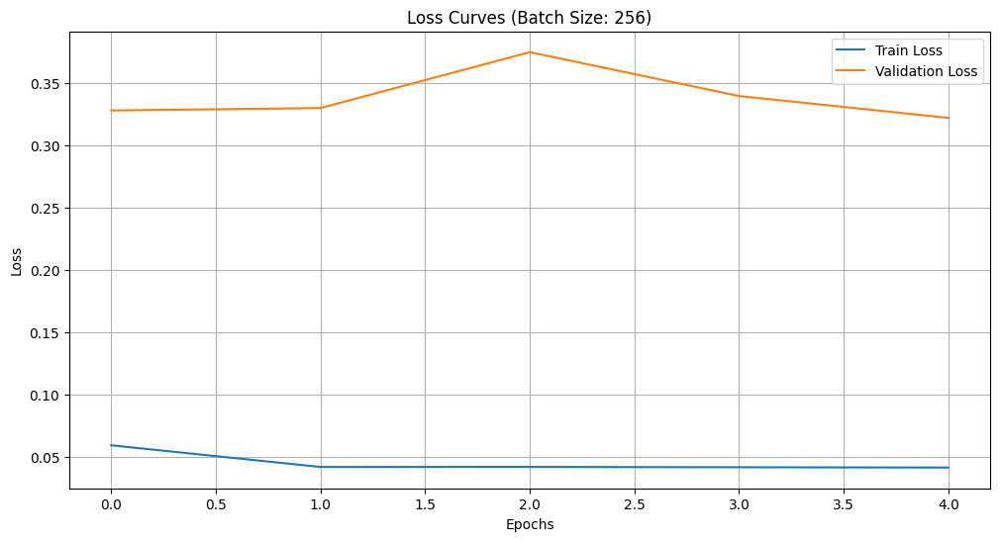

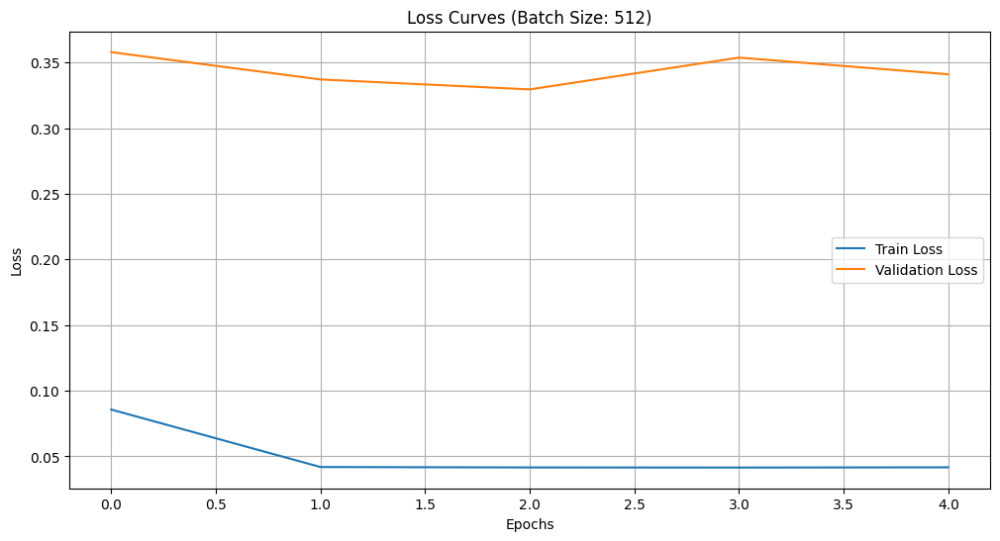

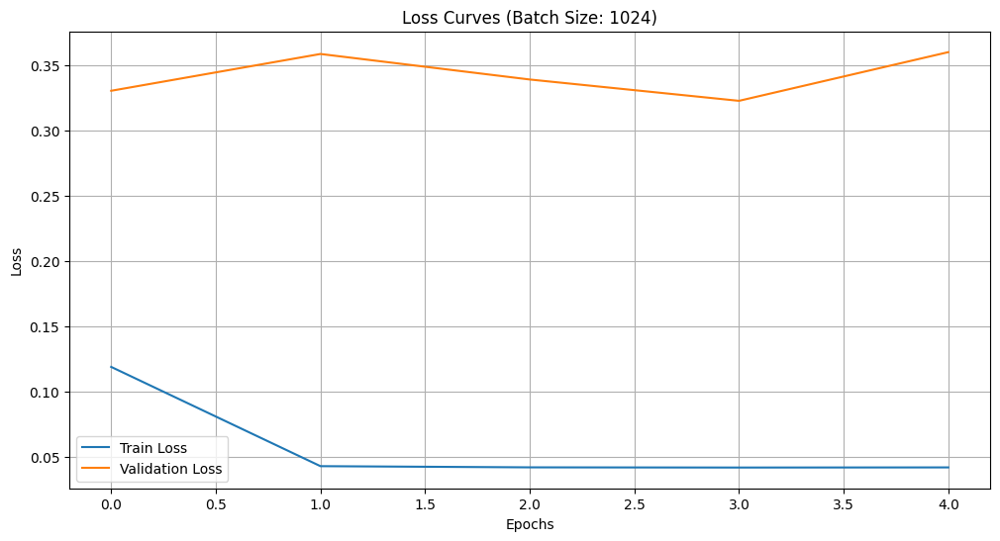

In [ ]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

input : VADER + RoBERTa

In [ ]:
from sklearn.model_selection import train_test_split

sentiment = ['vader_sentiment', 'roberta_sentiment']

X, y = create_dataset(df[sentiment].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [ ]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])

    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)

    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Batch Size: 32, MSE: 1.120, RMSE: 1.058, R-squared: -17.574
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 64, MSE: 1.219, RMSE: 1.104, R-squared: -19.205
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 128, MSE: 1.258, RMSE: 1.122, R-squared: -19.864
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 256, MSE: 1.131, RMSE: 1.063, R-squared: -17.752
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 512, MSE: 1.178, RMSE: 1.085, R-squared: -18.533
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
Batch Size: 1024, MSE: 1.252, RMSE: 1.119, R-squared: -19.755


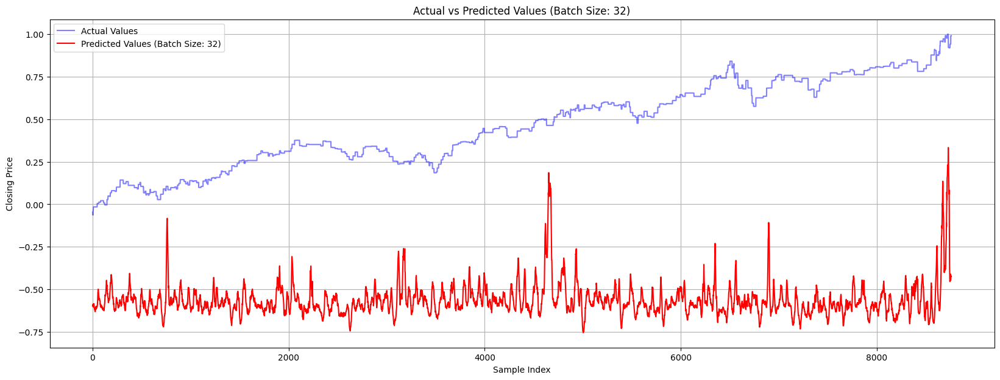

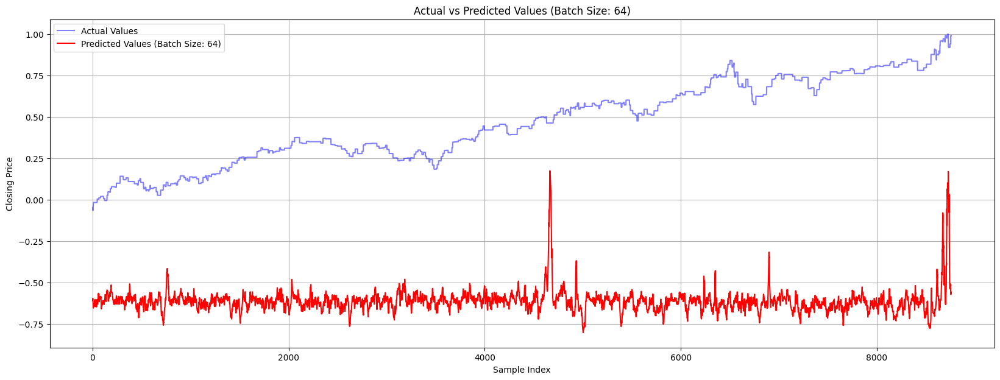

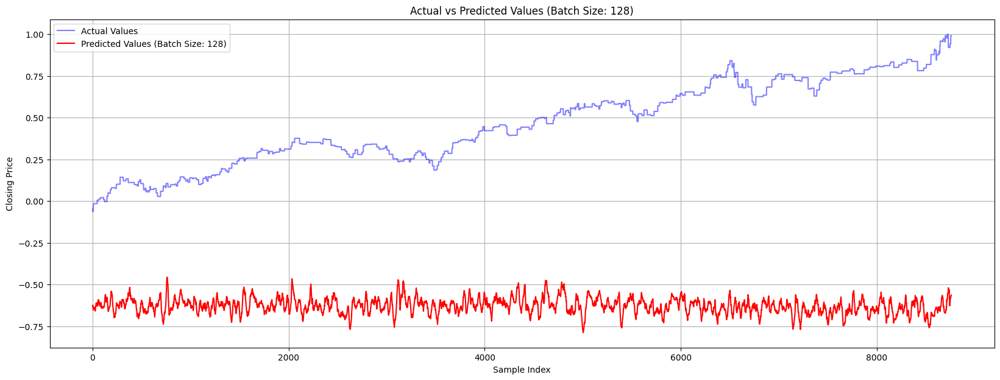

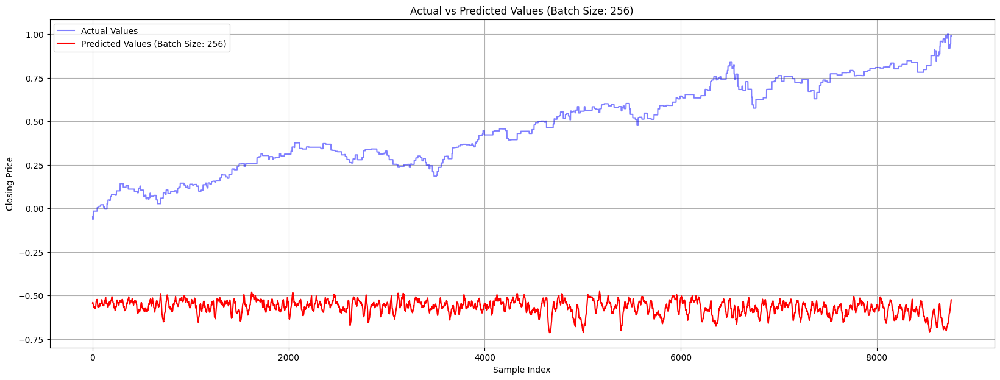

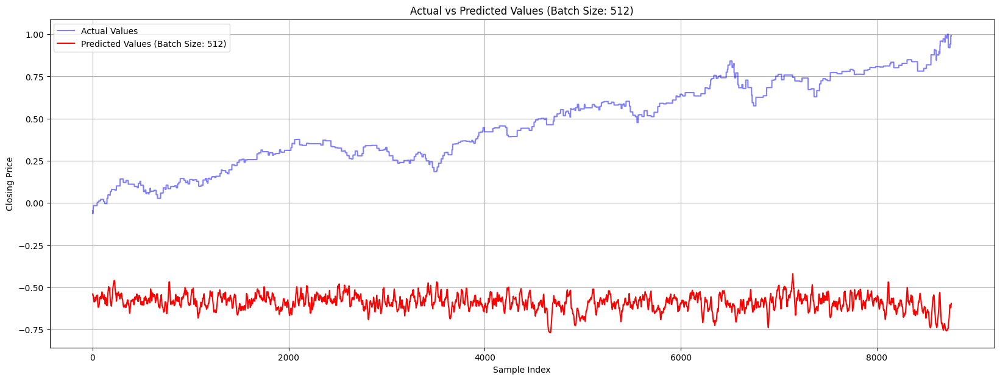

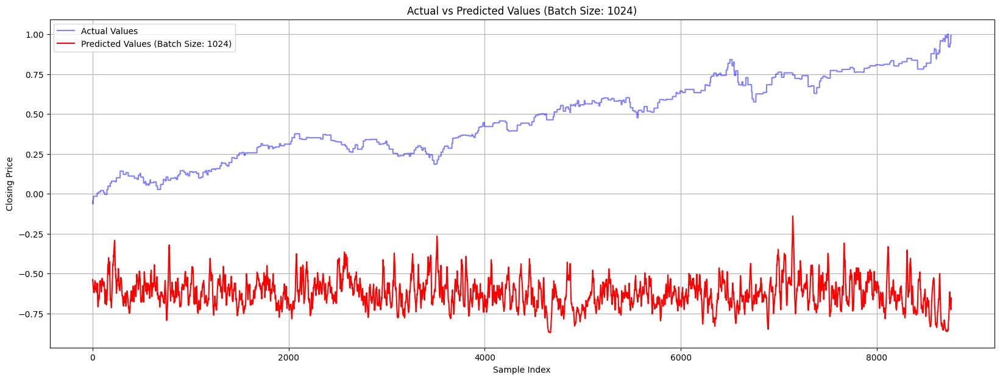

In [ ]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))

    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)

    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')

    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

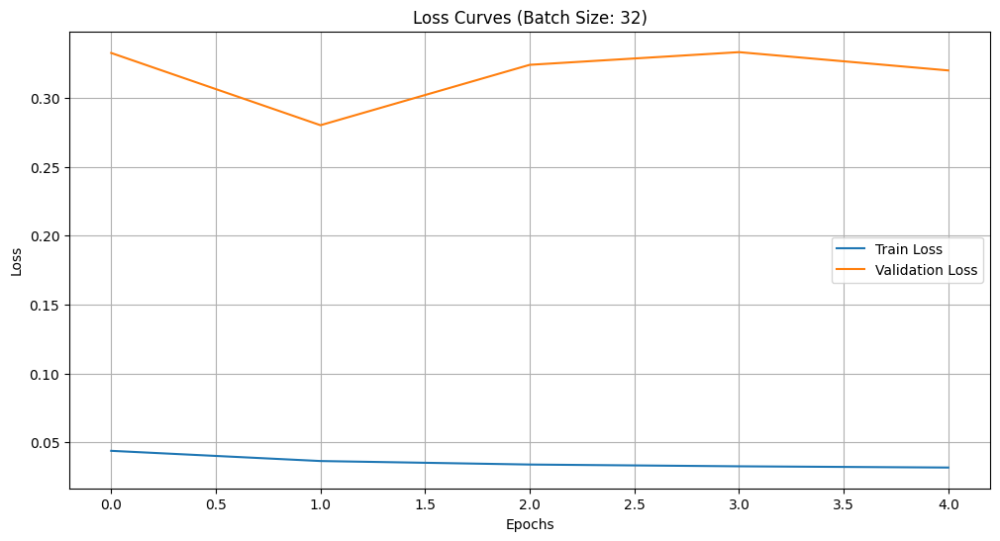

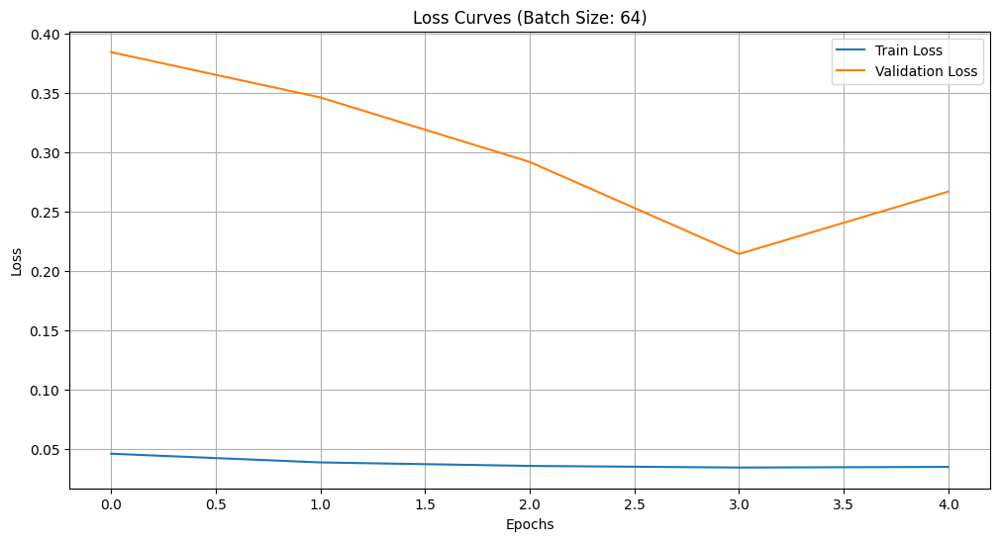

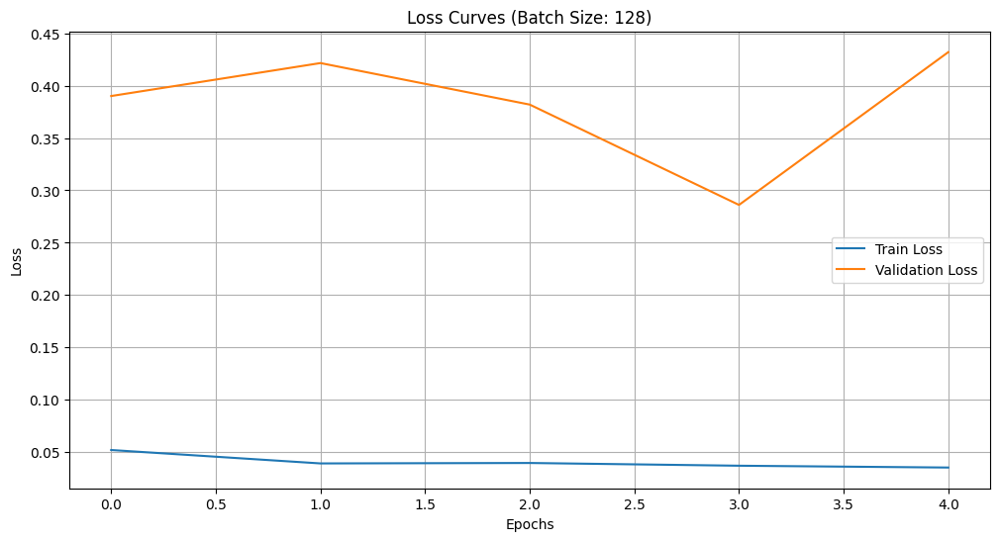

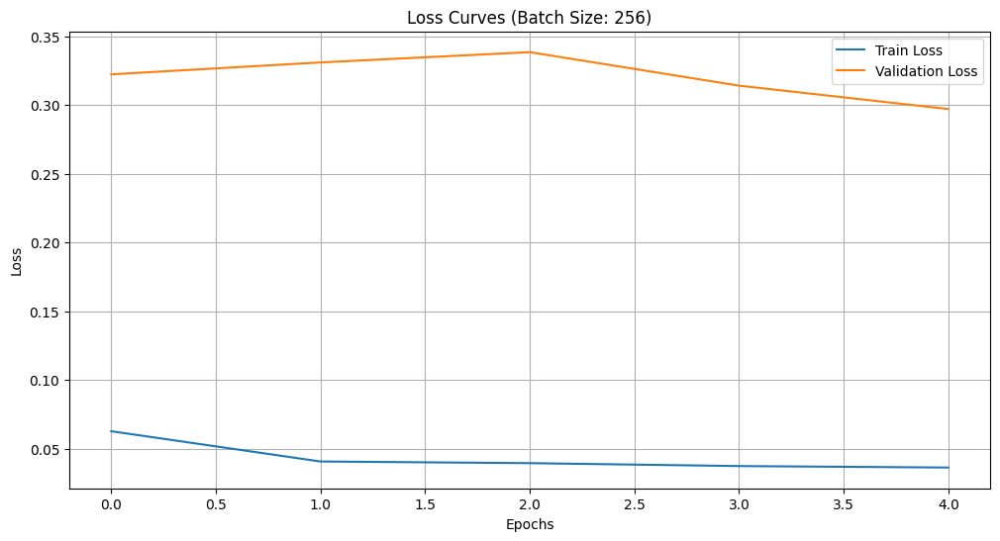

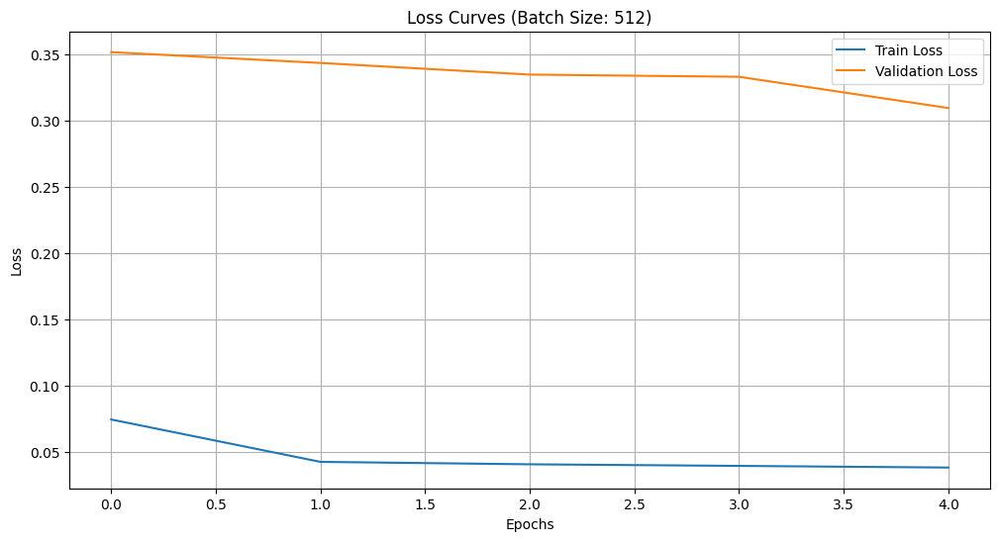

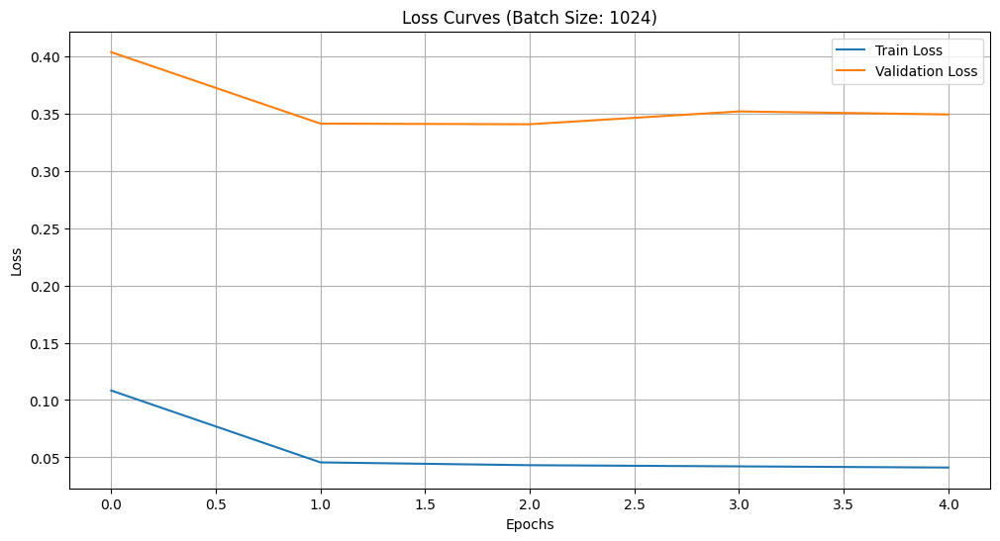

In [ ]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

input : past_day_close

In [ ]:
from sklearn.model_selection import train_test_split

past_day_close = ['past_day_close']

X, y = create_dataset(df[past_day_close].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [ ]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])

    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)

    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 32, MSE: 0.014, RMSE: 0.119, R-squared: 0.765
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 64, MSE: 0.040, RMSE: 0.200, R-squared: 0.338
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 128, MSE: 0.032, RMSE: 0.179, R-squared: 0.469
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 256, MSE: 0.010, RMSE: 0.099, R-squared: 0.838
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 512, MSE: 0.005, RMSE: 0.072, R-squared: 0.913
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 1024, MSE: 0.005, RMSE: 0.068, R-squared: 0.922


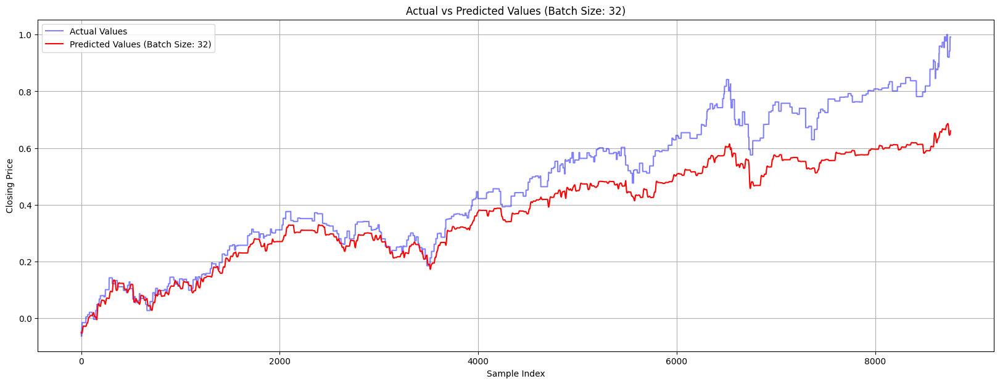

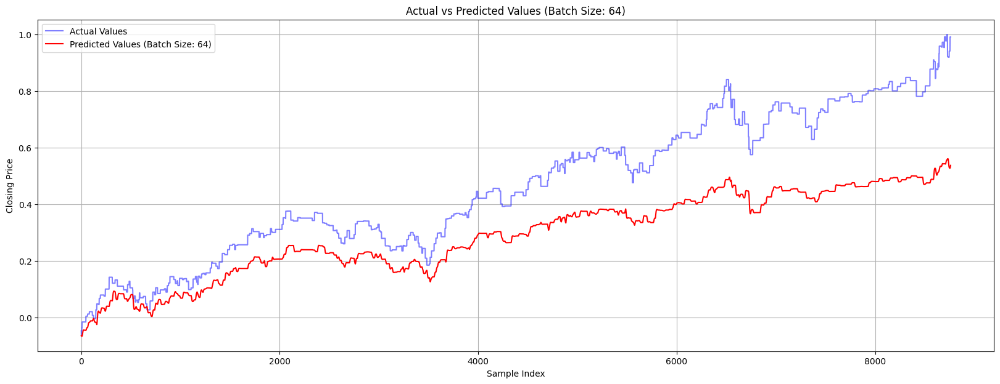

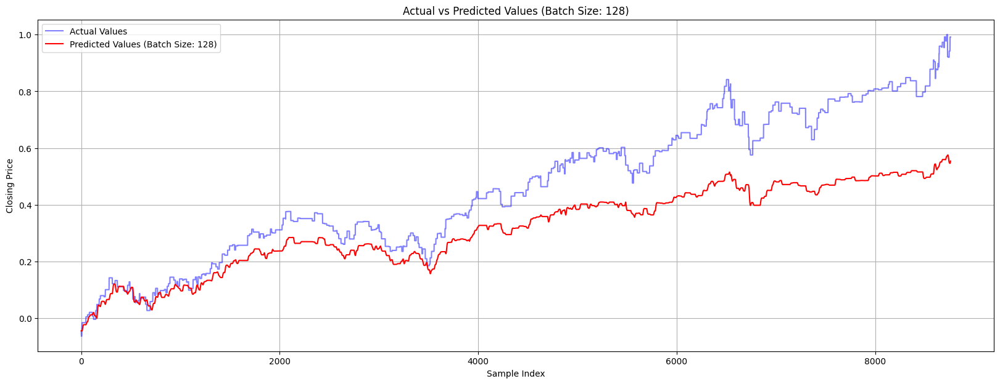

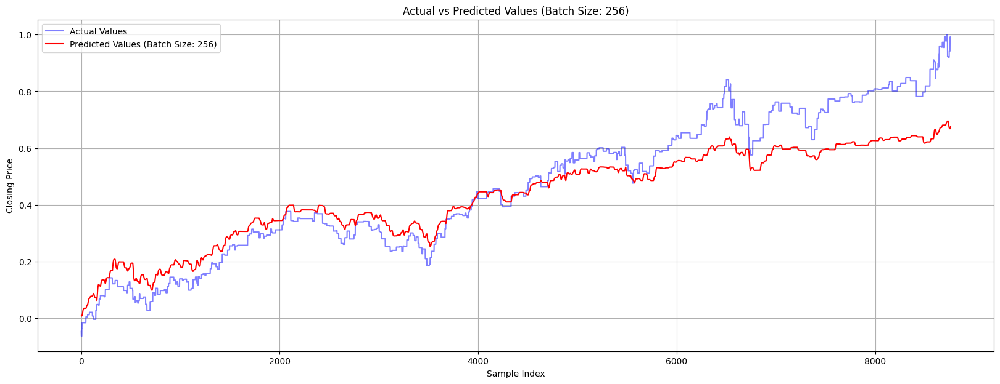

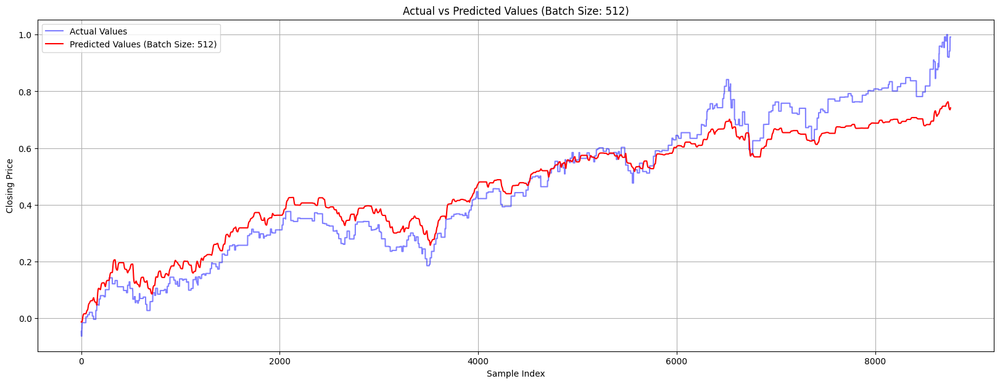

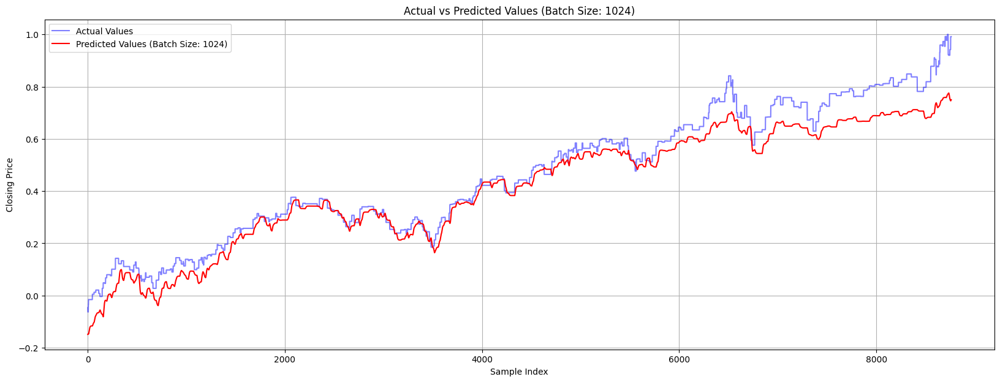

In [ ]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))

    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)

    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')

    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

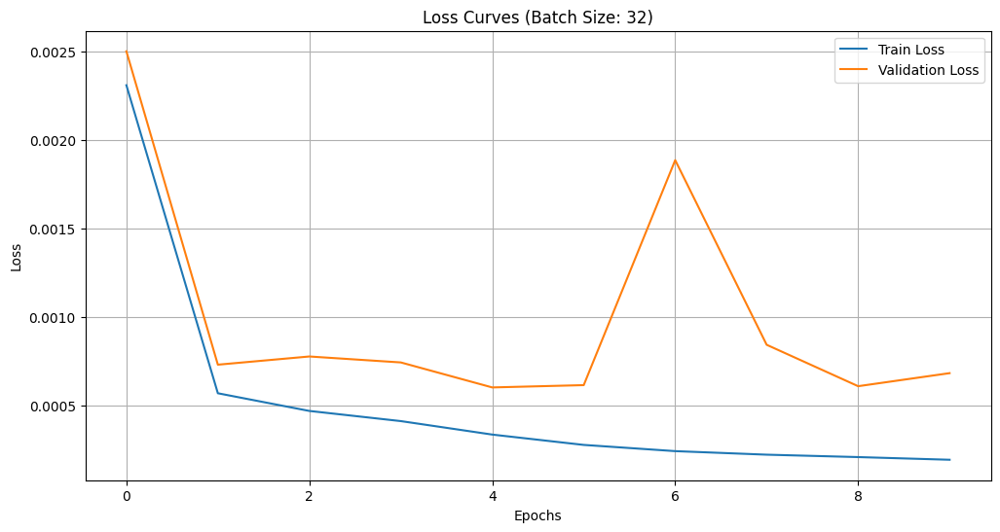

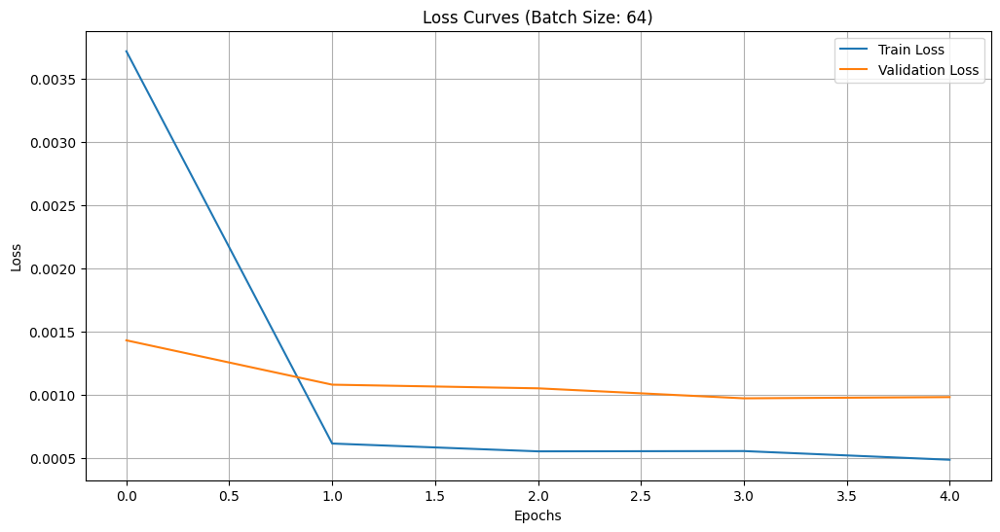

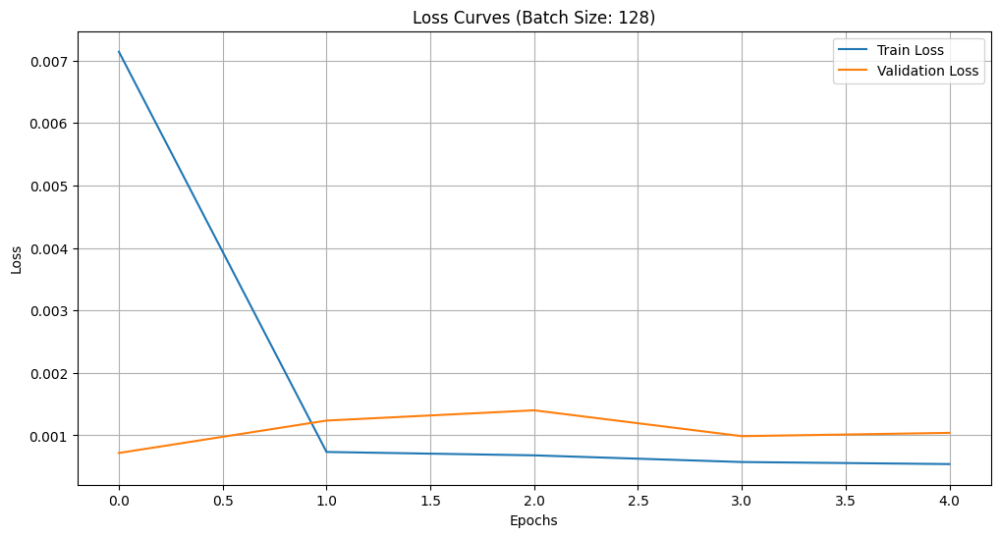

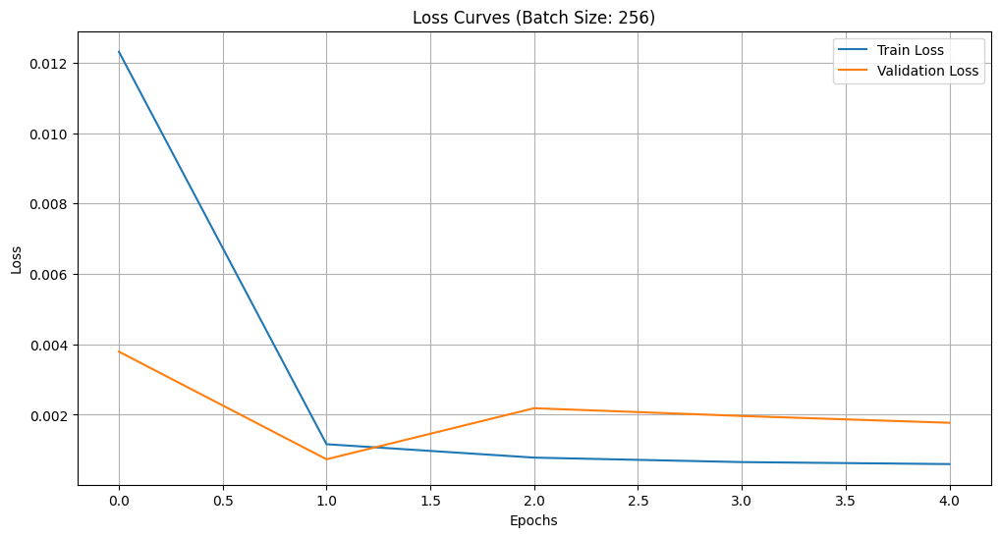

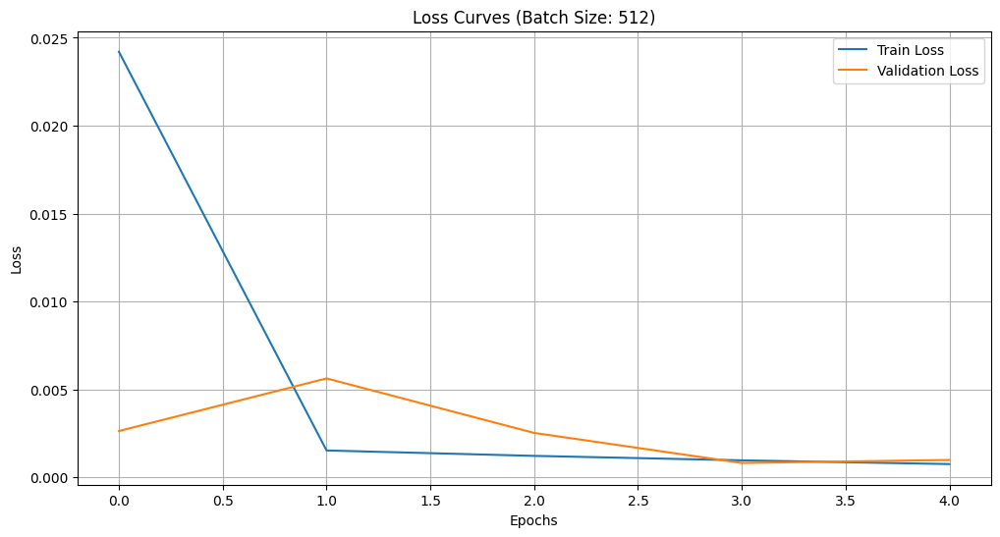

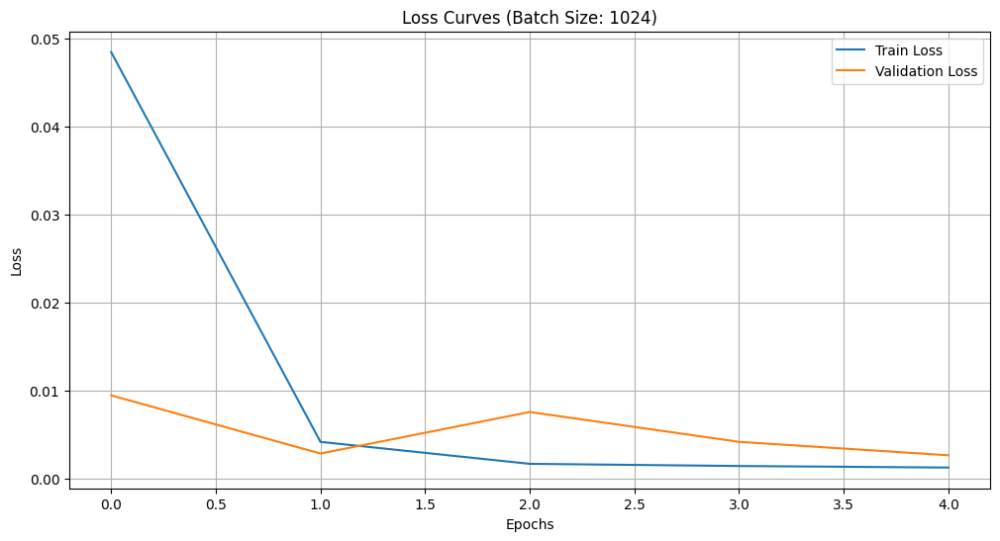

In [ ]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

input : past_day_close + VADER

In [ ]:
from sklearn.model_selection import train_test_split

past_vader = ['past_day_close', 'vader_sentiment']

X, y = create_dataset(df[past_vader].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [ ]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])

    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)

    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 32, MSE: 0.041, RMSE: 0.202, R-squared: 0.322
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 64, MSE: 0.041, RMSE: 0.202, R-squared: 0.322
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Batch Size: 128, MSE: 0.031, RMSE: 0.175, R-squared: 0.491
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 256, MSE: 0.010, RMSE: 0.098, R-squared: 0.840
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 512, MSE: 0.008, RMSE: 0.088, R-squared: 0.871
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 1024, MSE: 0.010, RMSE: 0.099, R-squared: 0.837


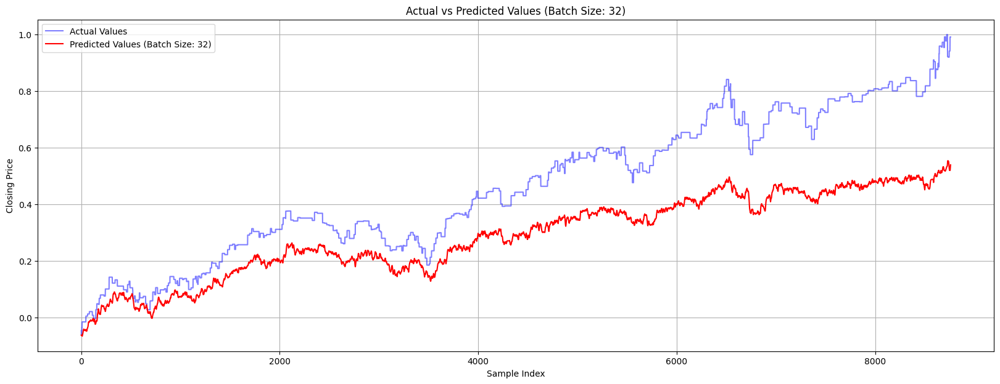

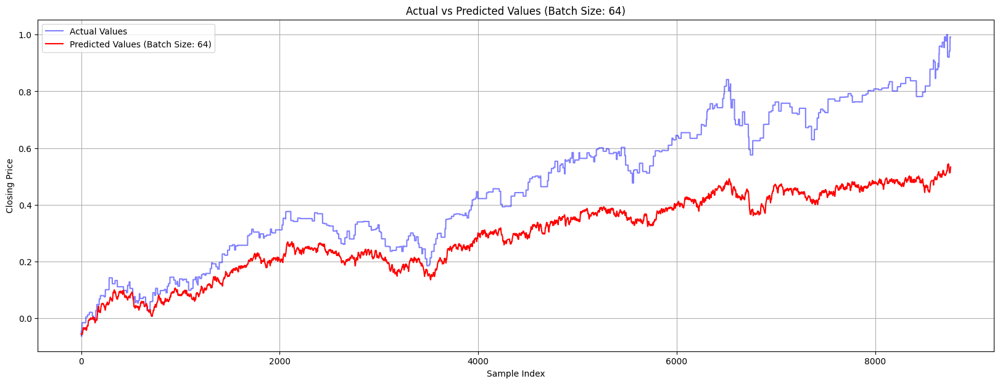

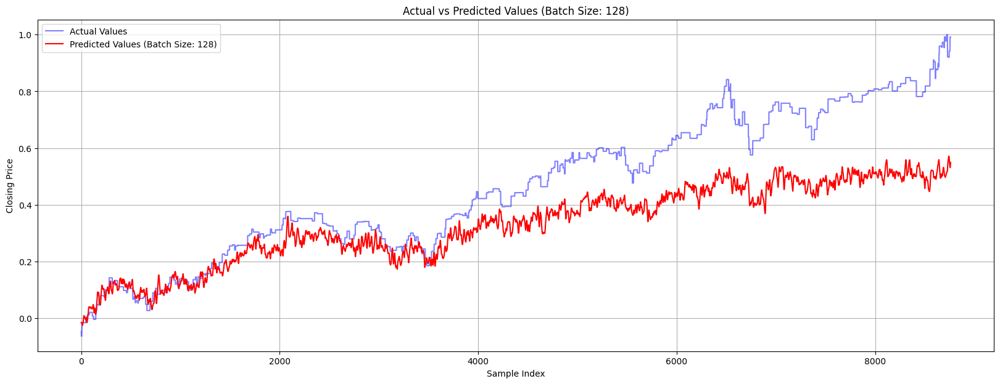

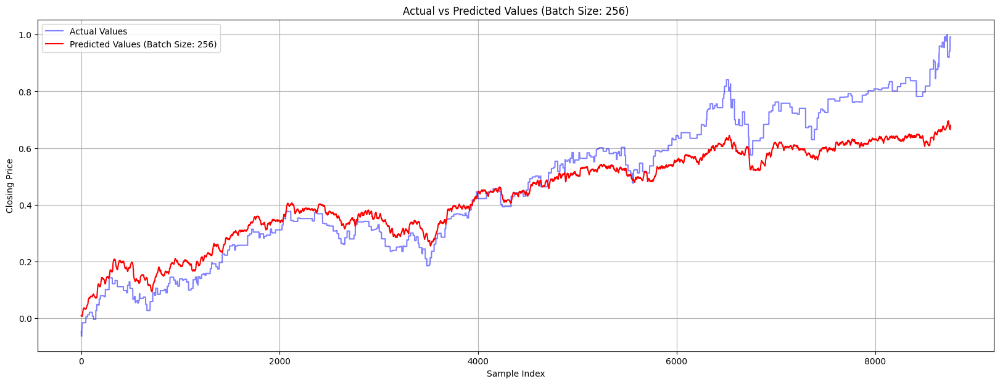

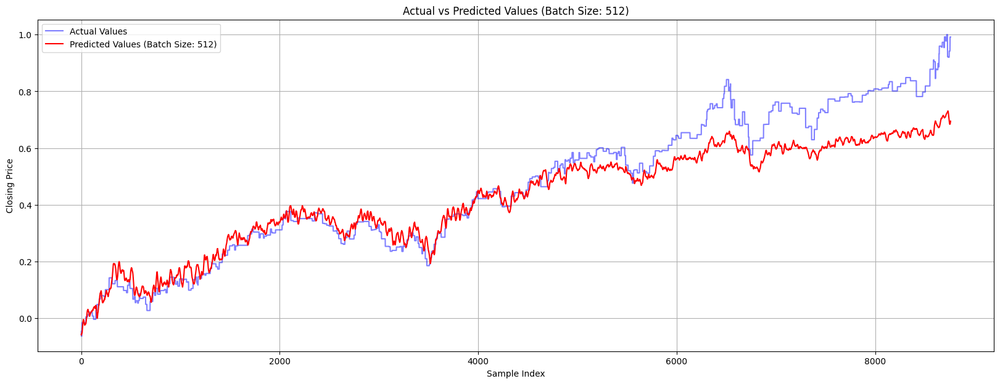

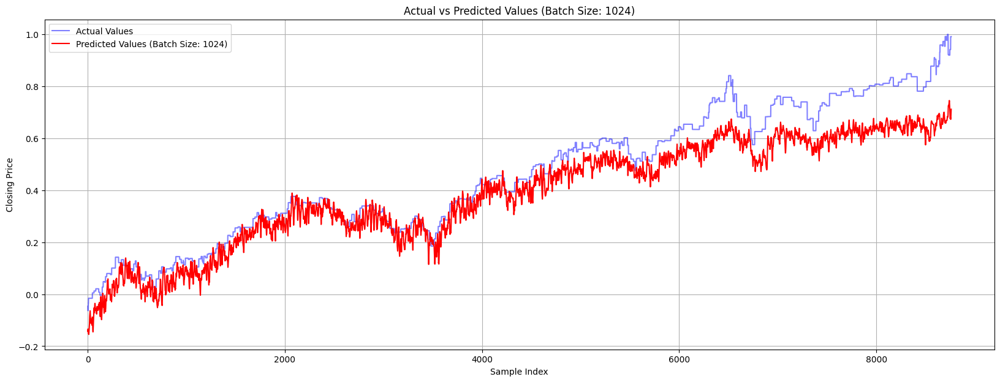

In [ ]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))

    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)

    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')

    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

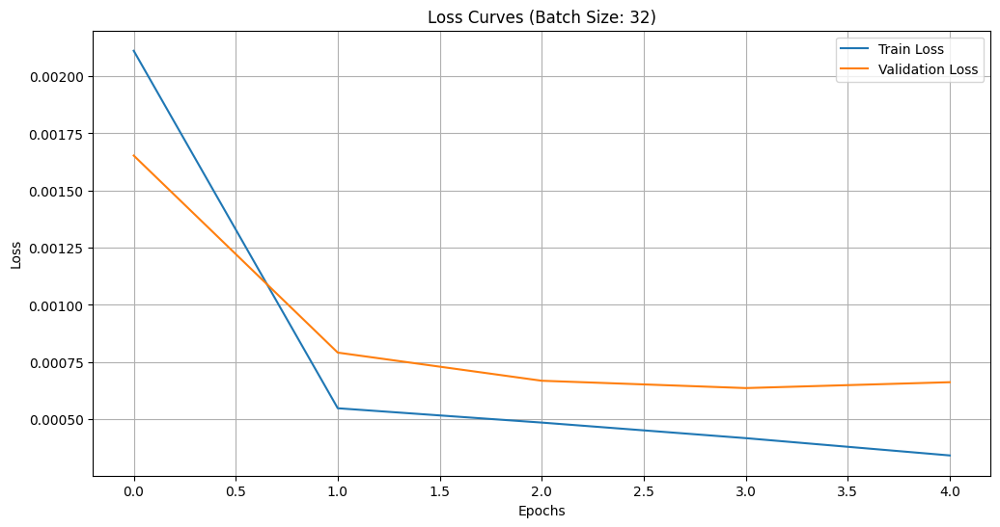

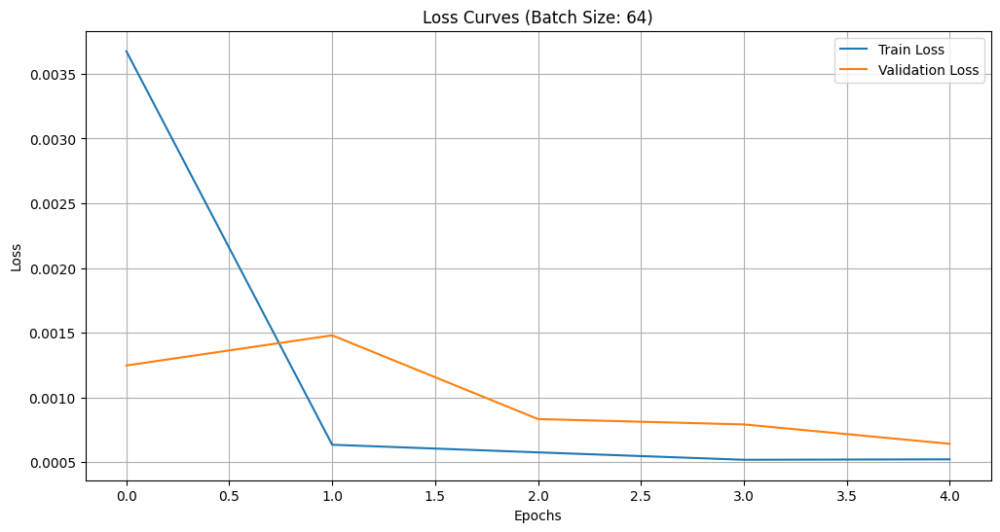

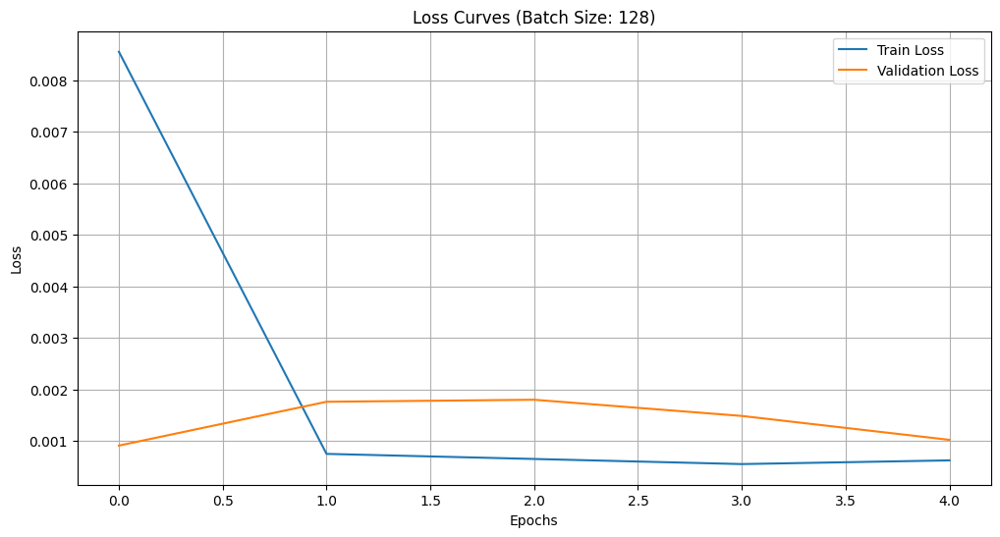

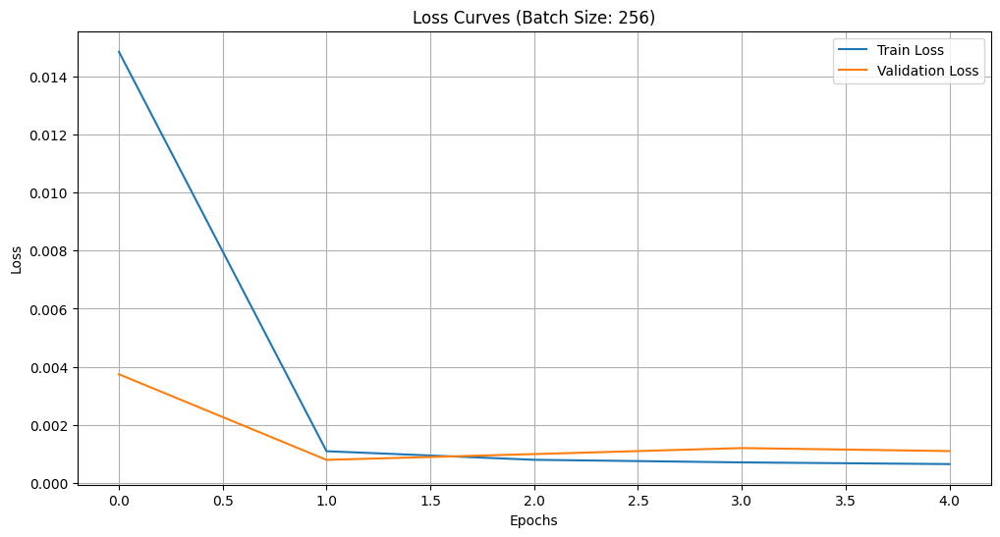

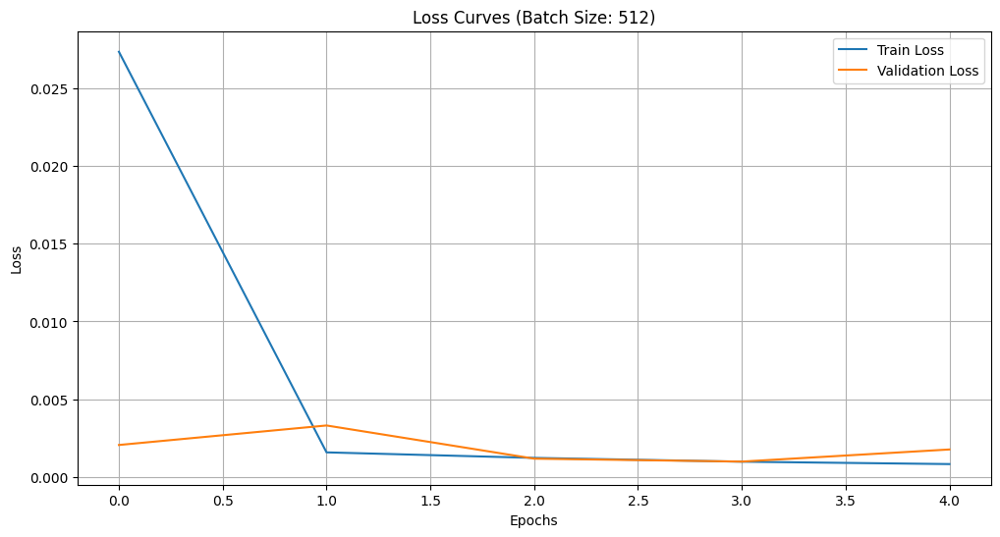

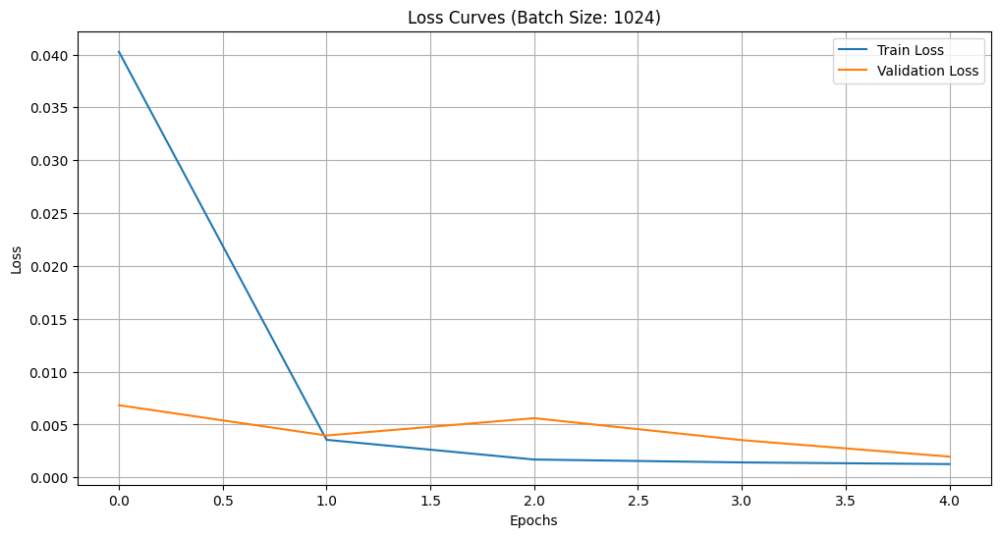

In [ ]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

input : past_day_close + RoBERTa

In [ ]:
from sklearn.model_selection import train_test_split

past_roberta = ['past_day_close', 'roberta_sentiment']

X, y = create_dataset(df[past_roberta].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [ ]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])

    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)

    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Batch Size: 32, MSE: 0.038, RMSE: 0.195, R-squared: 0.370
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 64, MSE: 0.061, RMSE: 0.247, R-squared: -0.013
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 128, MSE: 0.036, RMSE: 0.190, R-squared: 0.399
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 256, MSE: 0.007, RMSE: 0.086, R-squared: 0.877
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Batch Size: 512, MSE: 0.007, RMSE: 0.082, R-squared: 0.887
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 1024, MSE: 0.013, RMSE: 0.112, R-squared: 0.791


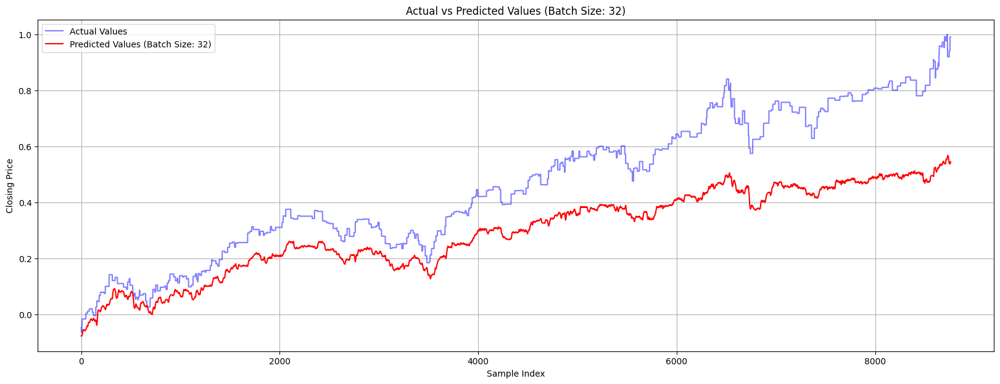

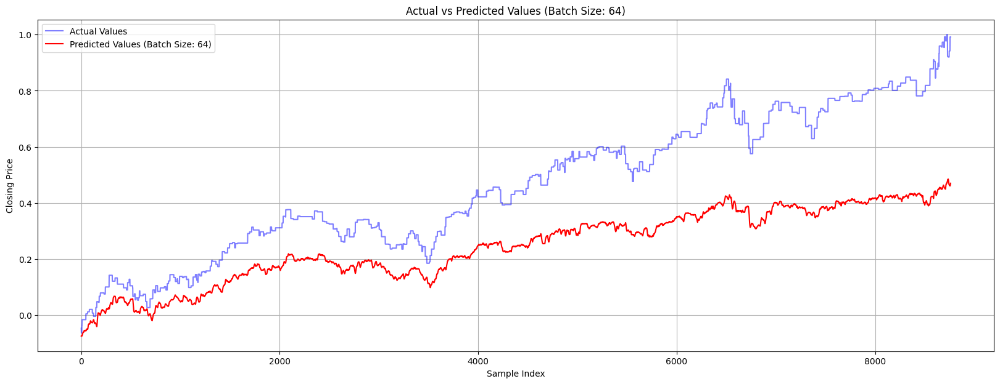

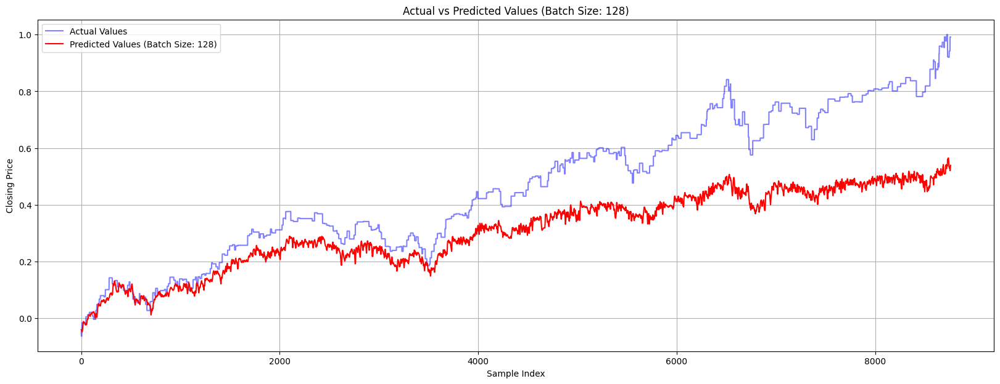

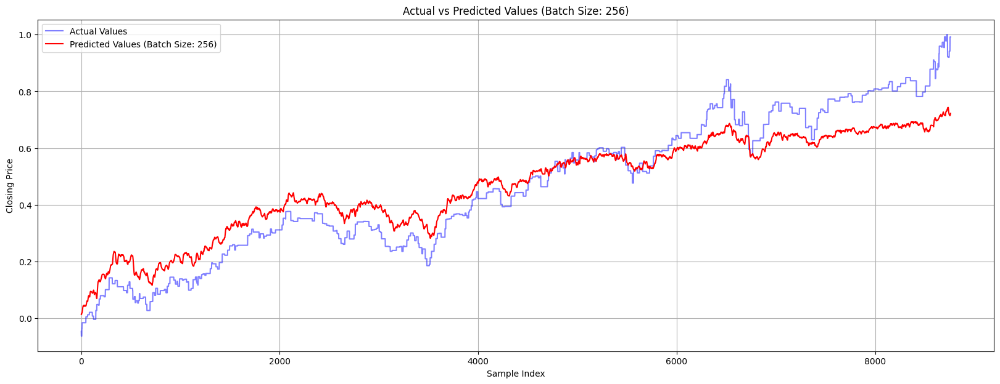

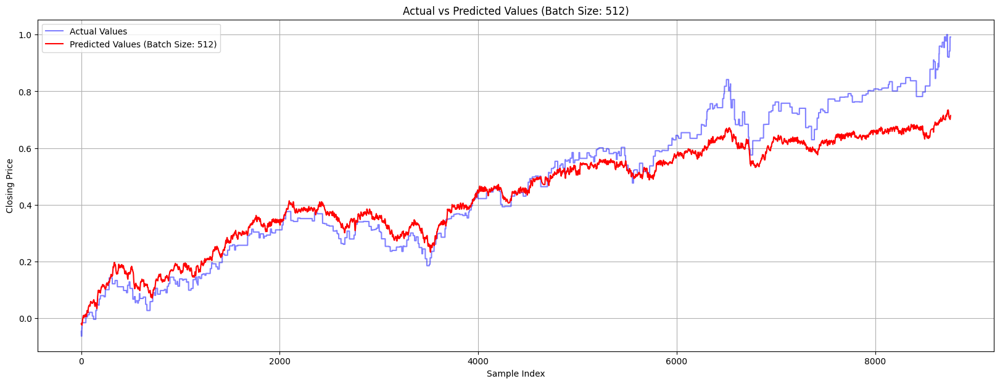

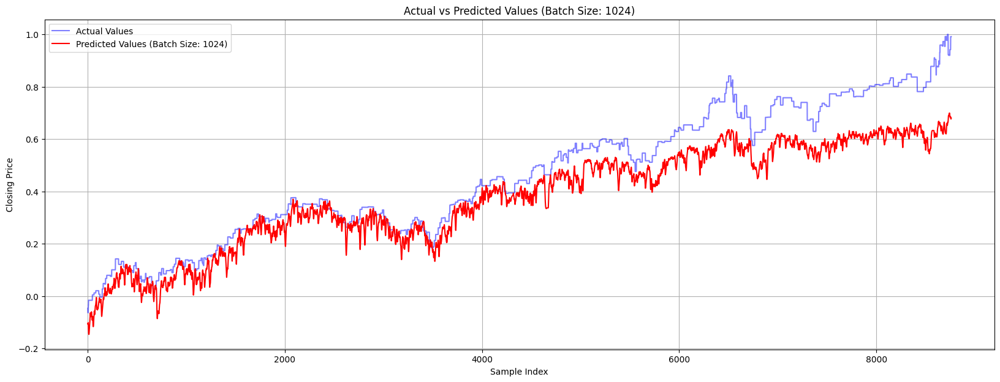

In [ ]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))

    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)

    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')

    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

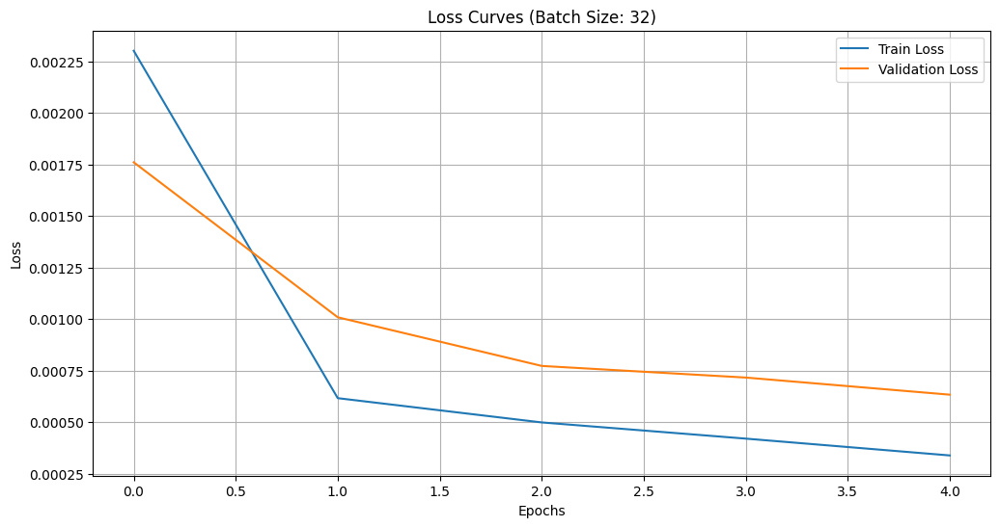

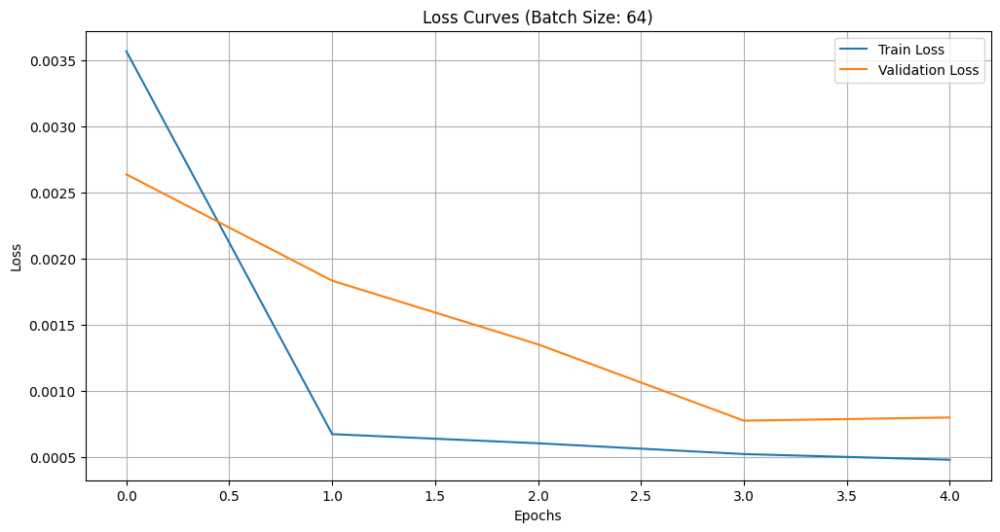

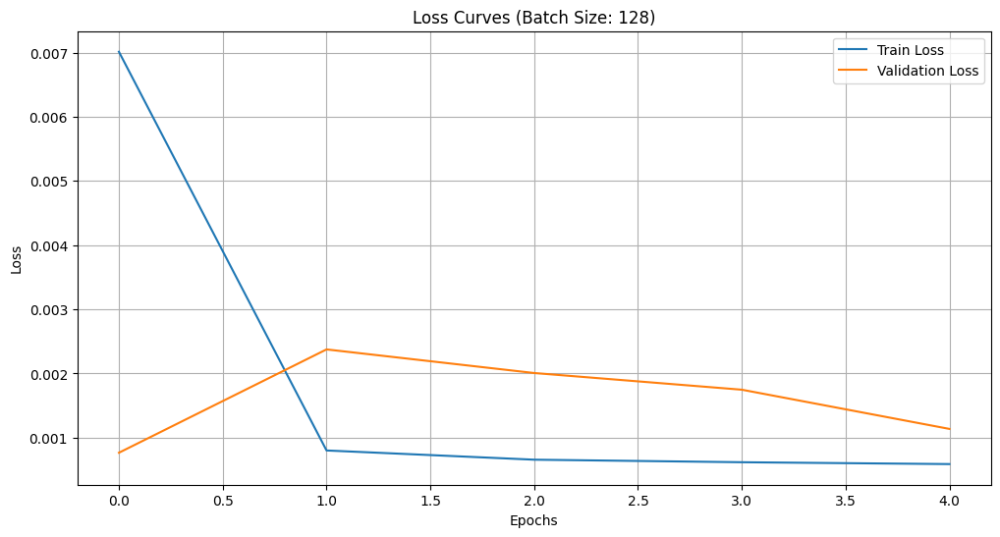

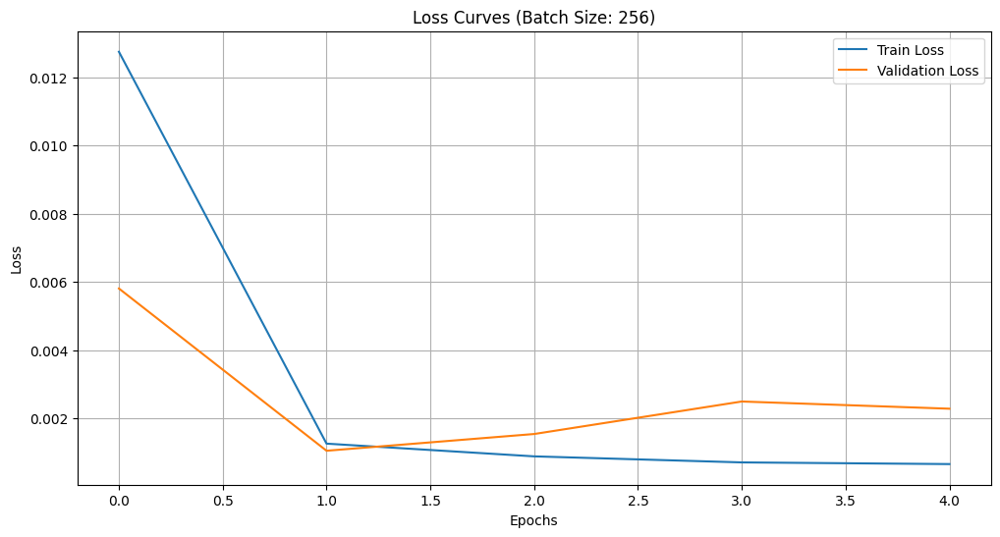

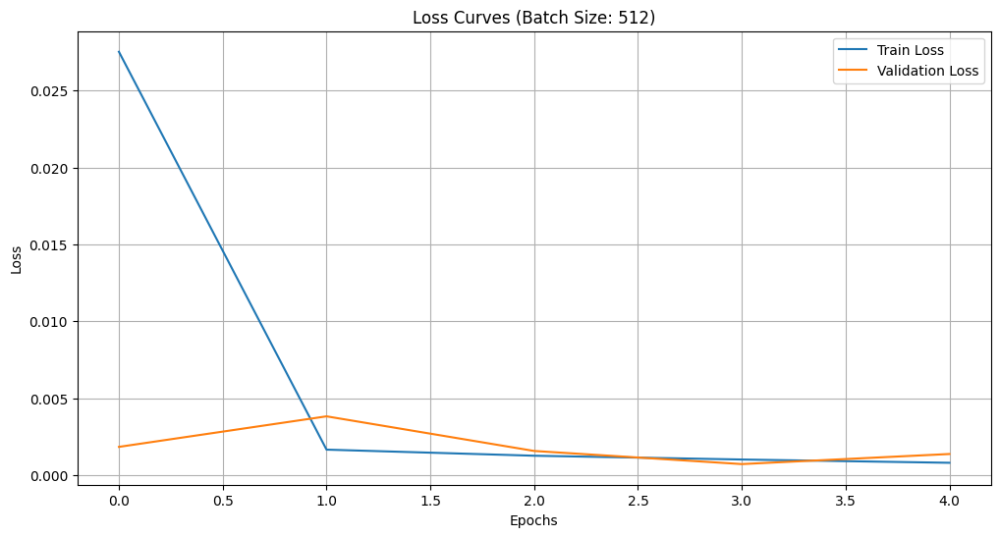

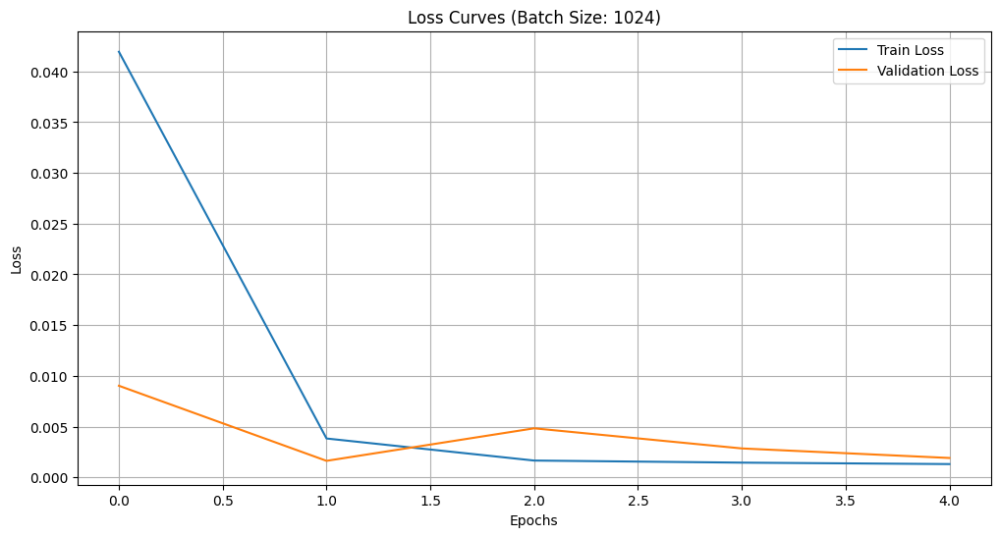

In [ ]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

input : past_day_close + VADER + RoBERTa

In [ ]:
from sklearn.model_selection import train_test_split

past_sentiment = ['past_day_close', 'vader_sentiment', 'roberta_sentiment']

X, y = create_dataset(df[past_sentiment].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [ ]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])

    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)

    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 32, MSE: 0.028, RMSE: 0.166, R-squared: 0.542
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 64, MSE: 0.048, RMSE: 0.220, R-squared: 0.196
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 128, MSE: 0.036, RMSE: 0.190, R-squared: 0.403
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 256, MSE: 0.008, RMSE: 0.091, R-squared: 0.863
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 512, MSE: 0.008, RMSE: 0.089, R-squared: 0.869
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Batch Size: 1024, MSE: 0.013, RMSE: 0.113, R-squared: 0.787


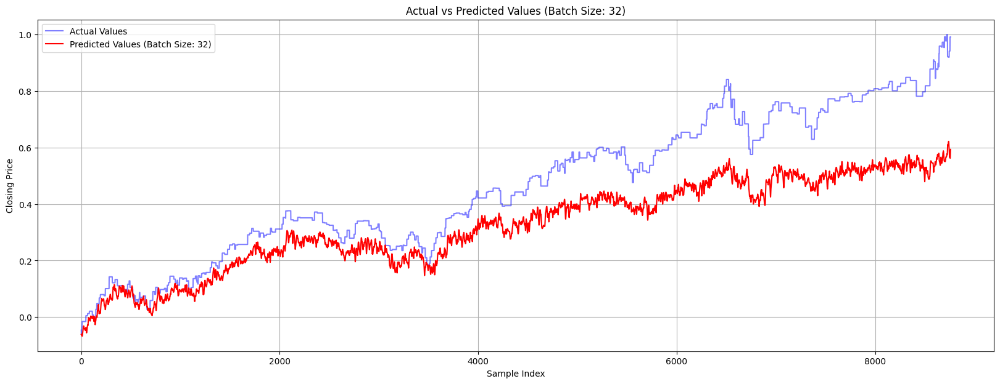

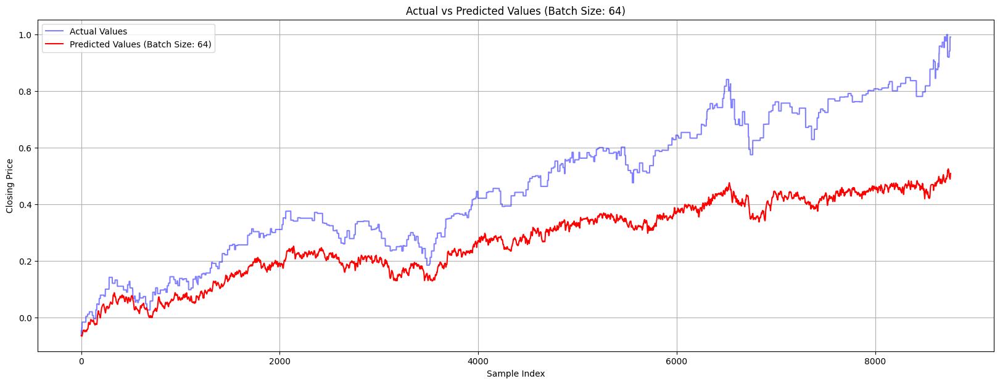

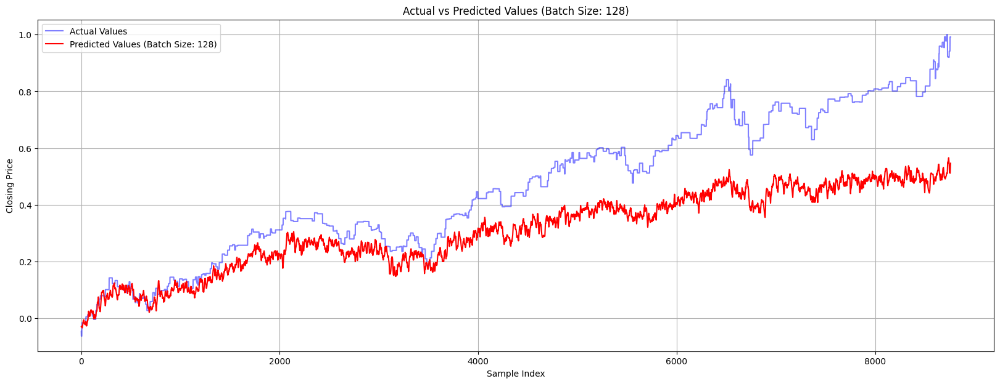

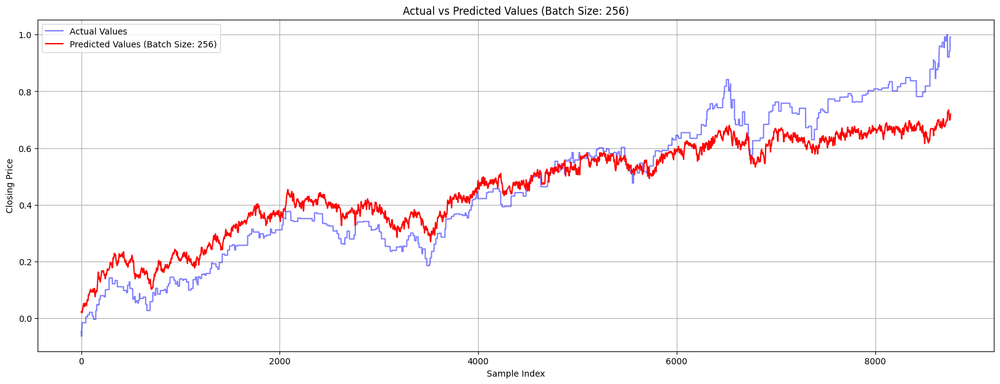

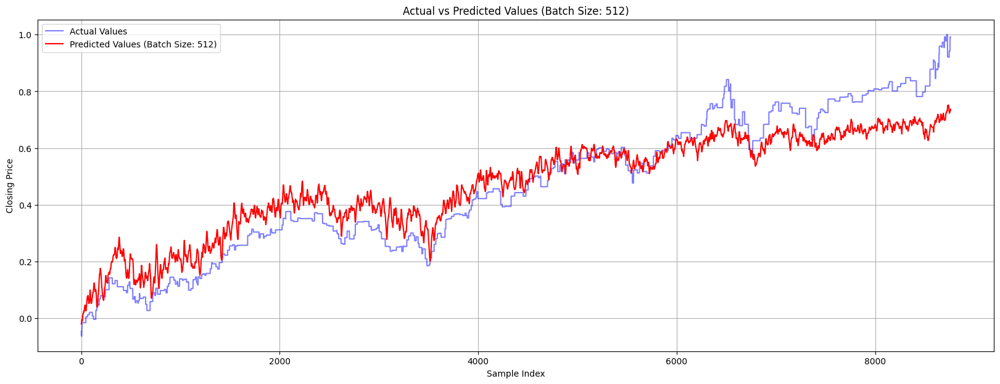

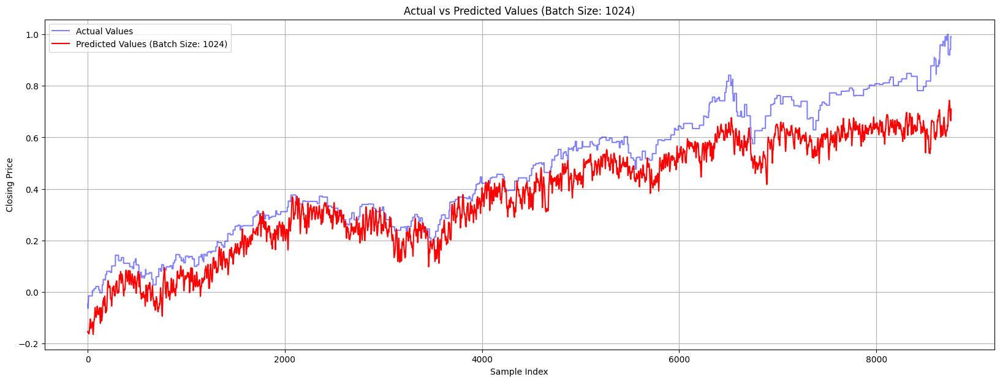

In [ ]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))

    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)

    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')

    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

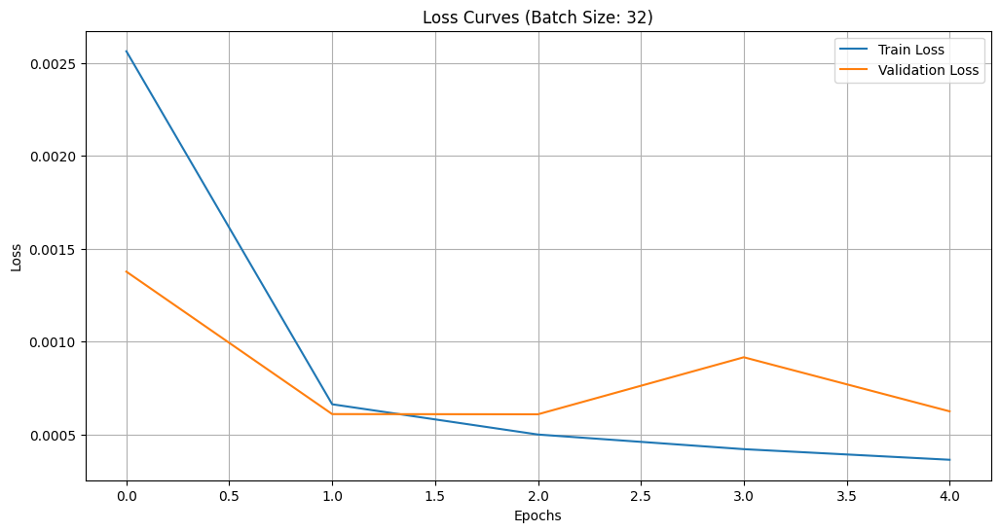

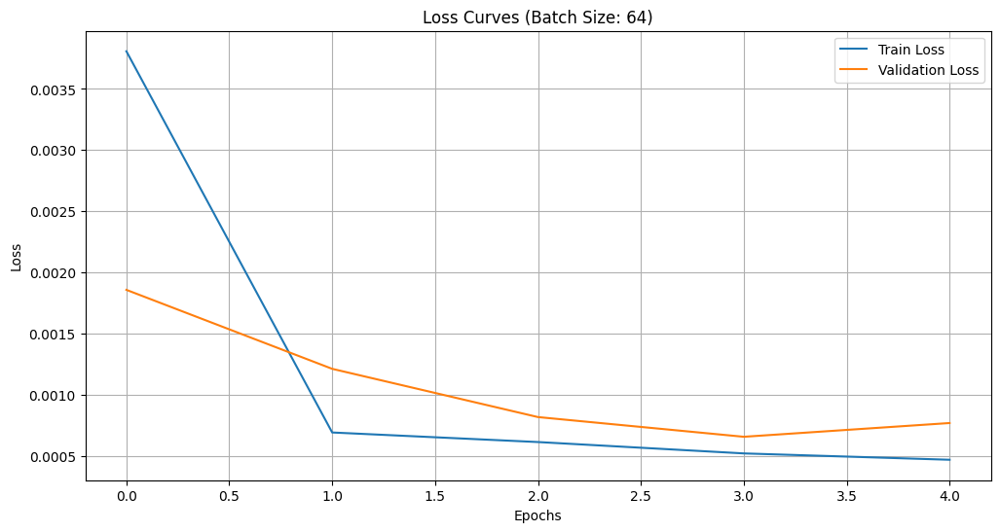

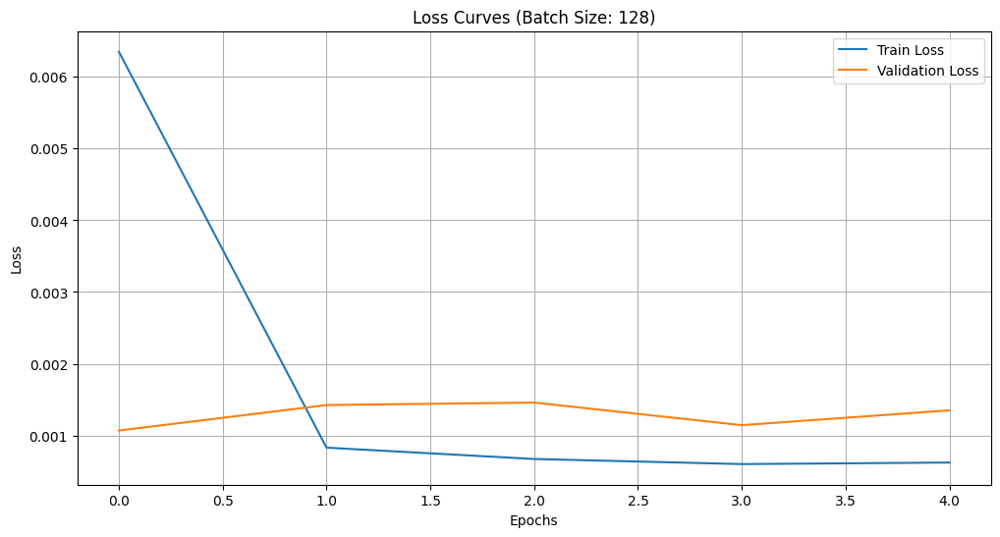

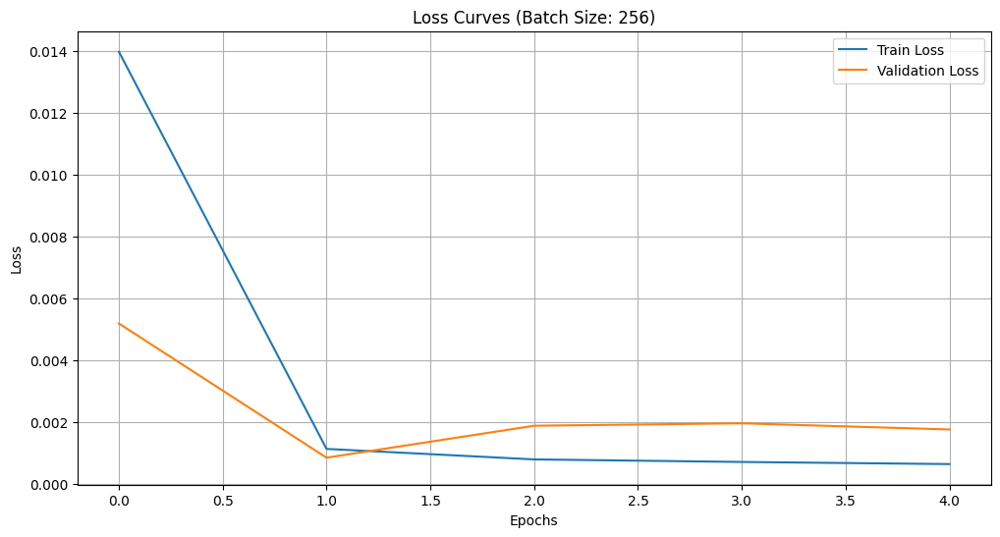

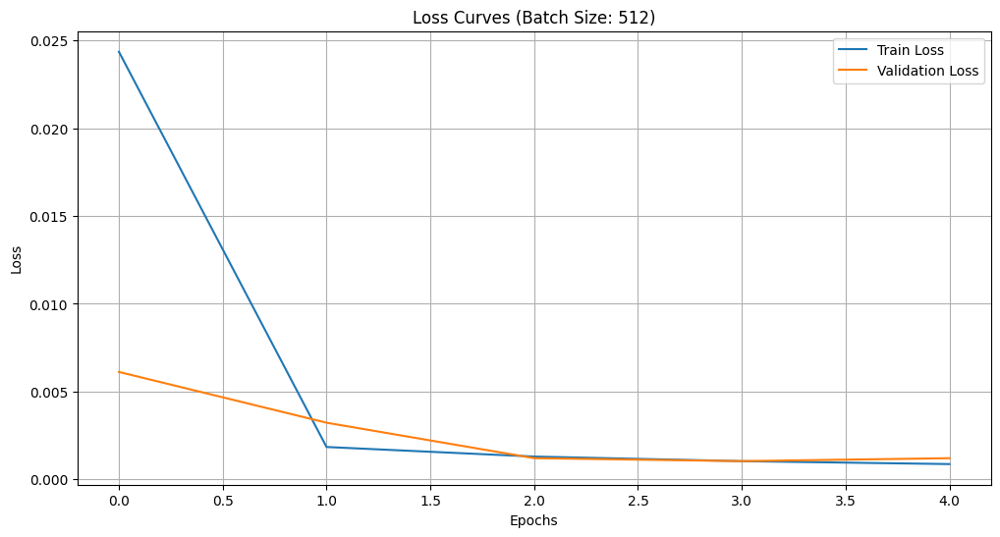

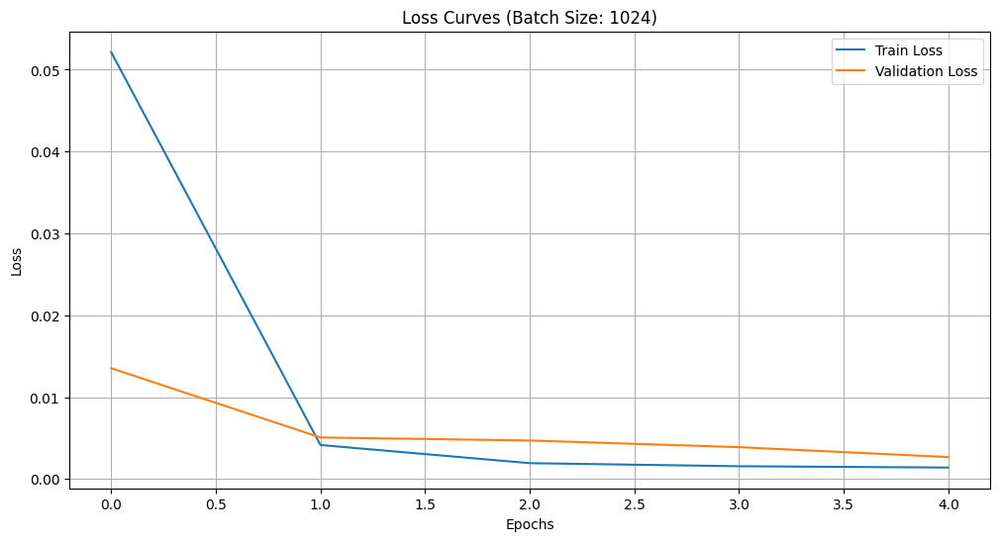

In [ ]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

input : Open + High + Low + Volume

In [ ]:
from sklearn.model_selection import train_test_split

nasdaq = ['Open', 'High', 'Low', 'Volume']

X, y = create_dataset(df[nasdaq].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [ ]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])

    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)

    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 32, MSE: 0.009, RMSE: 0.097, R-squared: 0.845
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 64, MSE: 0.025, RMSE: 0.157, R-squared: 0.592
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 128, MSE: 0.020, RMSE: 0.143, R-squared: 0.663
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 256, MSE: 0.017, RMSE: 0.130, R-squared: 0.722
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Batch Size: 512, MSE: 0.006, RMSE: 0.077, R-squared: 0.901
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 1024, MSE: 0.008, RMSE: 0.091, R-squared: 0.864


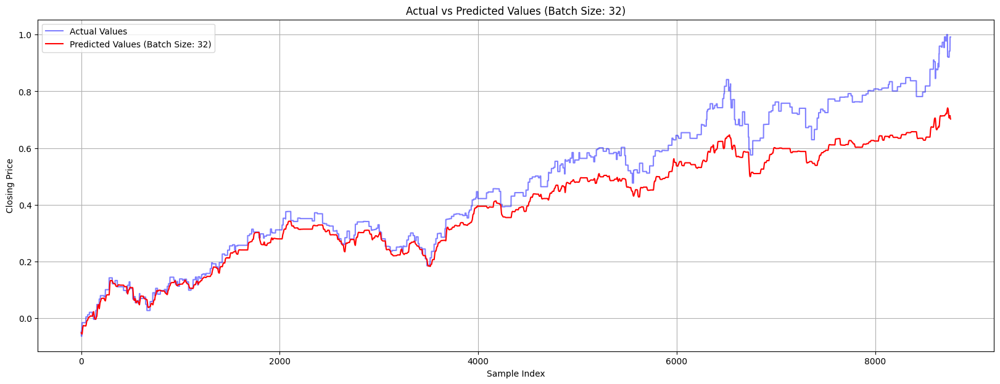

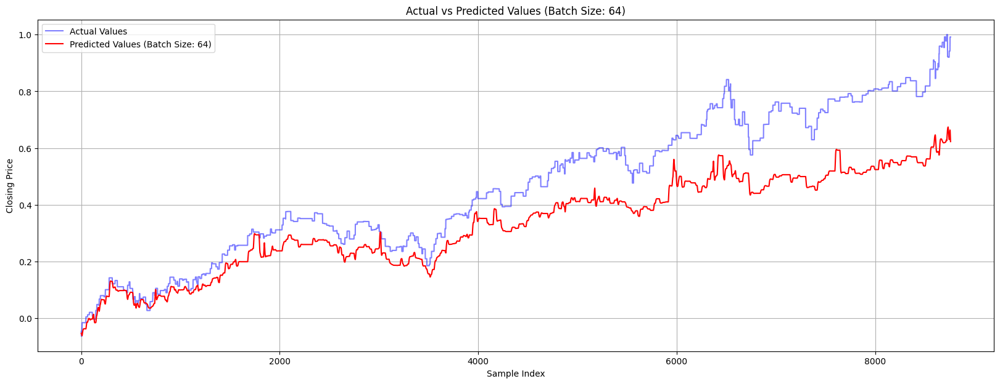

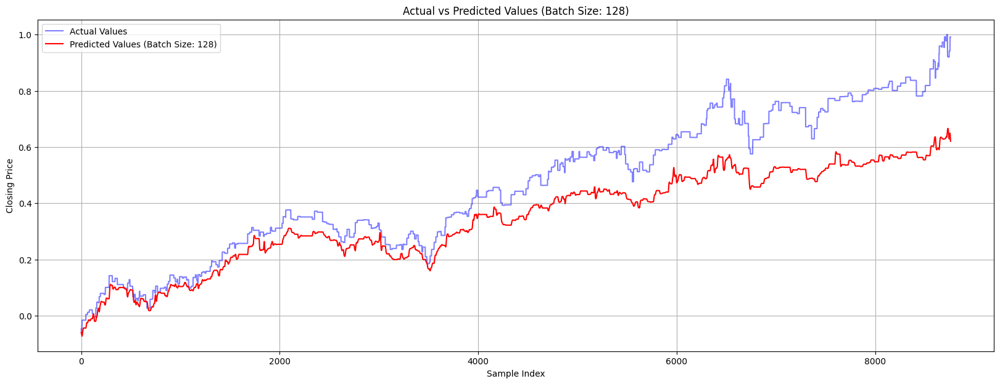

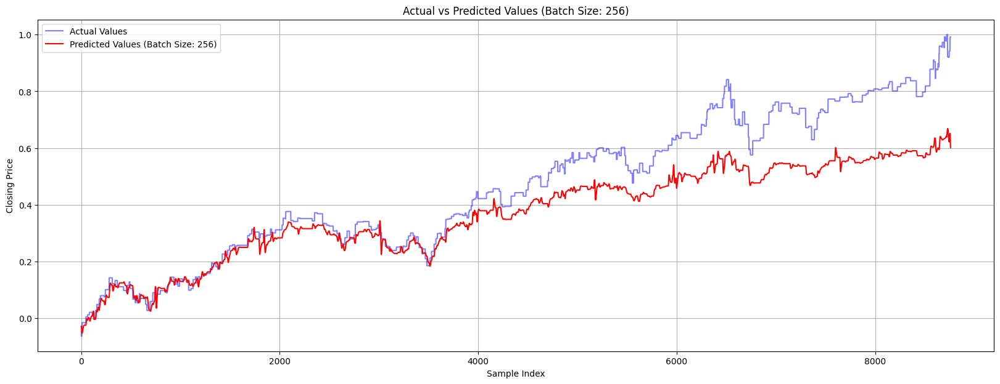

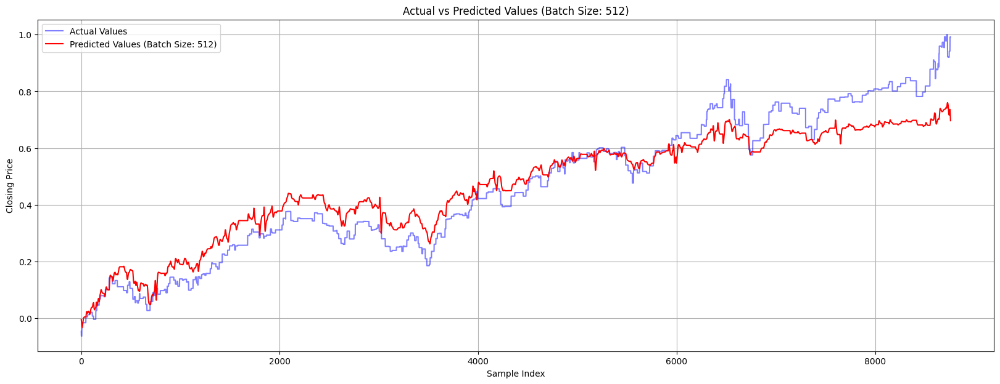

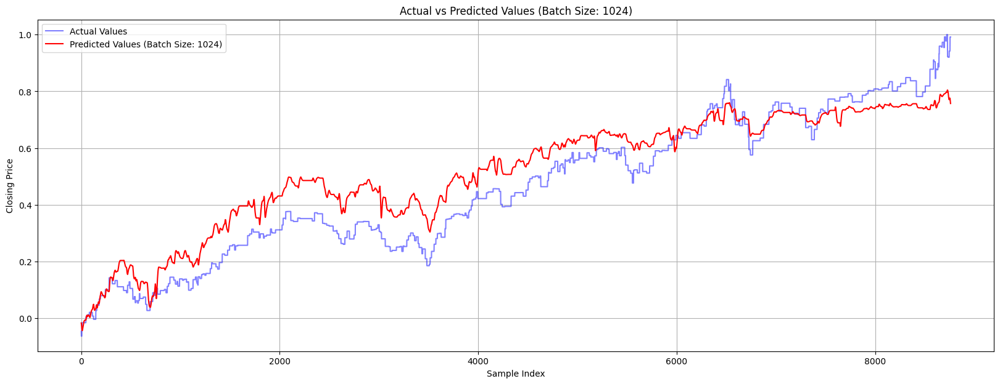

In [ ]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))

    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)

    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')

    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

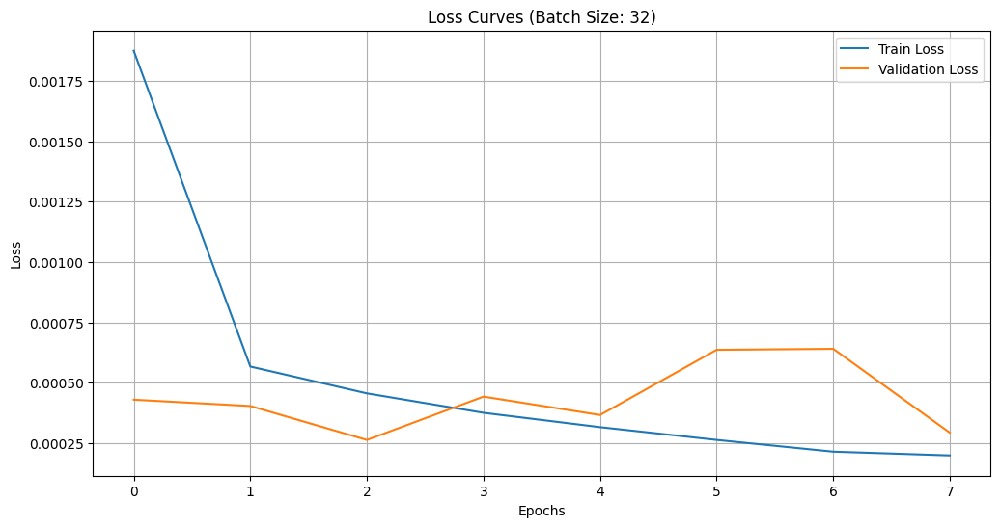

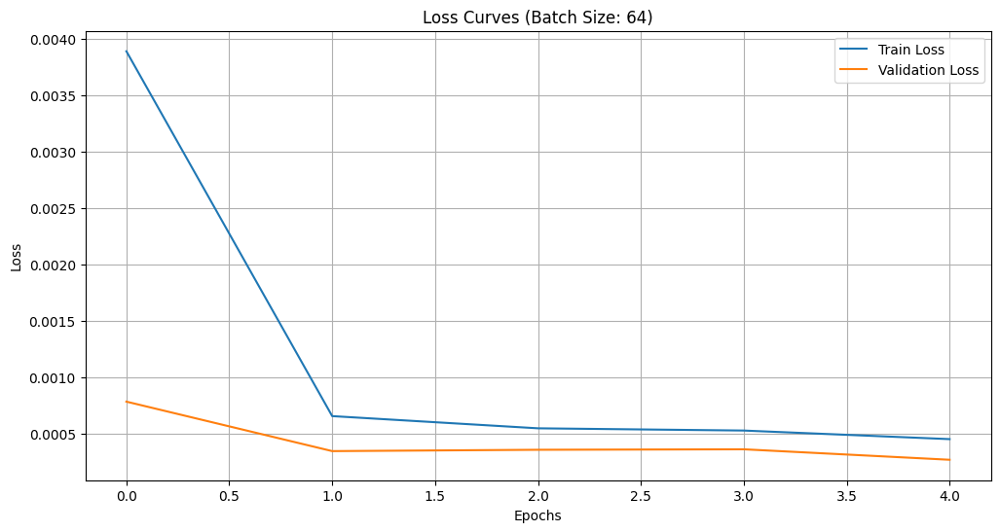

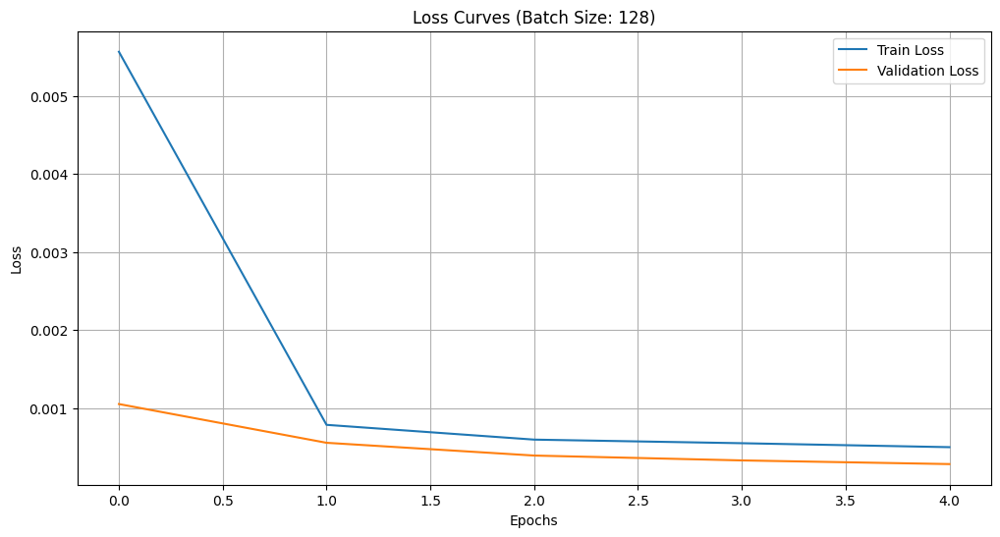

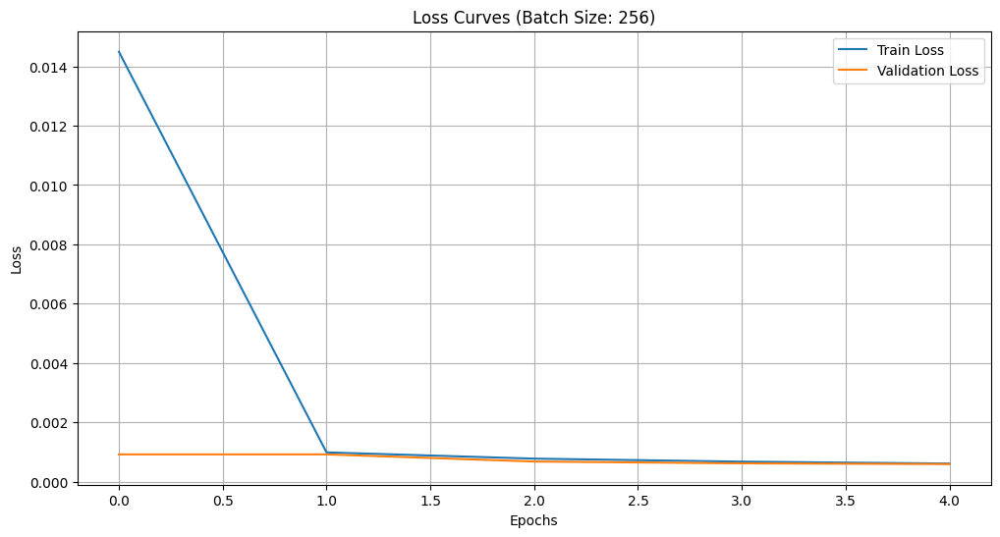

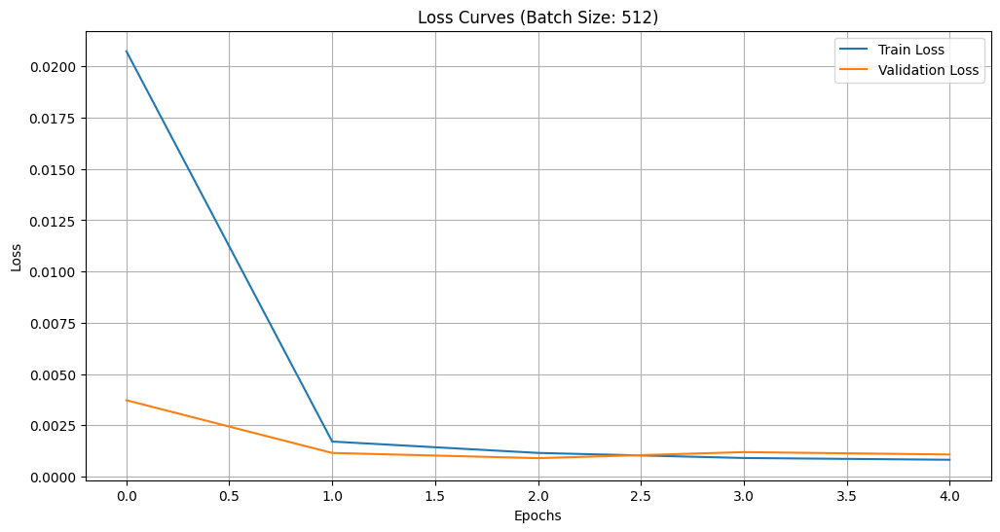

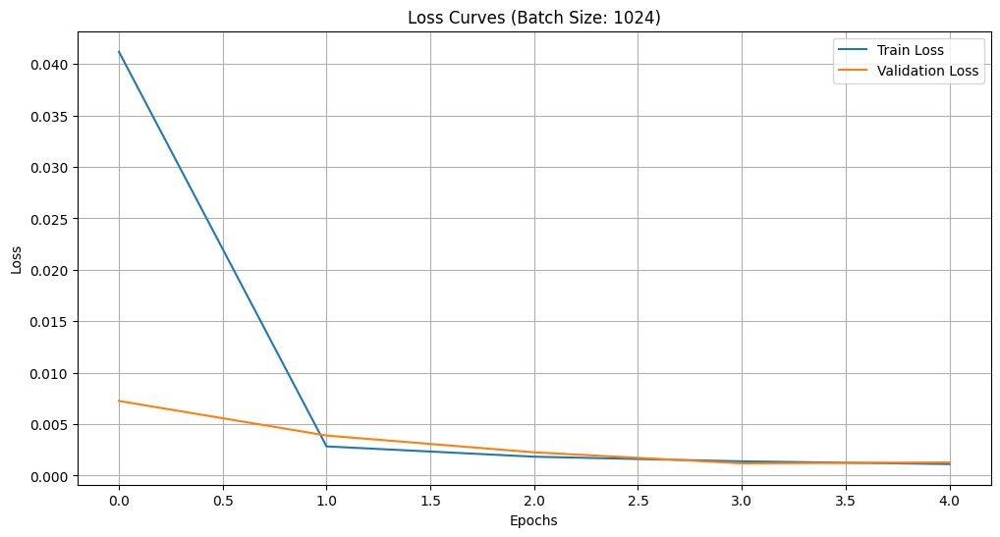

In [ ]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

input : Open + High + Low + Volume + past_day_close

In [ ]:
from sklearn.model_selection import train_test_split

past_nasdaq = ['Open', 'High', 'Low', 'Volume', 'past_day_close']

X, y = create_dataset(df[past_nasdaq].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [ ]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])

    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)

    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 32, MSE: 0.016, RMSE: 0.127, R-squared: 0.731
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 64, MSE: 0.023, RMSE: 0.153, R-squared: 0.611
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 128, MSE: 0.023, RMSE: 0.152, R-squared: 0.616
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 256, MSE: 0.021, RMSE: 0.145, R-squared: 0.653
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 512, MSE: 0.009, RMSE: 0.093, R-squared: 0.857
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 1024, MSE: 0.009, RMSE: 0.096, R-squared: 0.846


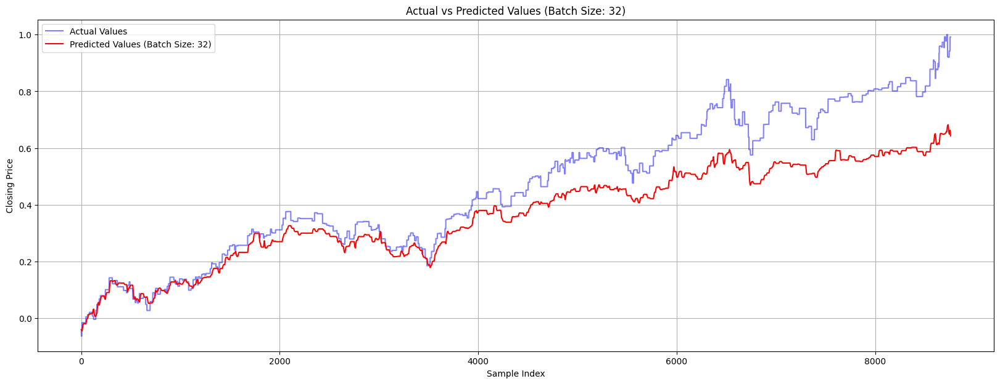

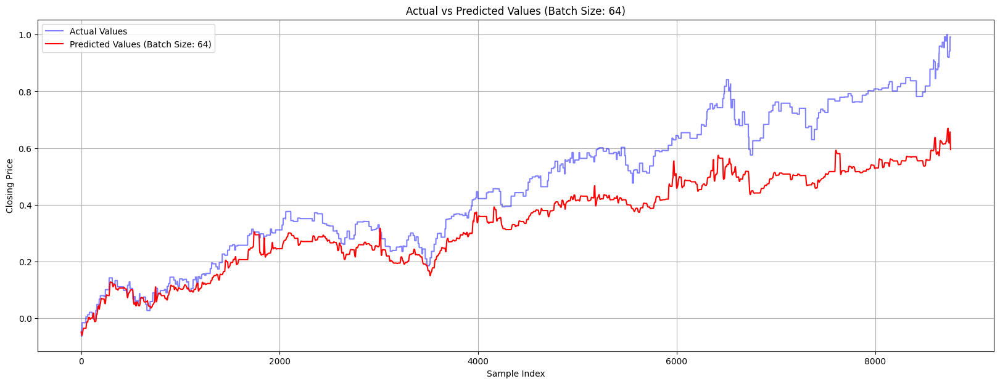

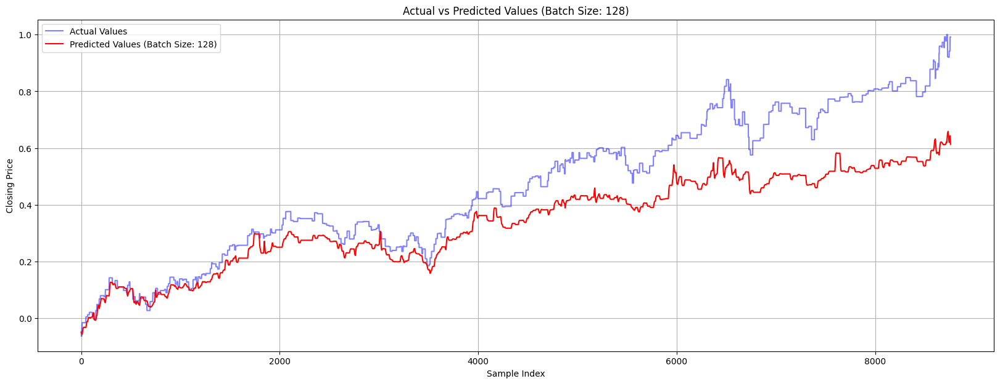

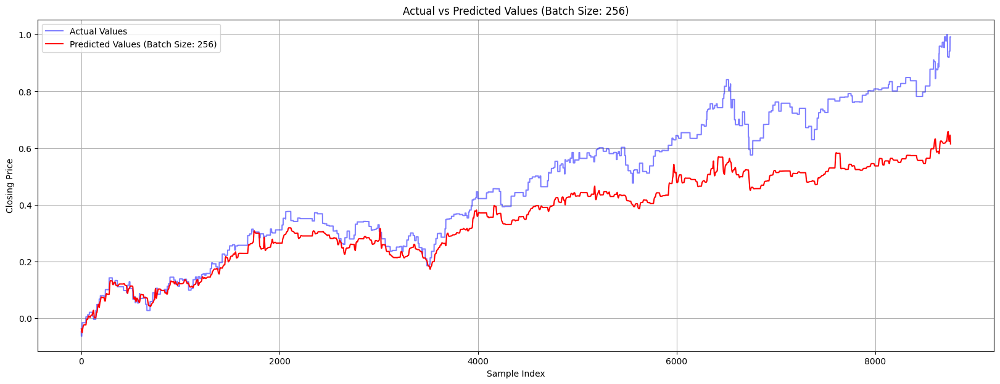

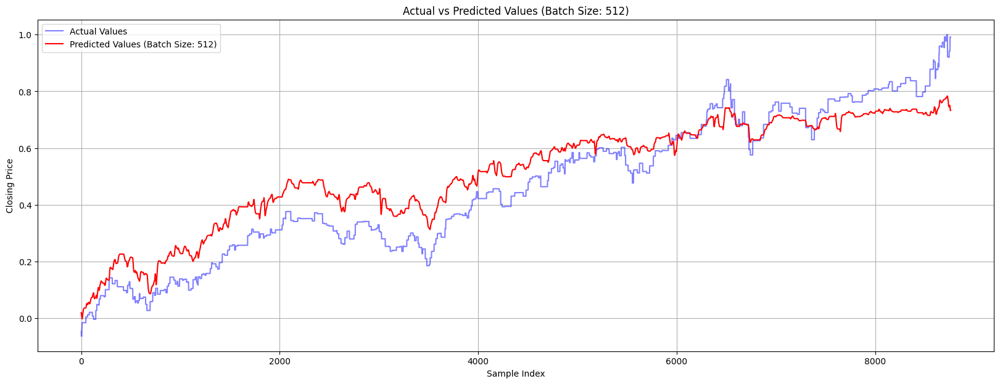

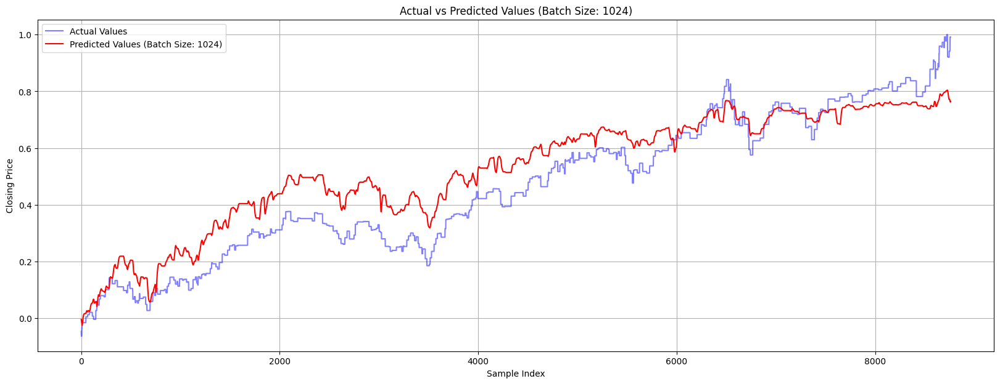

In [ ]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))

    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)

    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')

    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

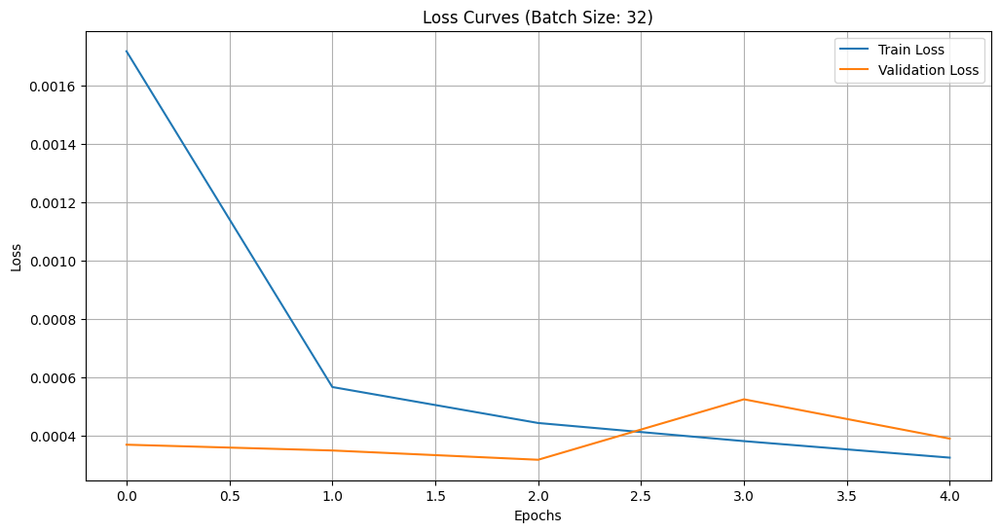

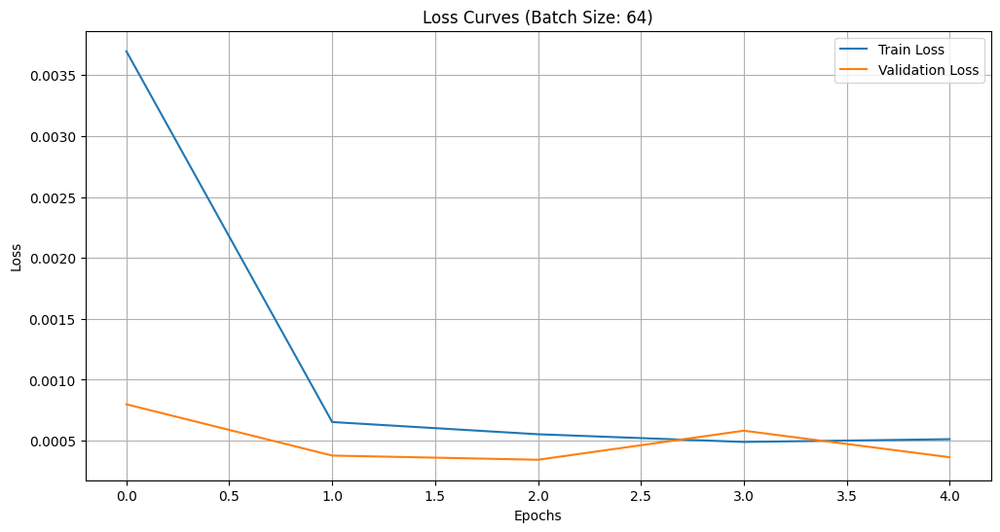

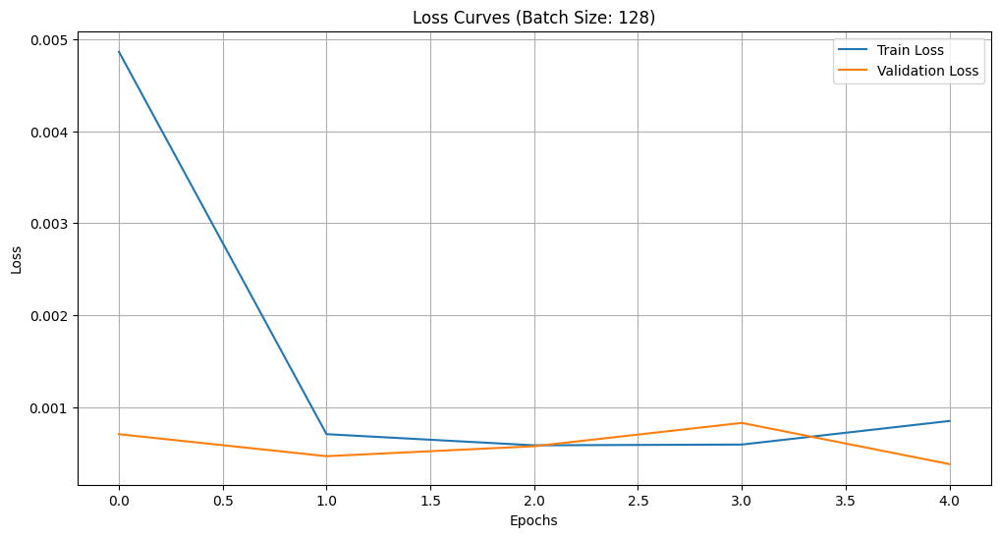

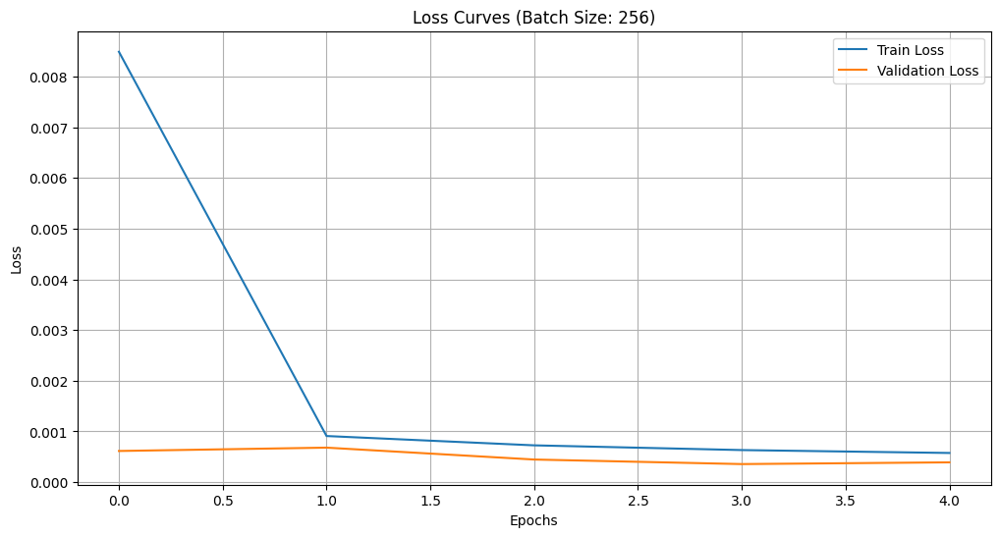

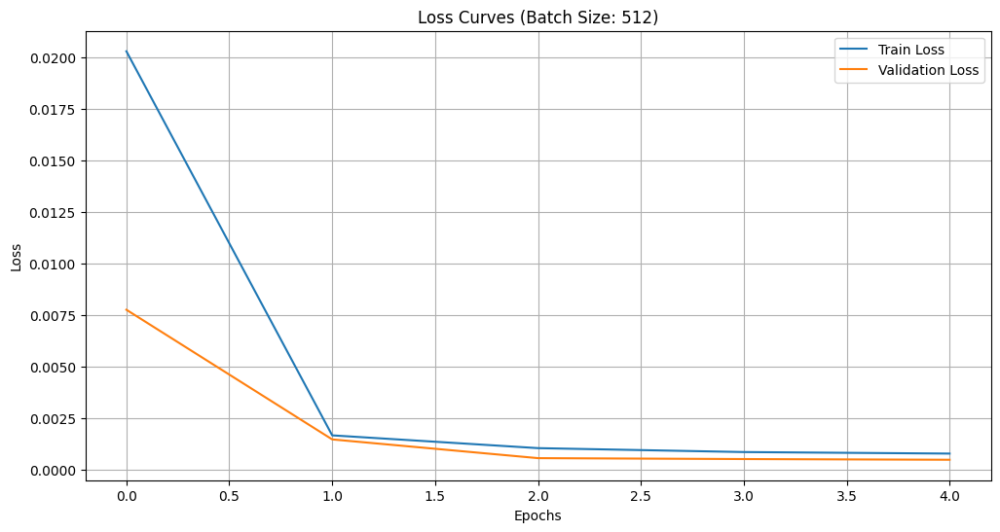

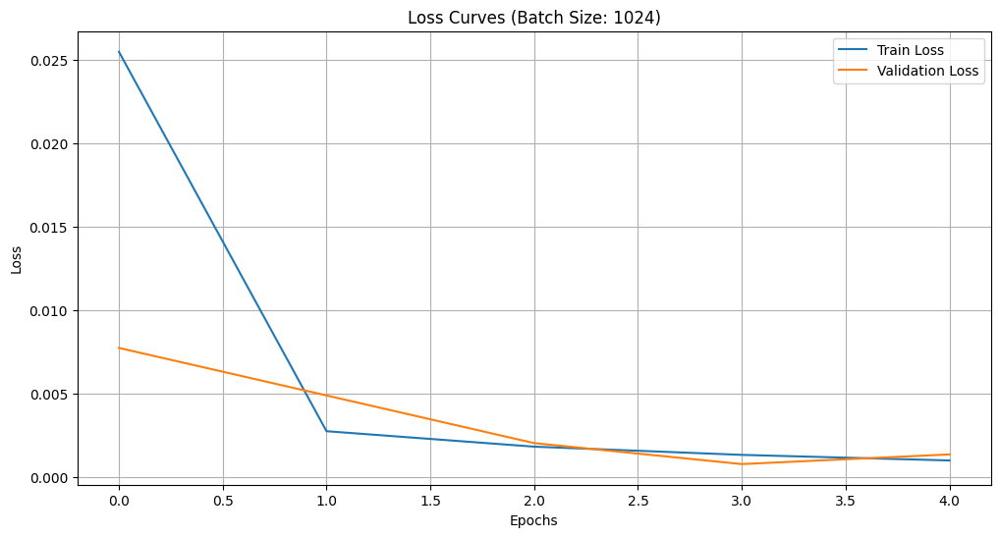

In [ ]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

input : Open + High + Low + Volume + past_day_close + VADER

In [ ]:
from sklearn.model_selection import train_test_split

past_nasdaq_vader = ['Open', 'High', 'Low', 'Volume', 'past_day_close', 'vader_sentiment']

X, y = create_dataset(df[past_nasdaq_vader].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [ ]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])

    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)

    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 32, MSE: 0.021, RMSE: 0.144, R-squared: 0.657
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 64, MSE: 0.023, RMSE: 0.150, R-squared: 0.625
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 128, MSE: 0.023, RMSE: 0.151, R-squared: 0.624
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 256, MSE: 0.010, RMSE: 0.100, R-squared: 0.836
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Batch Size: 512, MSE: 0.008, RMSE: 0.087, R-squared: 0.874
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 1024, MSE: 0.006, RMSE: 0.078, R-squared: 0.899


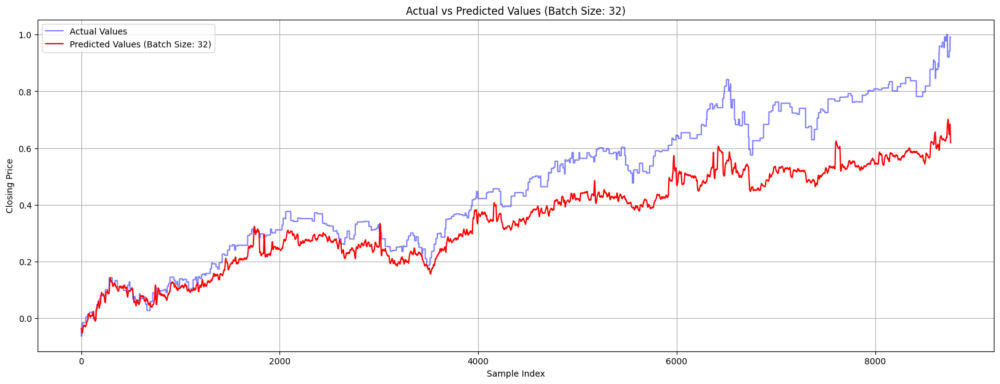

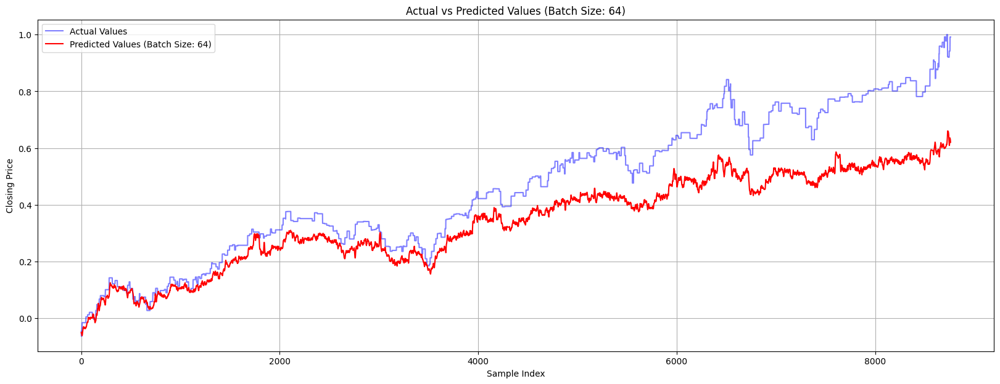

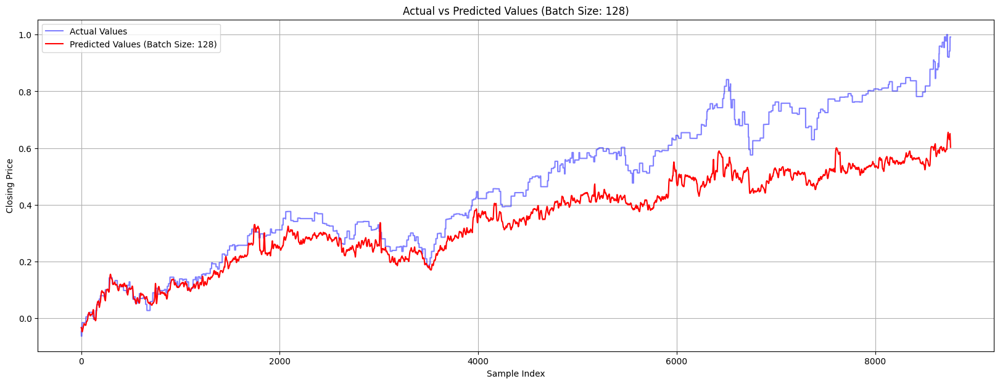

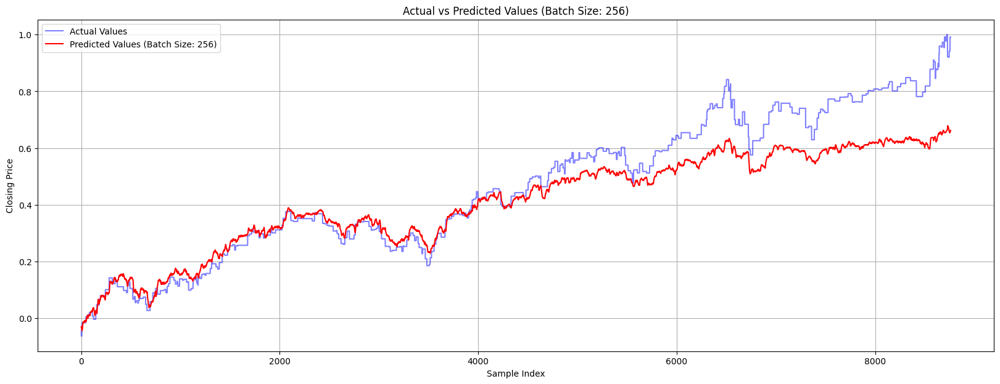

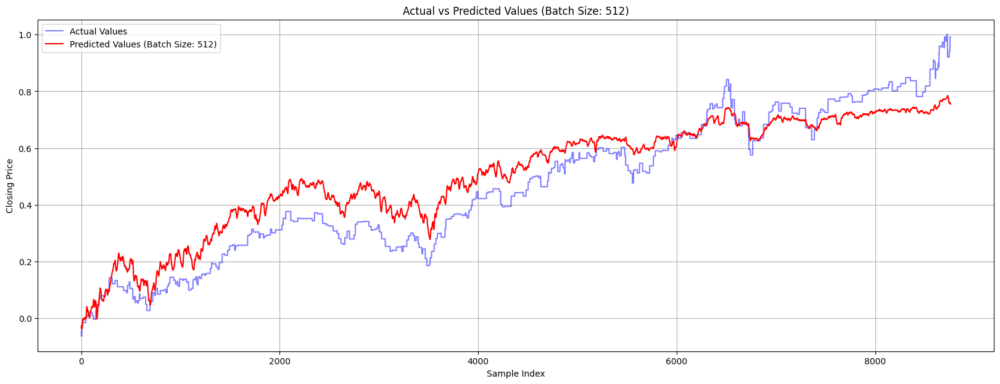

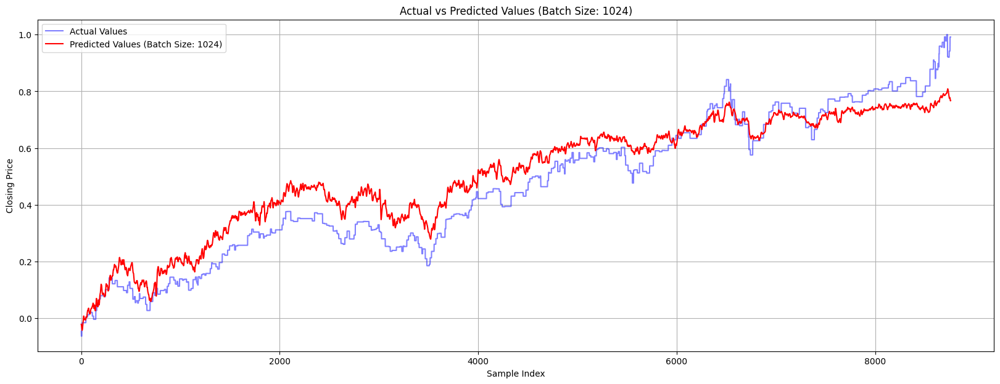

In [ ]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))

    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)

    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')

    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

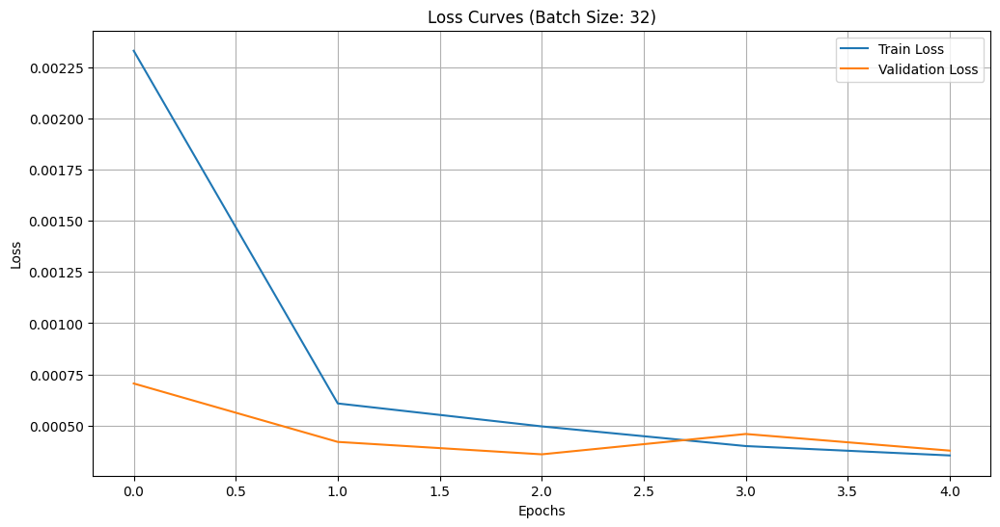

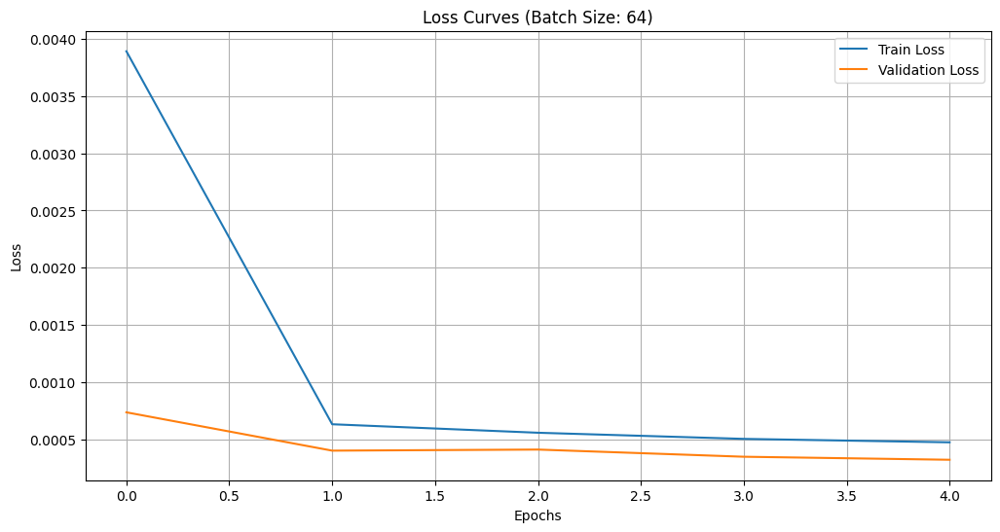

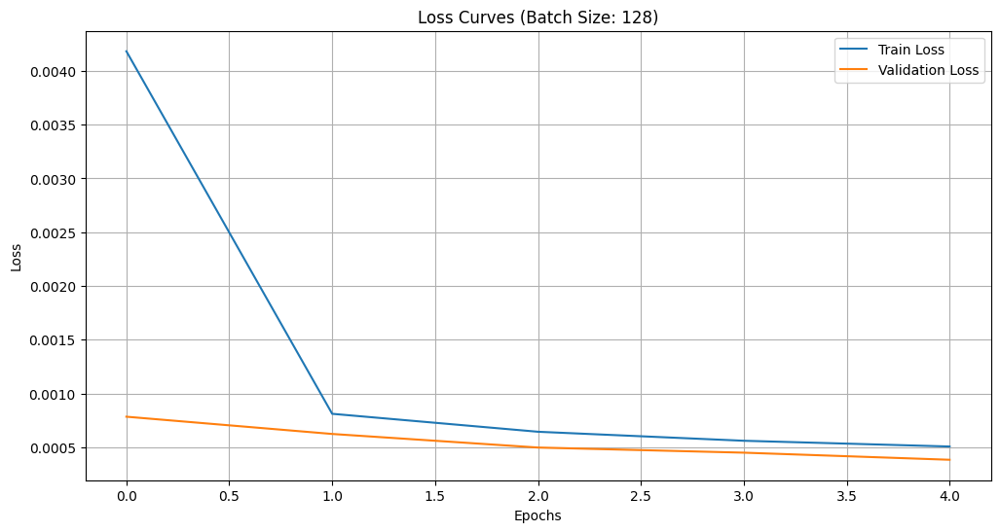

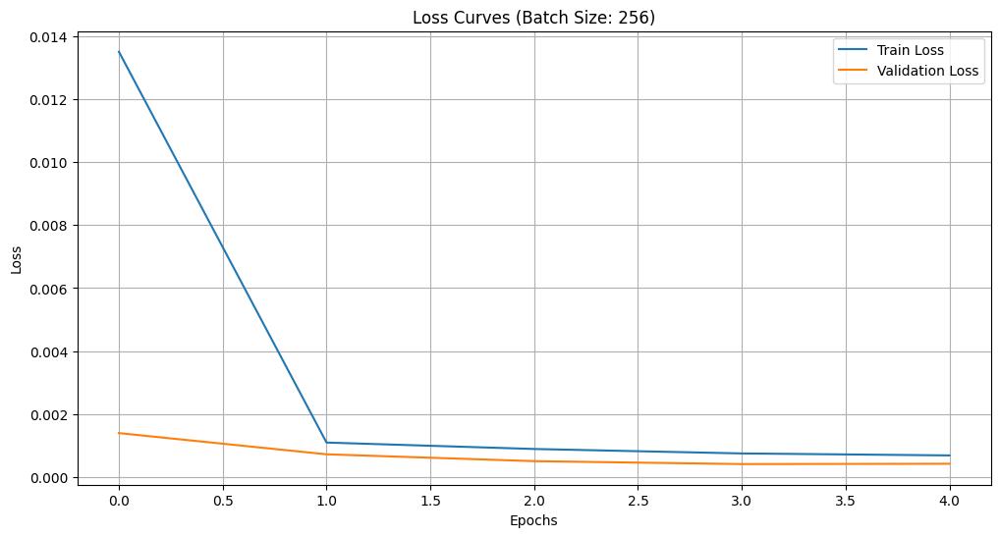

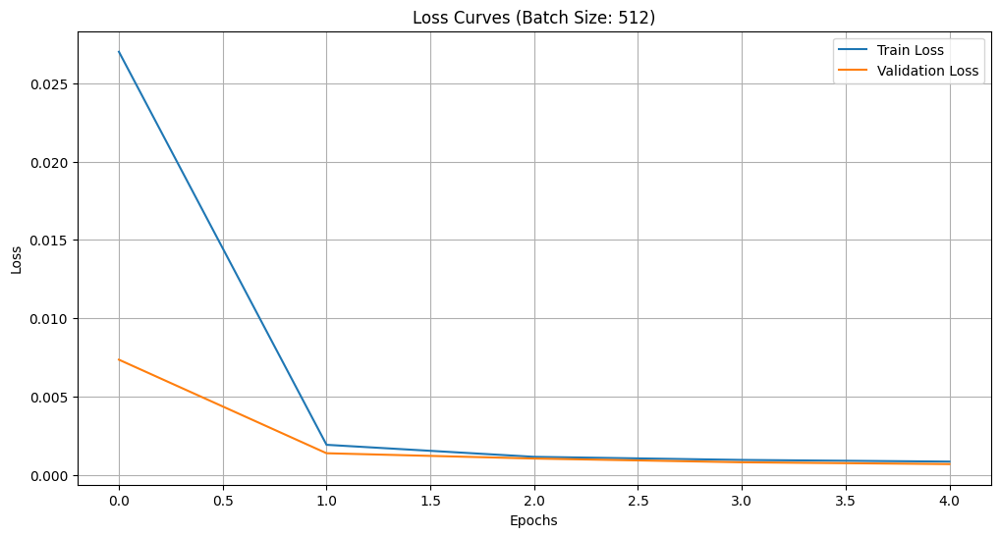

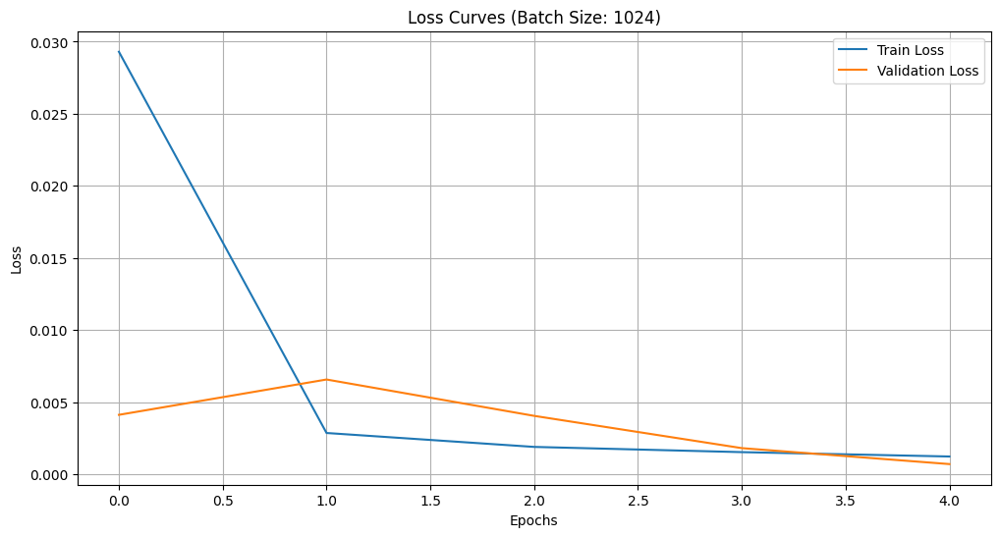

In [ ]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

input : Open + High + Low + Volume + past_day_close + RoBERTa

In [ ]:
from sklearn.model_selection import train_test_split

past_nasdaq_roberta = ['Open', 'High', 'Low', 'Volume', 'past_day_close', 'roberta_sentiment']

X, y = create_dataset(df[past_nasdaq_roberta].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [ ]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])

    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)

    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 32, MSE: 0.018, RMSE: 0.133, R-squared: 0.706
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 64, MSE: 0.027, RMSE: 0.164, R-squared: 0.555
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 128, MSE: 0.032, RMSE: 0.179, R-squared: 0.470
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Batch Size: 256, MSE: 0.018, RMSE: 0.133, R-squared: 0.706
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 512, MSE: 0.008, RMSE: 0.089, R-squared: 0.868
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 1024, MSE: 0.009, RMSE: 0.097, R-squared: 0.843


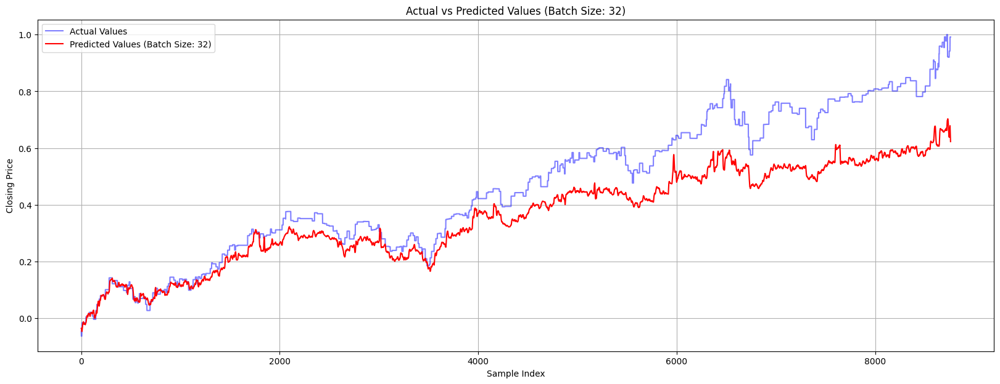

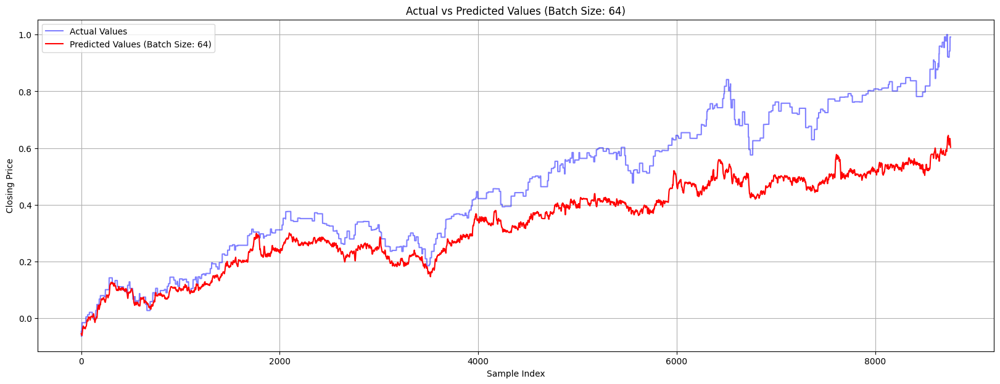

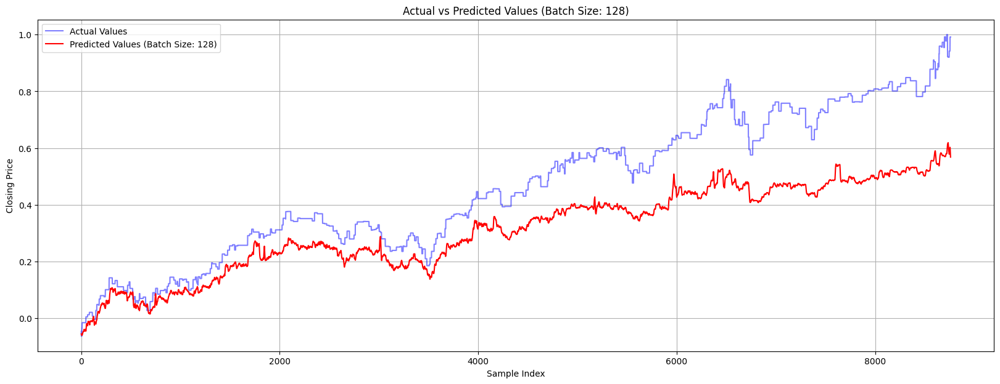

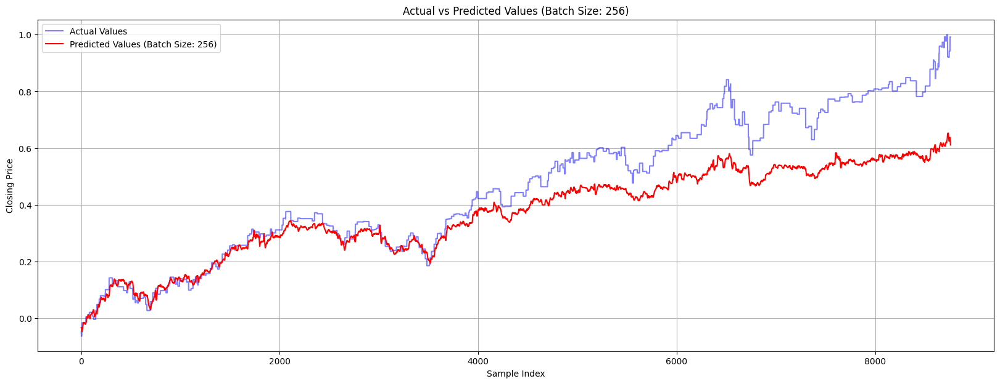

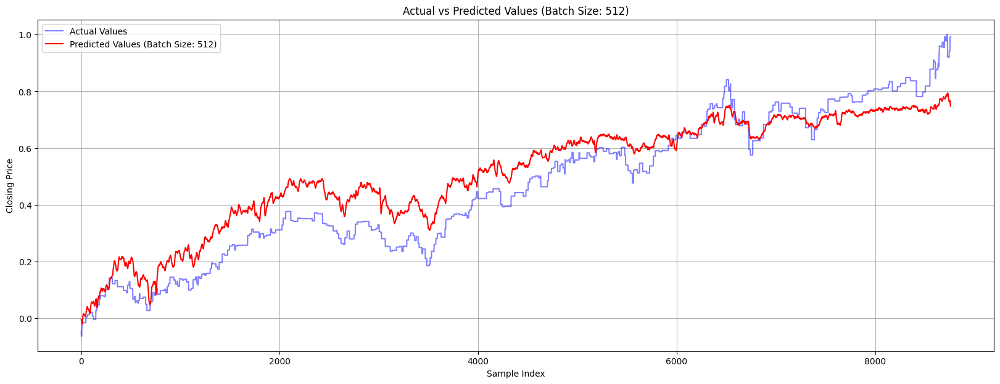

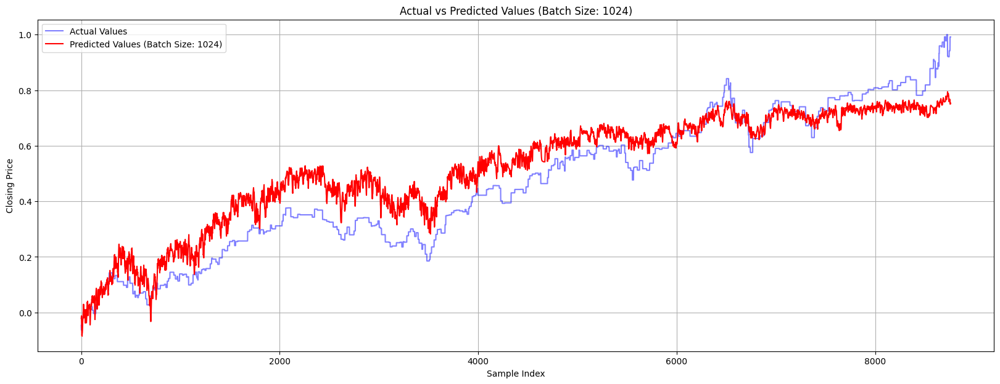

In [ ]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))

    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)

    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')

    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

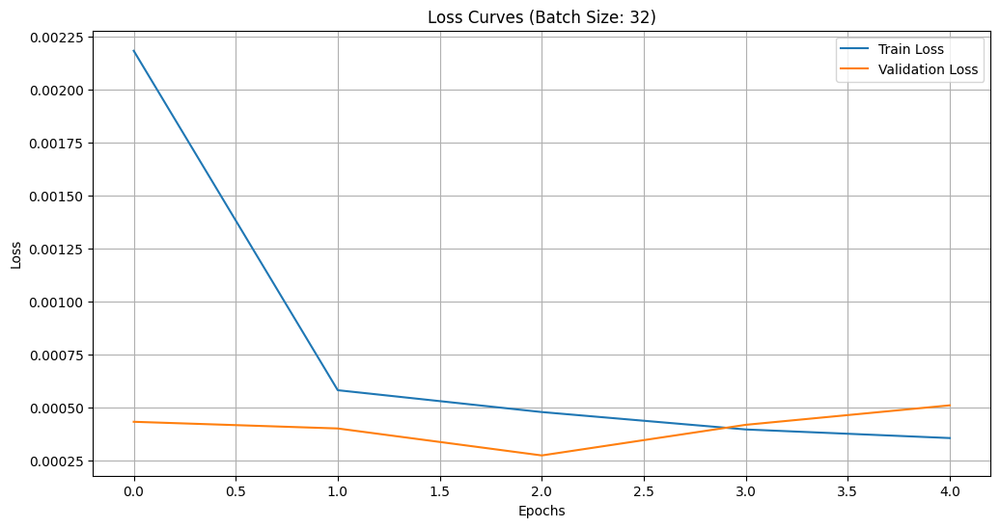

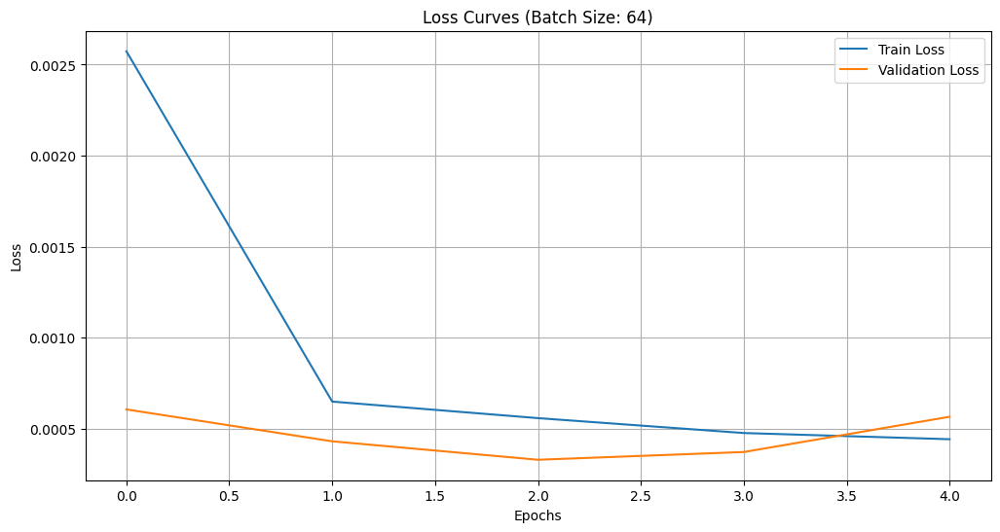

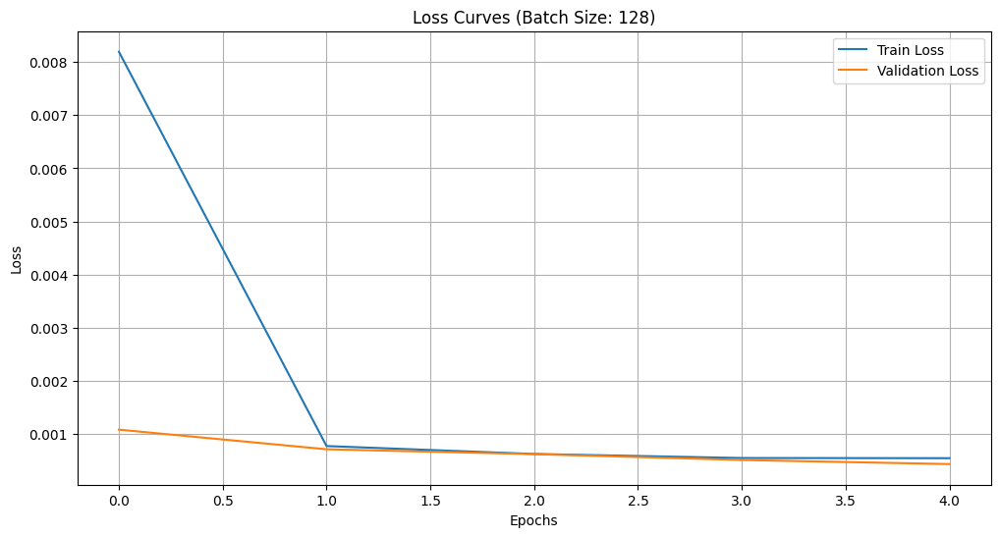

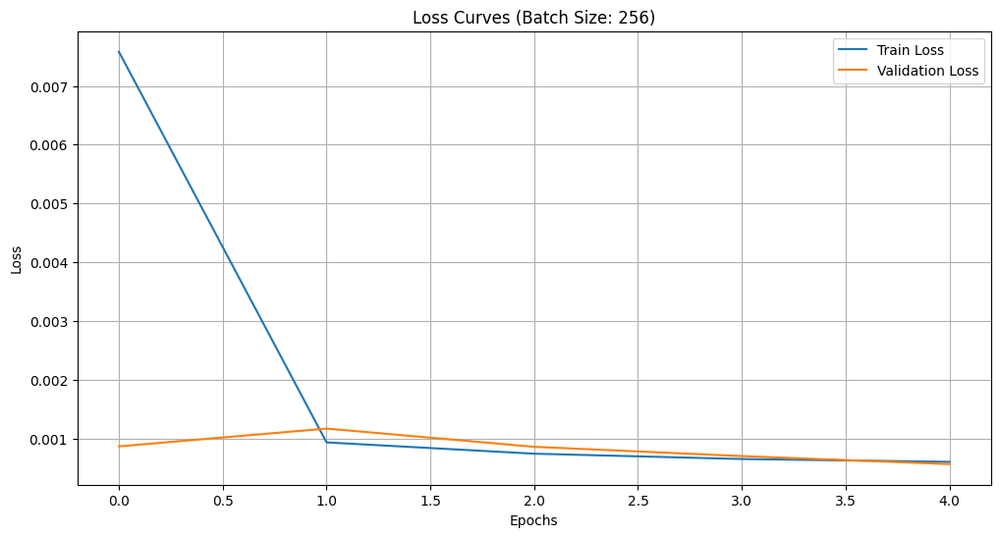

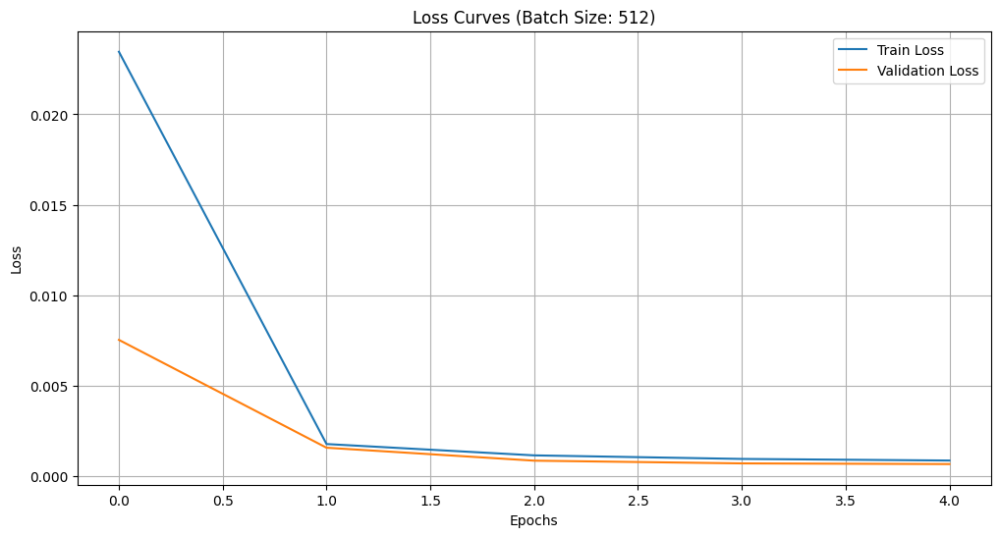

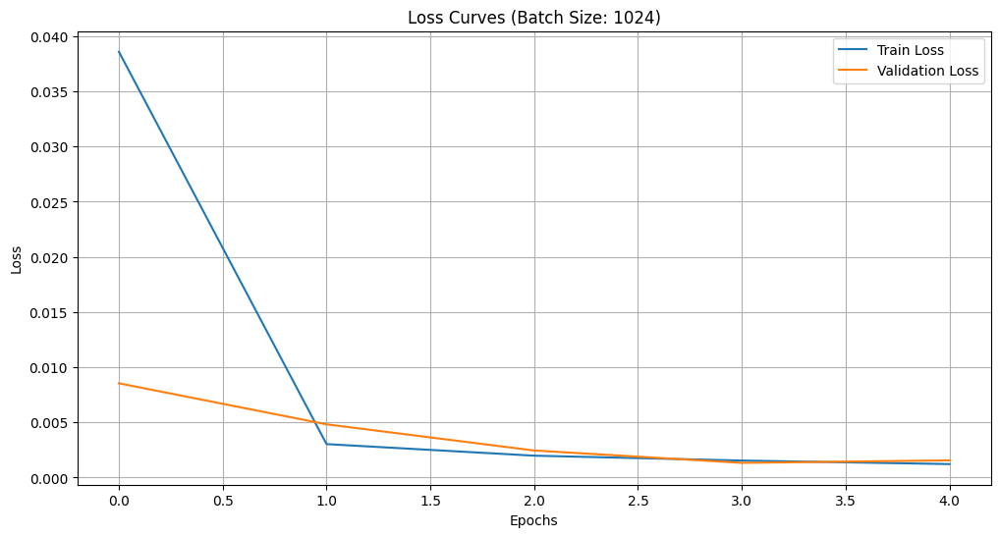

In [ ]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

input : Open + High + Low + Volume + past_day_close + VADER + RoBERTa

In [ ]:
from sklearn.model_selection import train_test_split

past_nasdaq_sentiment = ['Open', 'High', 'Low', 'Volume', 'past_day_close', 'vader_sentiment', 'roberta_sentiment']

X, y = create_dataset(df[past_nasdaq_sentiment].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [ ]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])

    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)

    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Batch Size: 32, MSE: 0.028, RMSE: 0.169, R-squared: 0.528
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Batch Size: 64, MSE: 0.037, RMSE: 0.192, R-squared: 0.387
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 128, MSE: 0.033, RMSE: 0.181, R-squared: 0.455
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Batch Size: 256, MSE: 0.006, RMSE: 0.080, R-squared: 0.894
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 512, MSE: 0.007, RMSE: 0.085, R-squared: 0.880
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Batch Size: 1024, MSE: 0.005, RMSE: 0.071, R-squared: 0.916


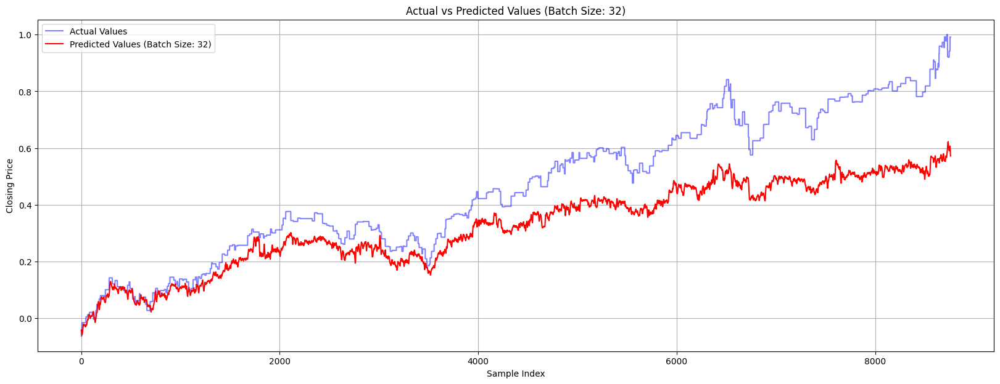

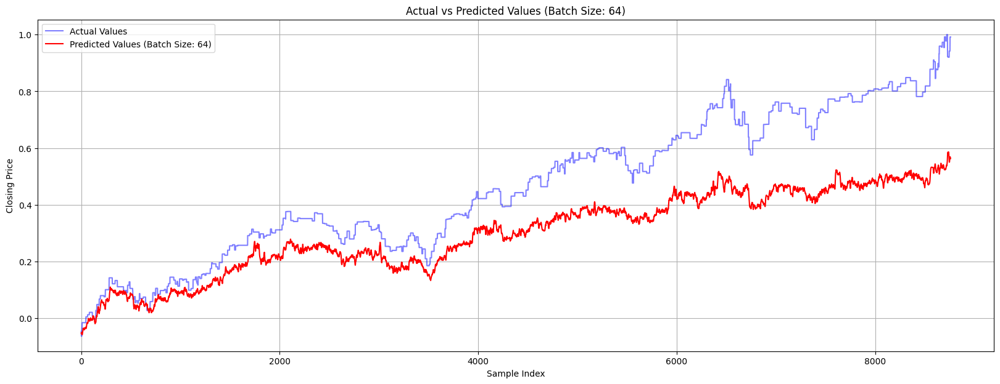

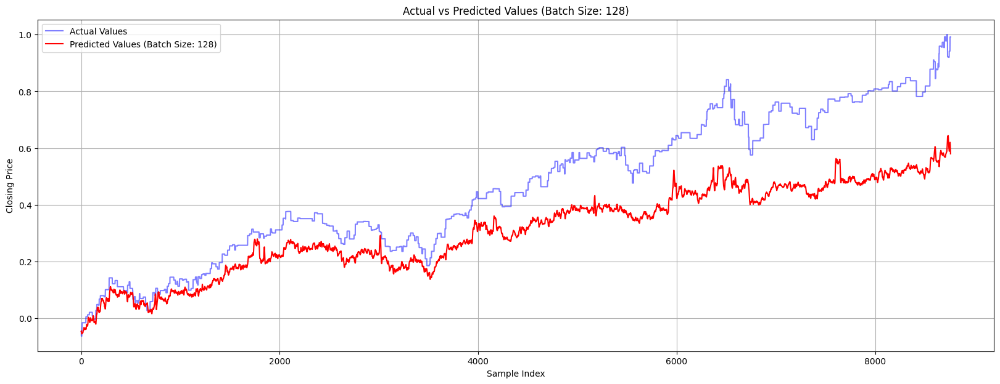

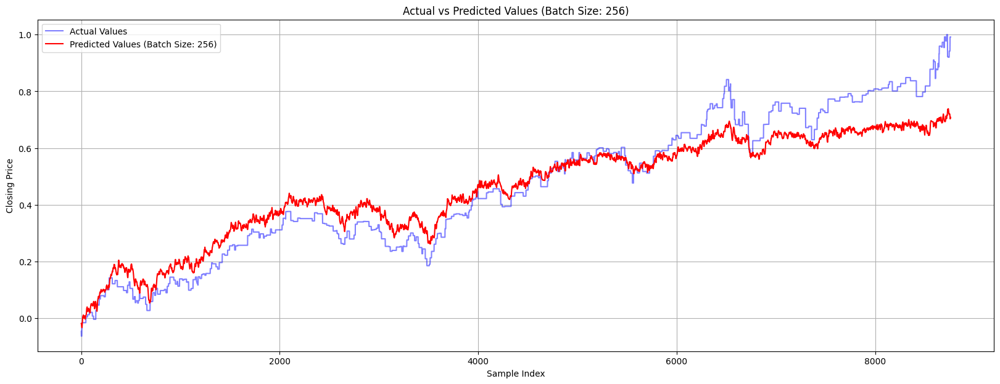

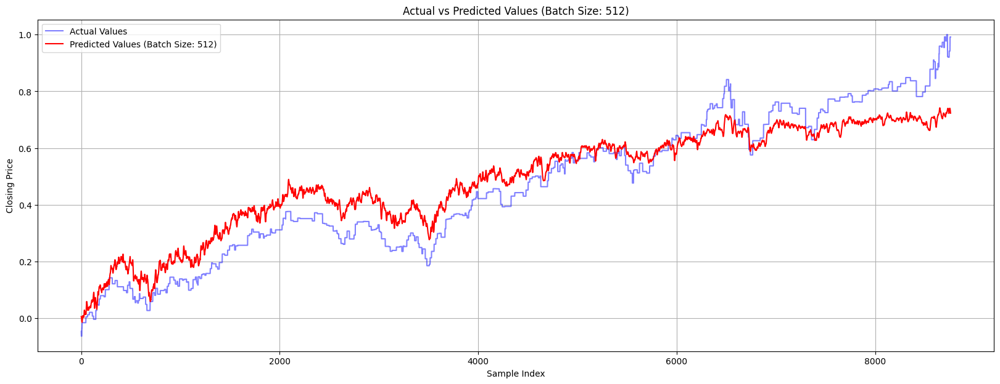

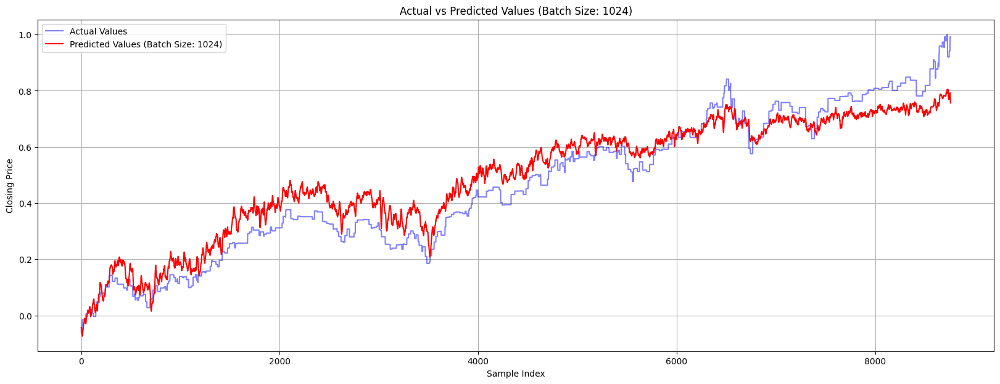

In [ ]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))

    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)

    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')

    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

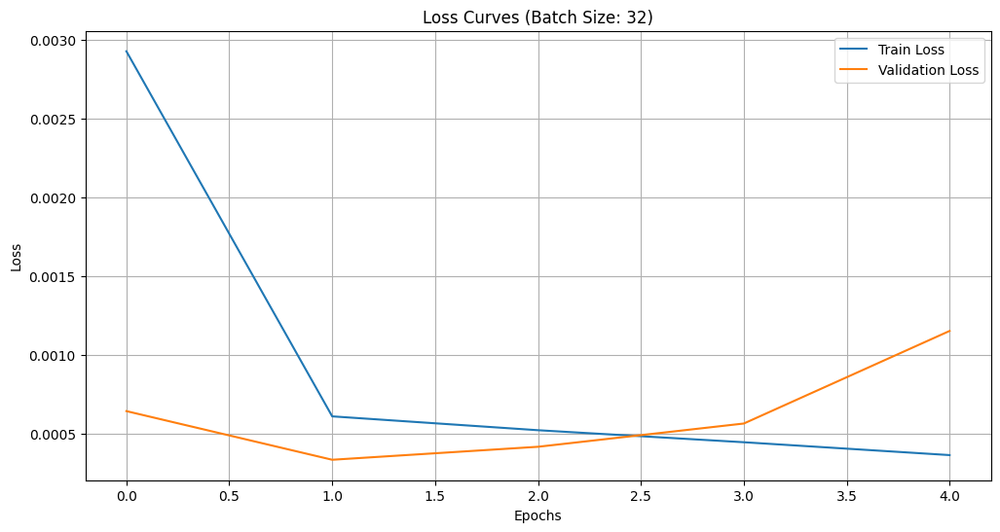

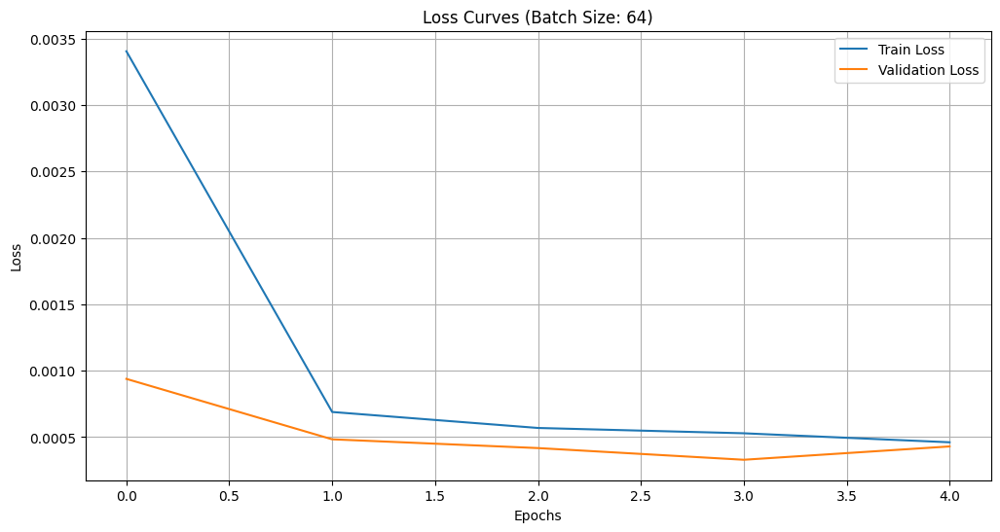

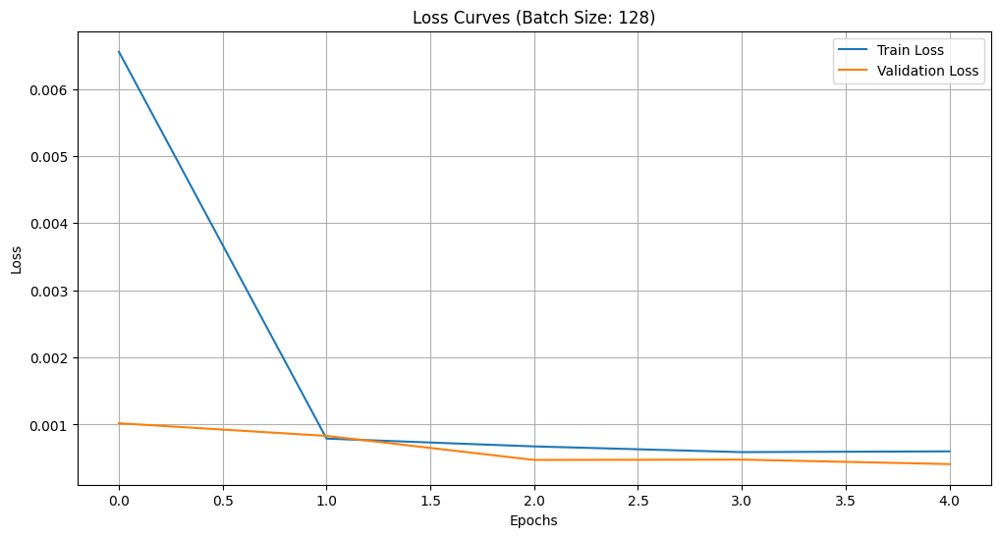

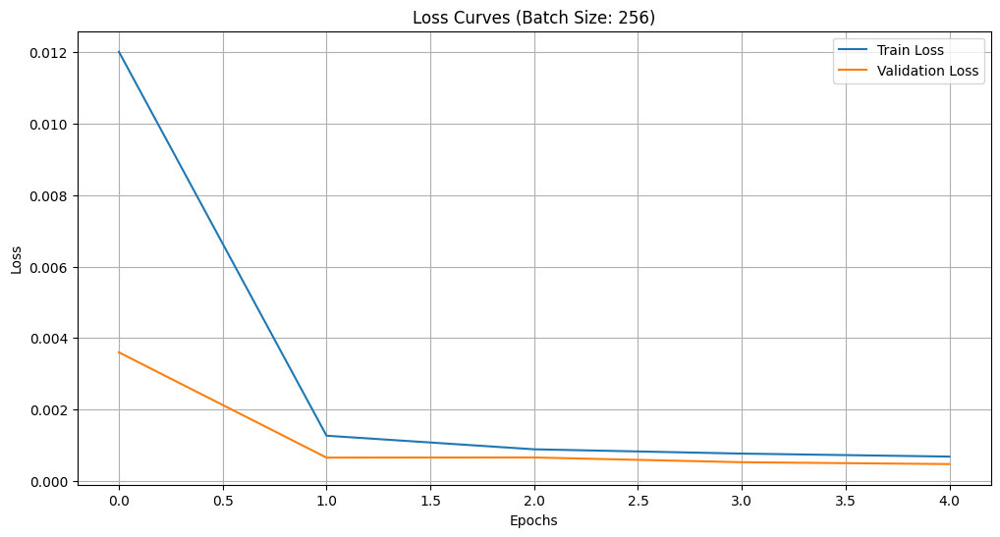

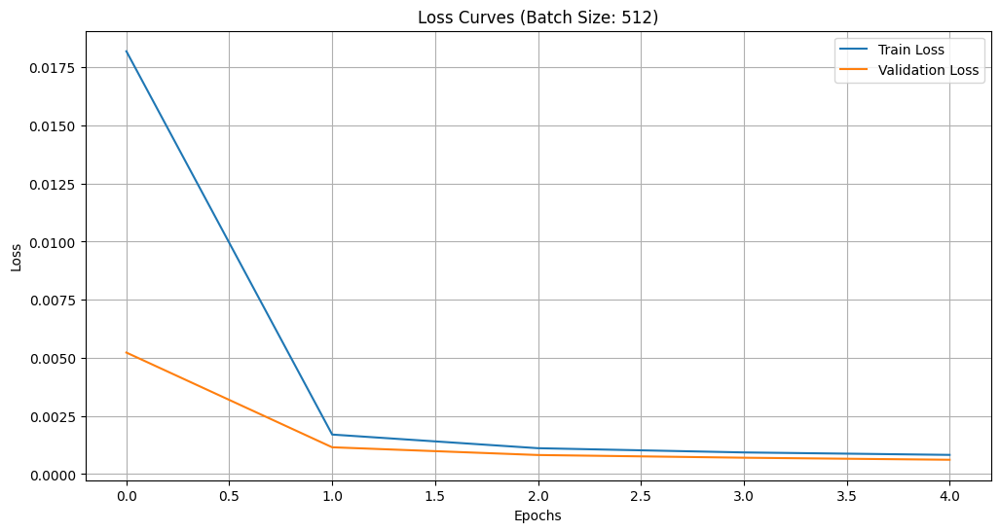

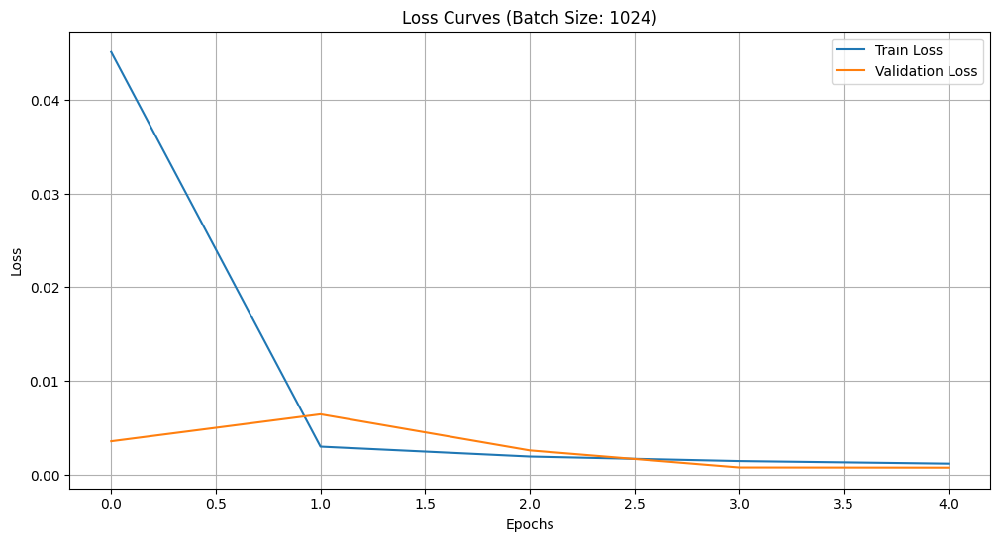

In [ ]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()